# Requirement 5: Slightly non-stationary environments with multiple products

This notebook was developed by:
- Carminati Gabriele
- Compagnoni Riccardo Domingo
- De Introna Federico
- Di Giore Francesco
- Fossa' Chiara

The aim of this notebook is to analyze how well a Combinatorial-UCB with Sliding Window agent performs in a dynamic pricing scenario, with:
- slightly non-stationary stochastic environment
- multiple types of products to sell.
- only one customer at each round.
- with a budget constraint on the global units of products sold.
- the seller can sell multiple products at each round.

Then, a comparison is done between the Combinatorial-UCB with SW agent and the Primal-Dual agent.

In [2]:
import numpy as np
import cvxpy as cp
import matplotlib.pyplot as plt
from scipy.special import expit, logit
from joblib import Parallel, delayed
from tqdm.auto import tqdm
import multiprocessing as mp
from threading import Thread
from math import erf
from scipy import optimize
import scipy.stats as stats
from scipy.stats import random_correlation

c:\Users\digio\OneDrive\Documents\Francesco\Universita\Secondo Anno Magistrale\Online Learning Applications\Project\.venv\Lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


### Definition of the Environment

We define an environment with multiple products, where customer preferences are modeled by **joint valuations**.  
Specifically, valuations follow a **multivariate logit-normal distribution**.  

- The latent Gaussian parameters $(\mu, \Sigma)$ are approximated using the **delta method**, given the desired mean and covariance in valuation space.  
- For each round, product valuations are sampled by drawing from the latent multivariate normal and applying the **sigmoid transformation** to map values into $[0,1]$.  
- A purchase occurs if a product’s valuation exceeds its price, and the purchase probability can be computed directly from the latent distribution.  

Then, to make it **slightly non-stationary**, we define a specific number of intervals by considering the number of rounds each interval lasts, and the distribution inside each interval remains fixed, while from an interval to the next one, the distribution changes, mean and variance are randomly smapled.

In [3]:
class MultiProductPricingEnvironmentJumps:
    def __init__(self, products,
                 means,
                 covs,
                 seed=42,
                 mean_update_std = 0.05,
                 plot_distribution = False,
                 change_rounds = 600
                  ):
        self.products = products
        self.d = len(products)
        self.means, self.covs = self.delta_method_latent_from_logitnormal(means, covs)
        self.rng = np.random.default_rng(seed)
        self.rng_distribution = np.random.default_rng(seed)
        self.mean_update_std = mean_update_std
        self.current_vals = None
        self.change_rounds = change_rounds
        self.count = 0
        self.plot_distribution = plot_distribution

    def compute_Q(self, prices_grid, eps = 1e-12):
        dvs = np.sqrt(np.clip(np.diag(self.covs), 0.0, None))

        pc = np.clip(prices_grid, eps, 1 - eps)
        logits = np.log(pc / (1 - pc))

        Phi = lambda x: 0.5 * (1.0 + np.vectorize(erf)(x / np.sqrt(2.0)))
        z = (logits[None, :] - self.means[:, None]) / np.where(dvs > 0, dvs, 1.0)[:, None]
        Q = 1.0 - Phi(z)

        Q[:, prices_grid <= 0.0] = 1.0
        Q[:, prices_grid >= 1.0] = 0.0

        # If there are determinist prices (zero variance), set the prices above the valuation to 0 and 1 below
        det = dvs == 0.0
        if np.any(det):
            v = 1.0 / (1.0 + np.exp(-self.means[det]))
            Q[det] = (v[:, None] >= prices_grid[None, :]).astype(float)

        # Clip Q values to prevent them from being exactly zero
        Q = np.clip(Q, eps, 1.0 - eps)

        return Q
    
    @staticmethod
    def delta_method_latent_from_logitnormal(m, C):
        """
        Approximate latent Gaussian parameters (mu, Sigma_Z) for a multivariate logit-normal
        with desired mean vector m in (0,1)^d and covariance C.
        Uses first-order delta method:
            J = diag( m_i * (1 - m_i) )
            Sigma_Z ≈ J^{-1} C J^{-1}
            mu ≈ logit(m)
        """
        m = np.asarray(m, dtype=float)
        C = np.asarray(C, dtype=float)
        if m.ndim != 1:
            raise ValueError("m must be a 1-D array of means in (0,1).")
        if C.shape != (m.size, m.size):
            raise ValueError("C must be a square matrix with same dimension as m.")
        if np.any((m <= 0) | (m >= 1)):
            raise ValueError("All entries of m must lie strictly in (0,1).")

        mu = logit(m)
        gprime = m * (1.0 - m)  # derivative of expit at mu where expit(mu)=m
        if np.any(gprime <= 0):
            raise ValueError("Means too close to 0 or 1 make the delta method unstable.")
        Jinv = np.diag(1.0 / gprime)
        Sigma_Z = Jinv @ C @ Jinv
        # Symmetrize small numerical asymmetry
        Sigma_Z = 0.5 * (Sigma_Z + Sigma_Z.T)
        return mu, Sigma_Z

    def update_distribution(self):
        # mean and variance a uniformly smapled
        final_means = self.rng_distribution.uniform(0.1, 0.9, self.d)
        final_vars = self.rng_distribution.uniform(0., 0.01, self.d)

        eigs = self.rng_distribution.dirichlet(np.ones(self.d)) * self.d
        R = random_correlation.rvs(eigs, random_state=self.rng_distribution)  # reproducible with your rng

        # Scale by variances to get the covariance
        std = np.sqrt(np.asarray(final_vars))  # use your existing variance draws
        final_cov = R * np.outer(std, std)

        self.means, self.covs = self.delta_method_latent_from_logitnormal(final_means, final_cov)

        self.cached_valuations = False
        n_samples = 100_000
        bins=100
        samples = self.sample_valuations(n_samples)
        if self.plot_distribution:
            for i, product in enumerate(self.products):
                plt.figure(figsize=(7, 3))
                plt.hist(samples[:, i], bins=bins, density=True)
                plt.title(f"Distribution of valuations for product {product} (100000 rounds)")
                plt.xlabel("valuation")
                plt.ylabel("density")
                plt.xlim(0, 1)
                plt.tight_layout()
                plt.show()

        self.valuations_samples = self.sample_valuations(self.change_rounds)
        self.i = 0
        self.cached_valuations = True

    def sample_valuations(self, n=1):
        z = self.rng.multivariate_normal(self.means, self.covs, size=n)
        vals = expit(z)
        if n == 1:
            self.current_vals = vals.ravel()
        else:
            self.current_vals = vals
        return self.current_vals

    def round(self, chosen_prices):
        # we count how many rounds a distribution lasts, and if the interval finishes, the distribution is changed
        if self.count < self.change_rounds:
            self.count += 1
        else:
            self.count = 0
            self.update_distribution()
        chosen_prices_arr = np.array([chosen_prices[p] for p in self.products], dtype=float)
        vals = self.sample_valuations()
        sold = (vals >= chosen_prices_arr).astype(int)
        reward = np.multiply(chosen_prices_arr, sold)
        return reward, sold
    
    def get_current_vals(self):
        """Return last sampled valuations (all environments support this now)."""
        return self.current_vals

We define also a wrapper for the environment because if there is the need to add more environments, this wrapper makes the addition simpler and fast.

In [4]:
class PricingEnvironmentWrapper:
    def __init__(self, products, mean=None, cov=None, change_rounds=30, seed=None):
        self.products = products
        self.d = len(products)
        self.env_type = "logitnormal"
        if mean is None or cov is None:
            raise ValueError("Logit-Normal requires mean and cov.")
        self.env = MultiProductPricingEnvironmentJumps(products, mean, cov, seed, change_rounds=change_rounds)

    def round(self, chosen_prices):
        reward, sold = self.env.round(chosen_prices)
        return reward, sold

    def compute_Q(self, prices_grid):
        if not hasattr(self.env, "compute_Q"):
            raise NotImplementedError(f"Environment does not implement compute_Q")
        return self.env.compute_Q(prices_grid)

    def get_products(self):
        return self.products

    def get_current_vals(self):
        """Return last sampled valuations (all environments support this now)."""
        return self.env.current_vals
    
    def get_current_alpha(self):
        return self.env.get_current_alpha()
    
    def get_means(self):
        return self.env.means

### Definition of the Agents: Combinatorial-UCB with GP and SW, and Primal-Dual with multiple EXP3.P

The agent implements a Primal-Dual algorithm with multiple EXP3.P, one for each product. We extend the EXP3.P algorithm used for Requirement 3 by inlcuding a discount factor to discount the weights and somehow forget a bit the past values, given that the environment is non-stationary.

For the Dual, we consider a smoothed $ \lambda $ update for each EXP3.P agent, each updated independently of the others. 

In [5]:
class DiscountedEXP3PAgent:
    """
    EXP3.P agent with discounting for non-stationary rewards.
    """
    def __init__(self, K, T, alpha, gamma, discount=0.99):
        self.K = K
        self.T = T
        self.alpha = alpha
        self.gamma = gamma
        self.discount = discount
        self.t = 0
        self.weights = np.ones(K, dtype=float)
        self.probs = np.ones(K) / K
        self.a_t = None

    def pull_arm(self):
        # Probability distribution with smoothing
        wsum = np.sum(self.weights)
        if wsum <= 0:
            # numerical fallback
            self.weights = np.ones_like(self.weights)
            wsum = np.sum(self.weights)
        self.probs = (1 - self.gamma) * (self.weights / wsum) + (self.gamma / self.K)
        self.probs = np.clip(self.probs, 1e-12, 1.0)
        self.probs /= np.sum(self.probs)
        self.a_t = np.random.choice(self.K, p=self.probs)
        return self.a_t

    def update(self, reward):
        """
        reward: scaled to [0,1]
        """
        i = self.a_t
        self.t += 1

        # Discount past weights
        self.weights *= self.discount

        # Unbiased estimator
        x_hat = np.zeros(self.K)
        x_hat[i] = reward / max(self.probs[i], 1e-12)
        # Bias correction
        x_hat += self.alpha / (np.sqrt(self.K * self.T) * np.clip(self.probs, 1e-12, 1.0))
        # print(x_hat)

        # Weight update (multiplicative)
        exponent = (self.gamma / self.K) * x_hat
        # To avoid overflow, clip exponent
        exponent = np.clip(exponent, -700, 700)
        self.weights *= np.exp(exponent)

        # Numerical safety
        self.weights = np.clip(self.weights, 1e-12, 1e300)
        # print(self.weights)

    def get_probs(self):
        """
        Return the current probability distribution over arms.
        """
        return self.probs.copy()    

In [6]:
class PrimalDualPricingAgent:
    """
    Primal-dual agent for multi-product pricing with inventory constraints.
    Uses Discounted EXP3.P per product.
    """
    def __init__(self, products, prices, budget, T, eta, K, discount=0.99, log_history=True):
        self.products = list(products)
        self.prices = prices
        self.K = K
        self.T = T
        self.budget = budget
        self.initial_budget = budget
        self.eta = eta
        self.discount = discount
        self.lmbd = 1.0
        self.t = 0
        self.rho = self.initial_budget / self.T
        self.lambda_max = 1.0
        self.counts = {}
        self.log_history = log_history
        self.p_max = max(max(v) for v in prices.values()) if len(prices) > 0 else 1.0
        # cost is in {0,1} per your description => c_max = 1
        self.c_max = 1.0
        # L in [-lambda_max, p_max] -> use O = lambda_max, U = p_max + lambda_max
        self.O = self.lambda_max
        self.U = self.p_max + self.lambda_max
        self.lambda_smooth = 0.1
        self.price_indices = {p: 0 for p in products}
        self.agents = {}
        for p in self.products:
            Kp = len(self.prices[p])
            # set sensible defaults for alpha/gamma, but allow customization by caller if desired
            delta = 0.1
            alpha = 2.0 * np.sqrt(np.log((Kp*T)/delta))
            gamma = min(3/5, 2.0 * np.sqrt((3.0 * Kp * np.log(max(Kp,2))) / (5.0 * max(1, T))))
            self.agents[p] = DiscountedEXP3PAgent(K=Kp, T=T, alpha=alpha, gamma=gamma, discount=self.discount)
            self.counts[p] = np.zeros(Kp, dtype=int)

        if self.log_history:
            self.history = {
                "lambda": [],
                "chosen_prices": [],
                "probs": {p: [] for p in self.products}
            }


    def pull_prices(self):
        chosen_prices_idx = {}
        for p, agent in self.agents.items():
            if self.budget <= 0:
                chosen_prices_idx[p] = -1
            else:
                chosen_prices_idx[p] = agent.pull_arm()
                self.counts[p][chosen_prices_idx[p]] += 1
        self.price_indices = chosen_prices_idx

        chosen_prices = {p: self.prices[p][idx] if idx >= 0 else idx
                         for p, idx in chosen_prices_idx.items()}
        
        if self.log_history:
            self.history["lambda"].append(self.lmbd)
            self.history["chosen_prices"].append(chosen_prices)
            for p in self.products:
                self.history["probs"][p].append(self.agents[p].get_probs().copy())
        return chosen_prices

    def update(self, rewards, costs):
        self.t += 1
        rewards = np.asarray(rewards, dtype=float)
        costs = np.asarray(costs, dtype=float)

        # Total cost across products this round
        total_cost = np.sum(costs)
        avg_cost_per_product = total_cost / max(1, len(self.products))

        lmbd_candidate = self.lmbd + self.eta * (avg_cost_per_product - self.rho)
        self.lmbd = (1 - self.lambda_smooth) * self.lmbd + self.lambda_smooth * np.clip(lmbd_candidate, 0.0, self.lambda_max)

        # For each product compute L and send the fixed normalized L_scaled in [0,1] to that product's agent
        for i, p in enumerate(self.products):
            idx = self.price_indices[p]
            if idx < 0:
                # wasn't selected (budget exhausted), skip update for this product
                continue

            # raw Lagrangian reward for this product
            L = rewards[i] - self.lmbd * (costs[i] -self.rho)  # reward in [-lambda_max, p_max]

            # fixed normalization to [0,1]
            L_scaled = (L + self.O) / self.U
            L_scaled = float(np.clip(L_scaled, 0.0, 1.0))

            # update the per-product EXP3.P agent with normalized reward
            self.agents[p].update(L_scaled)

        # Deduct realized cost from remaining budget
        self.budget -= total_cost
        # ensure budget doesn't go negative
        self.budget = max(self.budget, 0.0)

    def get_history(self):
        return self.history
    
    def get_action_counts(self):
        return {p: self.counts[p].copy() for p in self.products}

    def print_latest_probs(self):
        print(f"Round {self.t}, lambda={self.lmbd:.3f}")
        for p in self.products:
            probs = self.agents[p].get_probs()
            print(f"Product {p}:")
            for price, prob in zip(self.prices[p], probs):
                print(f"  price={price:.2f}, prob={prob:.3f}")
        print("-"*40)    

Then, we use the Combinatorial-UCB agent with Gaussian Processes (GP) extended with the Sliding Window (SW) approach to deal with slightly non-stationary environments.

In [7]:
class RBFGaussianProcess:
    def __init__(self, scale=1, reg=1e-2, window=None):
        self.scale = scale
        self.reg = reg
        self.window = window
        self.k_xx_inv = None

    def rbf_kernel_incr_inv(self, B, C, D):
        # (tiny) numerical jitter on the 1x1 Schur complement to avoid near-singularity
        S = D - C @ self.k_xx_inv @ B
        # S is 1x1 here; add an epsilon to its diagonal
        S[0, 0] += 1e-12
        temp = np.linalg.inv(S)
        block1 = self.k_xx_inv + self.k_xx_inv @ B @ temp @ C @ self.k_xx_inv
        block2 = - self.k_xx_inv @ B @ temp
        block3 = - temp @ C @ self.k_xx_inv
        block4 = temp
        res1 = np.concatenate((block1, block2), axis=1)
        res2 = np.concatenate((block3, block4), axis=1)
        res = np.concatenate((res1, res2), axis=0)
        # Symmetrize to damp round-off drift (K^{-1} should be symmetric)
        res = 0.5 * (res + res.T)
        return res

    def rbf_kernel_decr_inv_pop_left(self):
        if self.k_xx_inv is None:
            return None
        n = self.k_xx_inv.shape[0]
        if n == 1:
            return None
        Kinv = self.k_xx_inv
        alpha = Kinv[0, 0]               # scalar
        beta  = Kinv[1:, [0]]            # (n-1, 1)
        Gamma = Kinv[1:, 1:]             # (n-1, n-1)
        new_inv = Gamma - (beta @ beta.T) / alpha
        # Symmetrize for numerical hygiene
        new_inv = 0.5 * (new_inv + new_inv.T)
        return new_inv

    def rbf_kernel(self, a, b):
        a_ = np.array(a).reshape(-1, 1)
        b_ = np.array(b).reshape(-1, 1)
        output = -1 * np.ones((a_.shape[0], b_.shape[0]))
        for i in range(a_.shape[0]):
            output[i, :] = np.power(a_[i] - b_, 2).ravel()
        return np.exp(-self.scale * output)

    def fit(self, x=np.array([]), y=np.array([])):
        x, y = np.array(x), np.array(y)

        # enforce sliding window (drop oldest) BEFORE appending
        if self.window is not None and self.k_xx_inv is not None:
            # how many we have now vs allowed
            n_now = len(getattr(self, "x", []))
            if n_now >= self.window:
                self.k_xx_inv = self.rbf_kernel_decr_inv_pop_left()
                # drop oldest x,y to keep arrays aligned
                self.x = self.x[1:, :]
                self.y = self.y[1:, :]

        if self.k_xx_inv is None:
            self.y = y.reshape(-1, 1)
            self.x = x.reshape(-1, 1)
            k_xx = self.rbf_kernel(self.x, self.x) + self.reg * np.eye(self.x.shape[0])
            self.k_xx_inv = np.linalg.inv(k_xx)
        else:
            B = self.rbf_kernel(self.x, x)
            self.x = np.vstack((self.x, x))
            self.y = np.vstack((self.y, y))
            # IMPORTANT: make D a (1,1) array, not shape (1,)
            D = np.array([[1.0 + self.reg]])
            self.k_xx_inv = self.rbf_kernel_incr_inv(B, B.T, D)

        return self

    def predict(self, x_predict):
        k = self.rbf_kernel(x_predict, self.x)
        mu_hat = k @ self.k_xx_inv @ self.y
        # numerical-safe variance: clip tiny negatives due to round-off
        S = k @ self.k_xx_inv @ k.T
        sigma_hat = 1.0 - np.diag(S)
        sigma_hat = np.maximum(sigma_hat, 0.0)
        return mu_hat.ravel(), sigma_hat.ravel()

In [8]:
class OptimisticBandit:
    def __init__(self, products, prices, budget, T, W, seed=42):
        self.T = T
        self.prices = prices
        # Scale is particularly important: it determines how much a point's update affects the points around it.
        # The higher the scale the more point-wise the gp is, the lower the smoother
        self.gps = [RBFGaussianProcess(scale=30, window=W).fit() for _ in range(len(products))]
        self.a_t = np.zeros(len(products))
        self.a_t_indices = np.zeros(len(products), dtype=int)
        self.mu_ts = np.zeros((len(products), len(prices)))
        self.sigma_ts = np.zeros((len(products), len(prices)))
        self.gamma = lambda t: np.log(t+1)**2
        self.beta = lambda t: 1 + 0.5*np.sqrt(2 * (self.gamma(t) + 1 + np.log(self.T)))
        self.N_pulls = np.zeros((len(products), len(prices)))
        self.t = 1
        self.products = products
        self.rho_t = budget/T
        self.rhos = [self.rho_t]
        self.lr = 0.1
        self.rem_budget = budget
        self.idxs_by_product = {pr: i*len(prices) + np.arange(len(prices)) for i, pr in enumerate(self.products)}
        self.n_arms = len(prices)*len(products)
        self.rng = np.random.default_rng(seed)
        self.r_ucbs = []
        self.c_lcbs = []


    def plot_rhos(self):
        plt.figure(figsize=(15, 8))
        plt.plot(np.arange(len(self.rhos)), self.rhos[:len(self.rhos)])
        initial_value = self.rhos[0]
        plt.axline((0, initial_value), (1, initial_value), linewidth=4, color='r')
        plt.title("Agent's learnt rhos")
        plt.show()

    def amplify_bound(self, sigma):
        # Sigmas are between 0. and 1. so sqrt increases especially the values of sigmas close to 0.
        return np.power(sigma, 0.5)


    def play(self):
        ucbs = np.zeros(len(self.products)*len(self.prices))
        lcbs = np.zeros(len(self.products)*len(self.prices))
        for i, (p, idxs) in enumerate(self.idxs_by_product.items()):
            self.mu_ts[i], self.sigma_ts[i] = self.gps[i].predict(self.prices)
            lcbs[idxs] = self.mu_ts[i] - self.beta(self.t) * self.sigma_ts[i]
            c_ucb = self.mu_ts[i] + self.beta(self.t) * self.amplify_bound(self.sigma_ts[i])
            ucbs[idxs] = c_ucb*self.prices

        lcbs = np.clip(lcbs, 0.005, 1.)
        self.r_ucbs.append(ucbs)
        self.c_lcbs.append(lcbs)

        x = cp.Variable(self.n_arms)
        obj = cp.Maximize(ucbs @ x)
        constraints = [
            lcbs @ x <= self.rho_t,
            x >= 0,
        ]
        # Each product: choose at most one price
        for p, idxs in self.idxs_by_product.items():
            constraints.append(cp.sum(x[idxs]) == 1)
        # Default case
        xv = np.zeros(self.n_arms)
        for _, idxs in self.idxs_by_product.items():
            xv[idxs[-1]] = 1.0
        try:
            prob = cp.Problem(obj, constraints)
            prob.solve(solver=cp.CLARABEL)
        except Exception as e:
            print(lcbs)
            print(ucbs)
            print(self.t)
            print(self.sigma_ts)
            print(e)

        if x.value is not None:
            xv = np.asarray(x.value).ravel()
            # For some reason it sometimes happens that some values are greater than 1.
            xv = np.clip(xv, 0., 1.)

        # Build action: sample from xv
        for i, (p, idxs) in enumerate(self.idxs_by_product.items()):
            sum_x = np.sum(xv[idxs])
            normalized_p = xv[idxs]/sum_x
            k = self.rng.choice(idxs, p=normalized_p)
            idx = int(k%len(self.prices))
            self.a_t[i] = float(self.prices[idx])
            self.a_t_indices[i] = idx
        chosen_prices = {p: self.prices[idx] for p, idx in zip(self.products, self.a_t_indices)}
        return chosen_prices

    def plot_ucbs(self, extensive=False):
        R = np.asarray(self.r_ucbs)   # (t, A)
        C = np.asarray(self.c_lcbs)   # (t, A)
        t = np.arange(1, R.shape[0] + 1)
        if extensive:
            for i, p in enumerate(self.products):
                for k, pr in enumerate(self.prices):
                    k = i*len(self.prices) + k
                    fig, ax = plt.subplots(figsize=(7, 3))
                    ax.plot(t, R[:, k], label="r_ucb")
                    ax.plot(t, C[:, k], label="c_lcb")
                    ax.set_title(f"{p} @ {pr:g}")
                    ax.set_xlabel("time")
                    ax.set_ylabel("value")
                    ax.legend()
                    ax.grid(alpha=0.3)
                    plt.show()

        last_C = C[-1]  # (A,)
        for prod in self.products:
            idxs = self.idxs_by_product[prod]
            x = self.prices      # prices for this product
            y = last_C[idxs]     # last c_lcb for those arms

            order = np.argsort(x)
            x, y = x[order], y[order]

            fig, ax = plt.subplots(figsize=(7, 3))
            ax.plot(x, y, linewidth=1, alpha=0.7)
            ax.scatter(x, y)

            # annotate each point with its y value
            for xi, yi in zip(x, y):
                ax.annotate(f"{yi:.4f}", (xi, yi),
                            textcoords="offset points", xytext=(6, 6), ha="left")

            ax.set_title(f"Last c_lcb by price — {prod}")
            ax.set_xlabel("price")
            ax.set_ylabel("last c_lcb")
            ax.grid(alpha=0.3)
            plt.show()

        last_R = R[-1]  # (A,)
        for prod in self.products:
            idxs = self.idxs_by_product[prod]
            x = self.prices        # prices for this product
            y = last_R[idxs]       # last c_lcb for those arms

            order = np.argsort(x)
            x, y = x[order], y[order]

            fig, ax = plt.subplots(figsize=(7, 3))
            ax.plot(x, y, linewidth=1, alpha=0.7)
            ax.scatter(x, y)

            # annotate each point with its y value
            for xi, yi in zip(x, y):
                ax.annotate(f"{yi:.4f}", (xi, yi),
                            textcoords="offset points", xytext=(6, 6), ha="left")

            ax.set_title(f"Last r_lcb by price — {prod}")
            ax.set_xlabel("price")
            ax.set_ylabel("last r_lcb")
            ax.grid(alpha=0.3)
            plt.show()

    def update(self, sold, ):
        self.N_pulls[np.arange(len(self.products)), self.a_t_indices] += 1
        self.gps = [self.gps[i].fit(self.prices[self.a_t_indices[i]], sold[i]) for i in range(len(sold))]
        self.t += 1
        tot_sold = np.sum(sold)
        self.rem_budget -= tot_sold
        self.rho_t = self.rho_t + self.lr*(self.rhos[0]-tot_sold)
        self.rhos.append(self.rho_t)

### Baseline

We use two different baselines for comparison: 
- **compute_clairvoyant**: Solves a linear program to compute the profit-maximizing price distribution for N products over K prices, subject to demand and unit constraints. Returns the optimal probabilities, expected profit, and expected units used. It is the principal baseline, computed at the beginning of each interval.  
- **compute_best_fixed_distribution_hind_slack**: computes the hindsight-optimal fixed price distribution across all rounds by solving a linear program that maximizes average expected revenue under a global sales constraint. If `allow_slack=True`, the sales constraint can be relaxed with a penalized slack variable. The method returns the fixed product price distributions, average expected reward, average sales, and the slack value (if used). This is used only with the Primal-Dual.  

In [9]:
def compute_best_fixed_distribution_hind_slack(products, prices_grid, Qs, T, rho, cost=0.0, allow_slack=True):
    """
    Compute hindsight-optimal fixed distribution over prices across entire env trajectory,
    optionally with a slack variable for sales constraint relaxation.
    Args:
        products: list of product names
        prices_grid: 1D array of candidate prices (same for all products)
        Qs: list of demand matrices (each shaped num_products x num_prices)
        T: number of rounds (len(Qs))
        rho: expected total sales constraint (per round, on average)
        cost: optional unit cost
        allow_slack: if True, relax sales constraint with penalized slack variable
    Returns:
        gamma: dict of product -> distribution over prices
        expected_reward: hindsight optimal total expected reward (averaged per round)
        expected_total_sales: hindsight optimal average sales
        slack_value: amount by which sales constraint was relaxed
                     (0 if not needed, None if allow_slack=False or solver failed)
    """
    num_products = len(products)
    num_prices = len(prices_grid)

    # Flatten decision variables: gamma_{i,j} for all products & prices
    all_prices = np.tile(prices_grid, num_products)

    # Average Q over time
    avg_Q = sum(Qs) / T

    if allow_slack:
        # Add slack variable at the end
        num_vars = num_products * num_prices + 1

        # Objective: maximize revenue - penalty * slack
        avg_revenue_scale = np.mean((all_prices - cost) * avg_Q.flatten())
        big_penalty = 0.01 * avg_revenue_scale

        c = np.zeros(num_vars)
        c[:-1] = - (all_prices - cost) * avg_Q.flatten()
        c[-1] = big_penalty   # penalize slack

        # Sales constraint with slack
        A_ub = [np.append(avg_Q.flatten(), 1.0)]
        b_ub = [rho]

        # Per-product normalization
        A_eq = []
        b_eq = []
        for i in range(num_products):
            row = np.zeros(num_vars)
            row[i*num_prices:(i+1)*num_prices] = 1.0
            A_eq.append(row)
            b_eq.append(1.0)
        A_eq = np.array(A_eq)
        b_eq = np.array(b_eq)

        # Bounds: gamma ∈ [0,1], slack ≥ 0
        bounds = [(0, 1)] * (num_products * num_prices) + [(0, None)]

    else:
        # Strict version (no slack)
        num_vars = num_products * num_prices

        # Objective: maximize revenue
        c = - (all_prices - cost) * avg_Q.flatten()

        # Sales constraint (strict)
        A_ub = [avg_Q.flatten()]
        b_ub = [rho]

        # Per-product normalization
        A_eq = []
        b_eq = []
        for i in range(num_products):
            row = np.zeros(num_vars)
            row[i*num_prices:(i+1)*num_prices] = 1.0
            A_eq.append(row)
            b_eq.append(1.0)
        A_eq = np.array(A_eq)
        b_eq = np.array(b_eq)

        # Bounds: gamma ∈ [0,1]
        bounds = [(0, 1)] * num_vars

    # Solve LP
    res = optimize.linprog(c, A_ub=A_ub, b_ub=b_ub,
                           A_eq=A_eq, b_eq=b_eq,
                           bounds=bounds, method='highs')

    gamma = {}
    if res.success:
        for i, p in enumerate(products):
            gamma[p] = res.x[i*num_prices:(i+1)*num_prices]

        expected_reward = -res.fun

        if allow_slack:
            expected_total_sales = np.sum(avg_Q.flatten() * res.x[:-1])
            slack_value = res.x[-1]
        else:
            expected_total_sales = np.sum(avg_Q.flatten() * res.x)
            slack_value = None
    else:
        gamma = {p: np.ones(num_prices) / num_prices for p in products}
        expected_reward = 0.0
        expected_total_sales = 0.0
        slack_value = None
        print("Best fixed LP failed:", res.status, res.message)

    print(f"Gamma: {gamma}")

    return gamma, expected_reward, expected_total_sales, slack_value


In [10]:
def compute_clairvoyant(price_grid, q_matrix, rho):
    """
    price_grid : shape (K,)
    q_matrix   : shape (N, K)  -> buy probabilities q_i(p_j)
    rho        : expected-units pace for the round

    Returns:
      x_opt : shape (N, K) probabilities for each of N products over K prices
      obj   : optimal expected profit per round
      used_units : sum q_i(p_j) * x_opt[i,j]
    """
    N, K = q_matrix.shape
    P = np.asarray(price_grid, dtype=float)
    V = q_matrix * P[None, :]              # expected profit per (i,j)
    r = V.reshape(-1)                      # objective coefficients
    c = q_matrix.reshape(-1)               # units coefficients
    n_atoms = N * K

    x = cp.Variable(n_atoms)

    obj = cp.Maximize(r @ x)
    constraints = [
        c @ x <= float(rho),
        x >= 0,
    ]

    # Each product: sum over its K prices equals 1 (mirrors your agent’s loop)
    for i in range(N):
        idxs = slice(i * K, (i + 1) * K)
        constraints.append(cp.sum(x[idxs]) == 1)

    prob = cp.Problem(obj, constraints)

    prob.solve(solver=cp.CLARABEL)

    xv = np.asarray(x.value).ravel() if x.value is not None else np.zeros(n_atoms)
    xv = np.clip(xv, 0.0, 1.0)
    X = xv.reshape(N, K)

    obj_val = float(prob.value) if prob.value is not None else 0.0
    used_units = float(np.sum(q_matrix * X))

    return X, obj_val, used_units

### Parallelization Functions

The following functions make the interaction between the Agent and the Environment parallelizable, such that we can execute multiple trials at once, instead of executing the trials in a sequential manner.

In [11]:
def _progress_listener(q, n_trials, leave=False):
    """
    Render one tqdm bar per trial in the main process.
    Workers send ('init', trial_idx, total), ('update', trial_idx, n), ('close', trial_idx, 0).
    """
    bars = {}
    closed = set()
    while len(closed) < n_trials:
        msg = q.get()
        if msg is None:  # termination signal
            break
        kind, trial_idx, val = msg
        if kind == 'init':
            # Create the bar for this trial if not exists
            if trial_idx not in bars:
                bars[trial_idx] = tqdm(total=int(val),
                                       desc=f"Trial {trial_idx+1}",
                                       position=trial_idx,
                                       leave=leave)
        elif kind == 'update':
            if trial_idx in bars:
                bars[trial_idx].update(int(val))
        elif kind == 'close':
            if trial_idx in bars and trial_idx not in closed:
                bars[trial_idx].close()
                closed.add(trial_idx)

    # Ensure all bars are closed
    for tid, bar in bars.items():
        if tid not in closed:
            bar.close()

def _start_progress(n_trials, leave=False):
    mgr = mp.Manager()
    q = mgr.Queue()
    th = Thread(target=_progress_listener, args=(q, n_trials, leave), daemon=True)
    th.start()
    return q, th, mgr

# ----------------------------------------
# One trial (runs in a worker process)

def run_all_trials_parallel(seeds, products, prices, prices_per_product, budget, T, eta, K, means, covs, change_rounds, n_jobs=-1, leave=False):
    progress_q, progress_thread, mgr = _start_progress(len(seeds), leave=leave)
    try:
        results = Parallel(n_jobs=n_jobs, prefer="processes")(
            delayed(run_single_trial)(
                trial_idx, products, prices, prices_per_product, budget, T, eta, K, means, covs, change_rounds, seed, progress_q
            )
            for trial_idx, seed in enumerate(seeds)
        )
    finally:
        # tell listener to exit if not already
        progress_q.put(None)
        progress_thread.join()
        mgr.shutdown()
    
    all_regrets = [results[i][5] for i in range(len(results))]
    all_payments = [np.cumsum(results[i][2]) for i in range(len(results))]
    #all_regret_fixed_hind = [np.cumsum(results[i][4] - results[i][0]) for i in range(len(results))]

    return all_regrets, all_payments, #np.array(all_regret_fixed_hind)


def run_single_trial(trial_idx, products, prices, prices_per_product, budget, T, eta, K, means, covs, change_rounds, seed=42, progress_q=None):
    if progress_q is not None:
        progress_q.put(('init', trial_idx, T))

    env = PricingEnvironmentWrapper(products, mean=means, cov=covs, change_rounds=change_rounds, seed=seed)
    agent = PrimalDualPricingAgent(products, prices, budget, T, eta, K) 
    rho = budget / T

    Qs = []
    utilities = []
    clairv_util = []
    my_prices = []
    my_payments = []
    cumulative_regret = []
    cum_reg = 0.0
    total_wins = 0
    t = T

    for u in range(T):
        Qs.append(env.compute_Q(prices_per_product))

        if agent.budget <= 0:
            if progress_q is not None:
                progress_q.put(('close', trial_idx, 0))
            t=u
            break

        if u%env.env.change_rounds == 0:
            Q = env.compute_Q(prices_per_product)
            _, exp_clairv_util, _ = compute_clairvoyant(prices_per_product, Q, budget/T)

        if exp_clairv_util is None:
            clairv_util.append(0)
        else:
            clairv_util.append(exp_clairv_util)

        # Agent chooses prices
        chosen_prices = agent.pull_prices()

        # Environment interaction
        rewards, costs = env.round(chosen_prices)

        # Update agent
        agent.update(rewards, costs)

        cum_reg += exp_clairv_util - rewards.sum()
        cumulative_regret.append(cum_reg)
        # Logging
        utilities.append(sum(rewards))
        my_prices.append(chosen_prices)
        my_payments.append(sum(costs))
        total_wins += sum(costs)  

        if progress_q is not None:
            progress_q.put(('update', trial_idx, 1))

    print(f"Total # of Wins: {total_wins}")

    gamma_fixed_hind, exp_fixed_util_hind, exp_fixed_sales_hind, _ = compute_best_fixed_distribution_hind_slack(
               products, prices_per_product, Qs, t, rho)

    fixed_util_hind = []
    fixed_util_hind = np.full(t, exp_fixed_util_hind)

    if progress_q is not None:
        progress_q.put(('close', trial_idx, 0))

    return (
        np.array(utilities),
        my_prices,
        np.array(my_payments),
        np.array(clairv_util),
        np.array(fixed_util_hind),
        np.array(cumulative_regret),
        agent.get_history()
        )

This is used to run the Agent for a single trial in order to show several features of the trial, such as selected prices, arranged into plots.

In [12]:
def run_single_trial_viz(trial_idx, products, prices, prices_per_product, budget, T, eta, K,
                     means, covs, change_rounds, seed=42, progress_q=None,
                     visualize=True, n_viz_rounds=500):
    """
    Run a single trial of the pricing experiment with an agent in a non-stationary environment.

    Tracks actual agent behavior if visualize=True, including total revenue per round.
    """
    if progress_q is not None:
        progress_q.put(('init', trial_idx, T))

    # Initialize environment wrapper
    env = PricingEnvironmentWrapper(products, mean=means, cov=covs, change_rounds=change_rounds, seed=seed)
    # Initialize the pricing agent
    agent = PrimalDualPricingAgent(products, prices, budget, T, eta, K)     
    
    rho = budget / T
    Qs = []
    utilities = []
    clairv_util = []
    my_prices = []
    my_payments = []
    cumulative_regret = []
    cum_reg = 0.0
    total_wins = 0
    t = T

    # Histories for visualization
    if visualize:
        sampled_vals_history = np.zeros((n_viz_rounds, len(products)))
        sold_history = np.zeros((n_viz_rounds, len(products)))
        price_history = np.zeros((n_viz_rounds, len(products)))
        revenue_history = np.zeros(n_viz_rounds)
        alpha_history = None
        mean_history = None
        if env.env_type == "dirichlet" and hasattr(env.env, "get_current_alpha"):
            alpha_history = np.zeros((n_viz_rounds, len(products)))
        elif env.env_type == "logitnormal" and hasattr(env.env, "means"):
            mean_history = np.zeros((n_viz_rounds, len(products)))

    for u in range(T):
        Qs.append(env.compute_Q(prices_per_product))

        if agent.budget <= 0:
            if progress_q is not None:
                progress_q.put(('close', trial_idx, 0))
            t=u
            break
        
        if u % env.env.change_rounds == 0:
            Q = env.compute_Q(prices_per_product)
            _, exp_clairv_util, _ = compute_clairvoyant(prices_per_product, Q, budget/T)

        if exp_clairv_util is None:
            clairv_util.append(0)
        else:
            clairv_util.append(exp_clairv_util)        

        # Agent chooses prices
        chosen_prices = agent.pull_prices()

        # Environment interaction
        rewards, costs = env.round(chosen_prices)

        # Update agent
        agent.update(rewards, costs)

        cum_reg += exp_clairv_util - rewards.sum()
        cumulative_regret.append(cum_reg)    
        # Logging
        utilities.append(sum(rewards))
        my_prices.append(chosen_prices)
        my_payments.append(sum(costs))
        total_wins += sum(costs)  

        # Track histories for visualization
        if visualize and u < n_viz_rounds:
            for i, p in enumerate(products):
                price_history[u, i] = chosen_prices[p]
            sold_history[u, :] = (np.array(rewards) > 0).astype(int)
            sampled_vals_history[u, :] = env.get_current_vals()
            revenue_history[u] = sum(rewards)
            if alpha_history is not None:
                alpha_history[u, :] = env.get_current_alpha()
            if mean_history is not None:
                mean_history[u, :] = env.get_means()

        if progress_q is not None:
            progress_q.put(('update', trial_idx, 1))

    print(f"Total # of Wins: {total_wins}")

    gamma_fixed_hind, exp_fixed_util_hind, exp_fixed_sales_hind, _ = compute_best_fixed_distribution_hind_slack(
               products, prices_per_product, Qs, t, rho)

    fixed_util_hind = []
    fixed_util_hind = np.full(t, exp_fixed_util_hind)

    if progress_q is not None:
        progress_q.put(('close', trial_idx, 0))

    # Visualization of actual agent behavior
    if visualize:

        if alpha_history is not None:
            plt.figure(figsize=(12, 4))
            for i, p in enumerate(products):
                plt.plot(alpha_history[:, i], label=f"alpha_{p}")
            plt.title("Alpha evolution over time (Dirichlet)")
            plt.xlabel("Round")
            plt.ylabel("Alpha values")
            plt.legend()
            plt.show()

        if mean_history is not None:
            plt.figure(figsize=(12, 4))
            for i, p in enumerate(products):
                plt.plot(mean_history[:, i], label=f"mean_{p}")
            plt.title("Mean evolution over time (Logit-Normal)")
            plt.xlabel("Round")
            plt.ylabel("Mean values")
            plt.legend()
            plt.show()

        # Sampled valuations
        plt.figure(figsize=(12, 4))
        for i, p in enumerate(products):
            plt.plot(sampled_vals_history[:, i], label=f"sampled_val_{p}")

        plt.title("Sampled valuations over time")
        plt.xlabel("Round")
        plt.ylabel("Valuation")
        plt.ylim(0, 1)
        plt.legend()
        plt.show()

    return (
        np.array(utilities),
        my_prices,
        np.array(my_payments),
        np.array(clairv_util),
        np.array(fixed_util_hind),
        np.array(cumulative_regret),
        agent.get_history()
        )

This function executes in parallel multiple trials of the Combinatorial-UCB with GP and SW.

In [13]:
def _progress_listener(q, n_trials, leave=False):
    """
    Render one tqdm bar per trial in the main process.
    Workers send ('init', trial_idx, total), ('update', trial_idx, n), ('close', trial_idx, 0).
    """
    bars = {}
    closed = set()
    while len(closed) < n_trials:
        msg = q.get()
        if msg is None:  # termination signal
            break
        kind, trial_idx, val = msg
        if kind == 'init':
            # Create the bar for this trial if not exists
            if trial_idx not in bars:
                bars[trial_idx] = tqdm(total=int(val),
                                       desc=f"Trial {trial_idx+1}",
                                       position=trial_idx,
                                       leave=leave)
        elif kind == 'update':
            if trial_idx in bars:
                bars[trial_idx].update(int(val))
        elif kind == 'close':
            if trial_idx in bars and trial_idx not in closed:
                bars[trial_idx].close()
                closed.add(trial_idx)

    # Ensure all bars are closed
    for tid, bar in bars.items():
        if tid not in closed:
            bar.close()

def _start_progress(n_trials, leave=False):
    mgr = mp.Manager()
    q = mgr.Queue()
    th = Thread(target=_progress_listener, args=(q, n_trials, leave), daemon=True)
    th.start()
    return q, th, mgr

# One trial (runs in a worker process)
def run_all_trials_parallel_combgp(seeds, products, prices, prices_per_product, budget, T, change_rounds, window, means, covs, n_jobs=-1, leave=False):
    progress_q, progress_thread, mgr = _start_progress(len(seeds), leave=leave)
    try:
        results = Parallel(n_jobs=n_jobs, prefer="processes")(
            delayed(run_single_trial_combgp)(
                trial_idx, products, prices, prices_per_product, budget, T, change_rounds, window, means, covs, seed, False, progress_q
            )
            for trial_idx, seed in enumerate(seeds)
        )
    finally:
        # tell listener to exit if not already
        progress_q.put(None)
        progress_thread.join()
        mgr.shutdown()

    all_regrets = [results[i][5] for i in range(len(results))]
    all_payments = [np.cumsum(results[i][2]) for i in range(len(results))]
    #all_regret_fixed_hind = [np.cumsum(results[i][4] - results[i][0]) for i in range(len(results))]

    return all_regrets, all_payments, # all_regret_fixed_hind


def run_single_trial_combgp(trial_idx, products, prices, prices_per_product, budget, T, change_rounds, window, means, covs, seed=42, extensive_plots=False, progress_q=None):

    if progress_q is not None:
        progress_q.put(('init', trial_idx, T))

    env = MultiProductPricingEnvironmentJumps(products=products, means=means, covs=covs, seed=seed, plot_distribution=False, change_rounds=change_rounds)
    agent = OptimisticBandit(products, prices_per_product, budget, T, window, seed=seed)
    # Actual probabilities for a product to get sold
    rho = budget / T

    Qs = []
    utilities = []
    clairv_util = []
    my_prices = []
    my_payments = []
    rhos = []
    cumulative_regret = []
    cum_reg = 0.0
    rem_bud = budget
    total_wins = 0
    t = T

    for u in range(T):
        Qs.append(env.compute_Q(prices_per_product))
    
        if agent.rem_budget <= 0:
            # close early if budget exhausted
            if progress_q is not None:
                progress_q.put(('close', trial_idx, 0))
            t = u    
            break
        else:
            if u % env.change_rounds == 0:
                Q = env.compute_Q(prices_per_product)
                _, exp_clairv_util, _ = compute_clairvoyant(prices_per_product, Q, budget/T)
            if exp_clairv_util is None:
                clairv_util.append(0)
            else:
                clairv_util.append(exp_clairv_util)
            # Agent chooses prices
            chosen_prices = agent.play()

            # Environment interaction
            rewards, costs = env.round(chosen_prices)

            rem_bud -= np.sum(costs)
            rho = rem_bud/(T-t+1)
            rhos.append(rho)

            # Update agent
            agent.update(costs)
            
        cum_reg += exp_clairv_util - rewards.sum()
        cumulative_regret.append(cum_reg)
        # Logging
        utilities.append(sum(rewards))
        my_prices.append(chosen_prices)
        my_payments.append(sum(costs))
        total_wins += sum(costs)  

        if progress_q is not None:
            progress_q.put(('update', trial_idx, 1))

    print(f"Total # of Wins: {total_wins}")

    gamma_fixed_hind, exp_fixed_util_hind, exp_fixed_sales_hind, _ = compute_best_fixed_distribution_hind_slack(
               products, prices_per_product, Qs, t, rho)

    fixed_util_hind = []
    fixed_util_hind = np.full(T, exp_fixed_util_hind)

    if progress_q is not None:
        progress_q.put(('close', trial_idx, 0))

    # Extensive plots plot r and c bounds for each product, price and time instant. Otherwise just last step
    agent.plot_ucbs(extensive=extensive_plots)
    # Agent's learnt rhos
    agent.plot_rhos()
    # Effective rhos, based on remaining budget and time steps
    plt.figure(figsize=(15, 8))
    plt.plot(np.arange(len(rhos)), rhos[:len(rhos)])
    plt.axline((0, rhos[0]), (1, rhos[0]), linewidth=4, color='r')
    plt.title('Effective rhos')
    plt.show()

    return (
        np.array(utilities),
        my_prices,
        np.array(my_payments),
        np.array(clairv_util),
        np.array(fixed_util_hind),
        np.array(cumulative_regret)
        ) 


### Trials with CombUCB with Sliding Window

##### Single Trial with B < T

Discretizing prices with 8 values
[0.01       0.15142857 0.29285714 0.43428571 0.57571429 0.71714286
 0.85857143 1.        ]
{'A': array([0.01      , 0.15142857, 0.29285714, 0.43428571, 0.57571429,
       0.71714286, 0.85857143, 1.        ]), 'B': array([0.01      , 0.15142857, 0.29285714, 0.43428571, 0.57571429,
       0.71714286, 0.85857143, 1.        ]), 'C': array([0.01      , 0.15142857, 0.29285714, 0.43428571, 0.57571429,
       0.71714286, 0.85857143, 1.        ])}
Total # of Wins: 402
Best fixed LP failed: 2 The problem is infeasible. (HiGHS Status 8: model_status is Infeasible; primal_status is None)
Gamma: {'A': array([0.125, 0.125, 0.125, 0.125, 0.125, 0.125, 0.125, 0.125]), 'B': array([0.125, 0.125, 0.125, 0.125, 0.125, 0.125, 0.125, 0.125]), 'C': array([0.125, 0.125, 0.125, 0.125, 0.125, 0.125, 0.125, 0.125])}


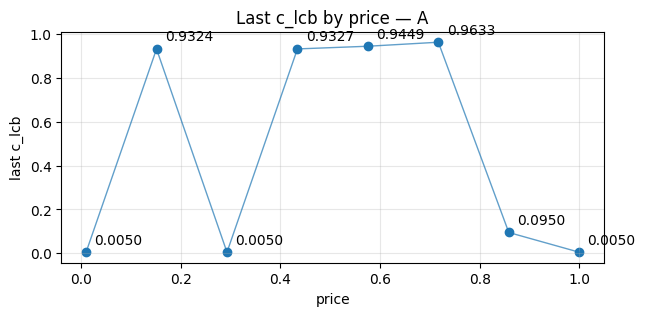

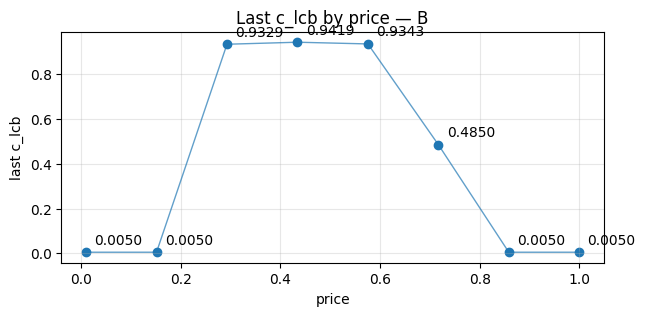

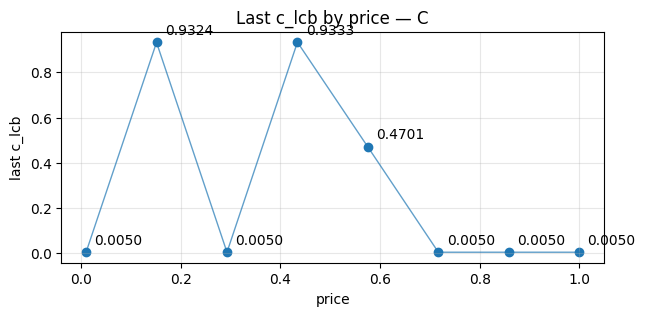

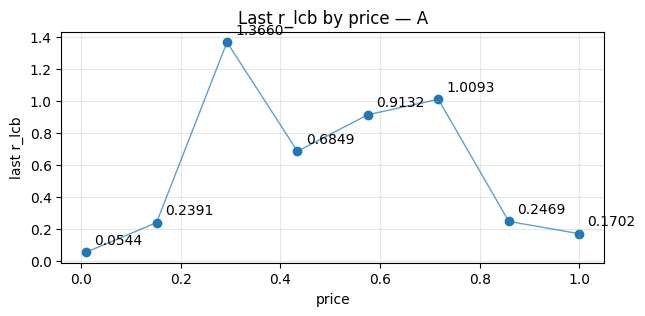

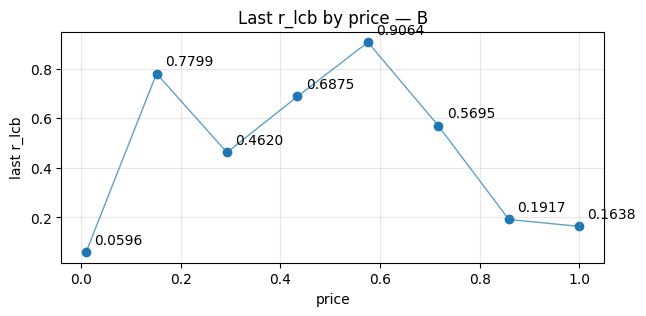

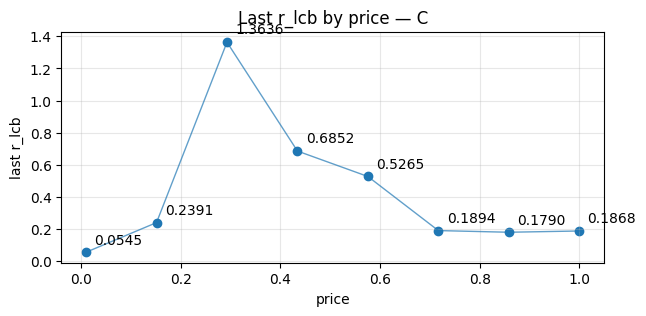

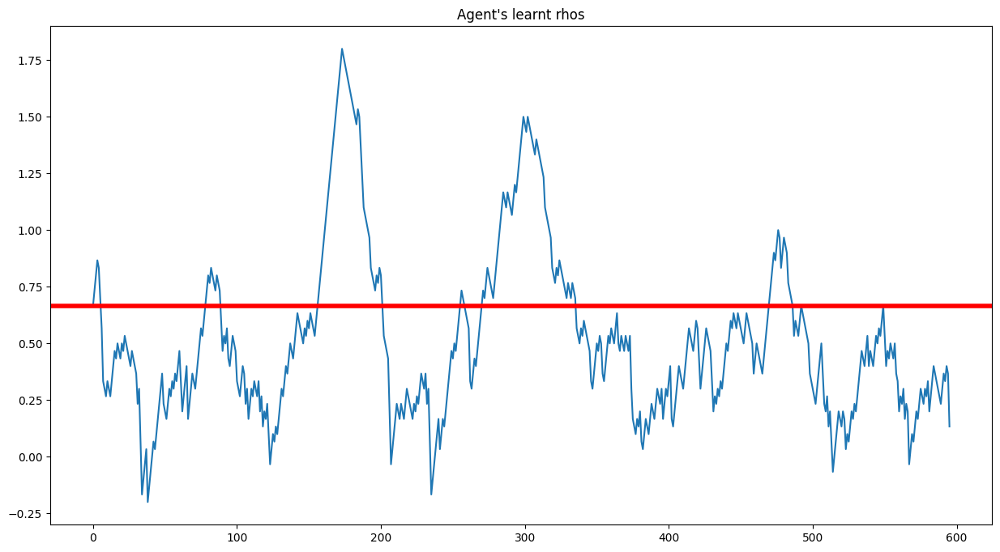

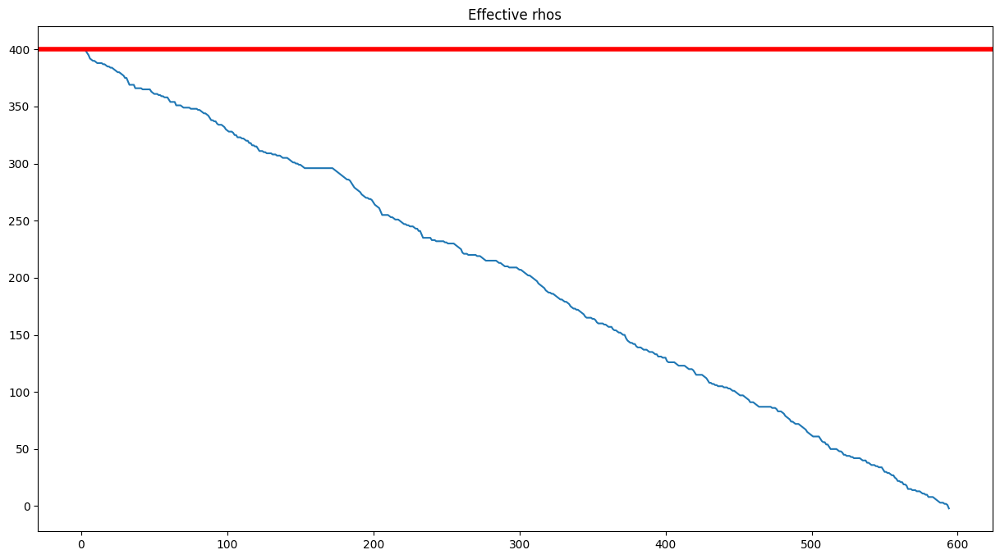

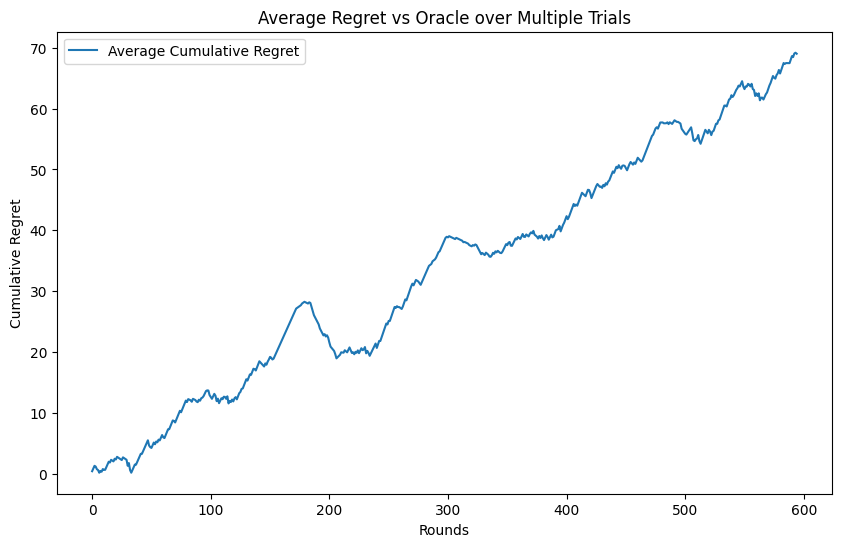

In [ ]:
run_one = 1
products = ['A','B','C']
budget = 400
T = 600
change_rounds = 30
U_T = int(T/change_rounds)
window = int(2*np.sqrt(T*np.log(T)/U_T))
#window = int(2*np.sqrt(np.log(T)))  this is a more conservative window
seeds = [10123, 47281, 39502, 86734, 19285, 55012, 73190, 28461, 61027, 90834,
         45712, 67209, 31845, 82650, 14029, 59384, 71203, 40917, 28495, 63721]

fixed_prices = 0
if fixed_prices:
  K=10
  prices_per_product = np.linspace(0.01, 1, K)    
else:
  epsilon = T ** (-0.33)
  K = int(1 / epsilon)
  prices_per_product = np.linspace(0.01, 1, K)    

print(f'Discretizing prices with {K} values')
print(prices_per_product)
prices = {p: prices_per_product for p in products}
print(prices)

means = np.array([0.2, 0.5, 0.7])
covs = 0.01*np.array([[1., 0.3, 0.1],
                       [0.3, 1., 0.5],
                       [0.1, 0.5, 1]])

if run_one:
    utilities, _, _, clairv_util, fixed_hind_clair, _ = run_single_trial_combgp(0, products, prices, prices_per_product, budget, T, change_rounds, window, means, covs, seed=89)

    cum_utilities = np.cumsum(utilities)
    cum_clairv = np.cumsum(clairv_util)
    cum_clairv_fixed_hind = np.cumsum(fixed_hind_clair)

    avg_regret = cum_clairv - cum_utilities
    # avg_regret_fixed_hind = cum_clairv_fixed_hind - cum_utilities

    plt.figure(figsize=(10,6))
    plt.plot(avg_regret, label='Average Cumulative Regret')
    #plt.plot(avg_regret_fixed_hind, label='Average Cumulative Regret (Fixed, Hindsight)')
    plt.xlabel('Rounds')
    plt.ylabel('Cumulative Regret')
    plt.title('Average Regret vs Oracle over Multiple Trials')
    plt.legend()
    plt.show()

else:
    all_regrets, all_payments = run_all_trials_parallel_combgp(
    seeds, products, prices, prices_per_product, budget, T, change_rounds, window, means, covs, n_jobs=-1
    )
    all_regrets = np.array([np.pad(r, (0, T-len(r)), 'edge') for r in all_regrets])
    # Computes quantiles across trials for regret analysis
    lq_regret, median_regret, hq_regret = np.quantile(all_regrets, q=[0.25, 0.5, 0.75], axis=0)

We notice thta in a single trial, the regret appears to be **sublinear**, in particular, at times, given that the curve is increasing, flattening and decreasing multiple times, probably due to the division of the rounds into intervals where the distribution of valuaitons is stationary. 

##### Single Trial with B = T

Discretizing prices with 8 values
[0.01       0.15142857 0.29285714 0.43428571 0.57571429 0.71714286
 0.85857143 1.        ]
{'A': array([0.01      , 0.15142857, 0.29285714, 0.43428571, 0.57571429,
       0.71714286, 0.85857143, 1.        ]), 'B': array([0.01      , 0.15142857, 0.29285714, 0.43428571, 0.57571429,
       0.71714286, 0.85857143, 1.        ]), 'C': array([0.01      , 0.15142857, 0.29285714, 0.43428571, 0.57571429,
       0.71714286, 0.85857143, 1.        ])}
Total # of Wins: 600
Gamma: {'A': array([ 0.,  0.,  0.,  0.,  0.,  0., -0.,  1.]), 'B': array([0., 0., 0., 0., 0., 0., 0., 1.]), 'C': array([0., 0., 0., 0., 0., 0., 0., 1.])}


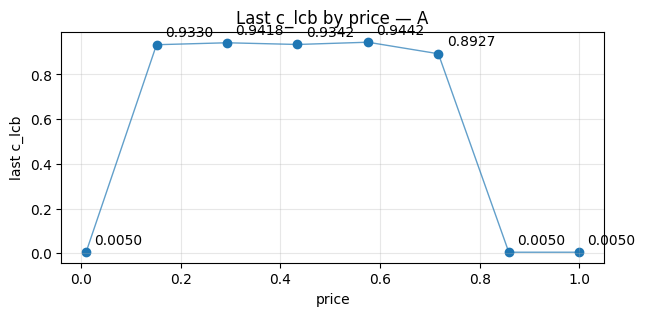

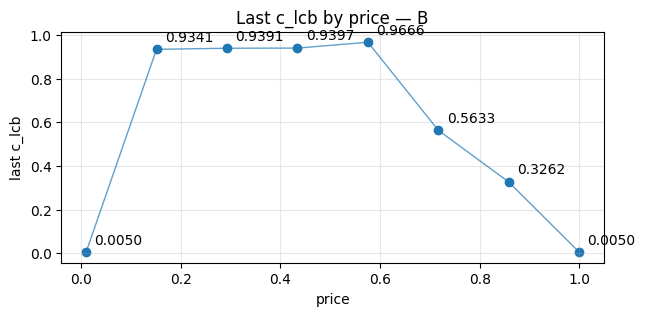

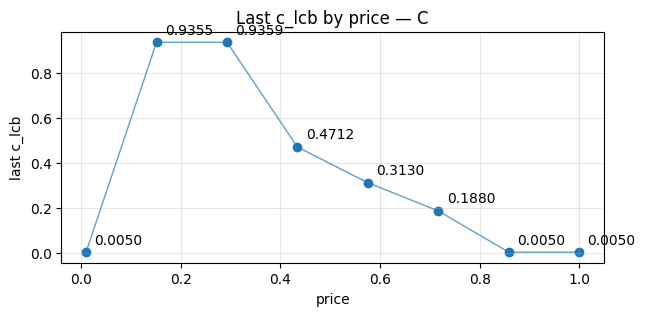

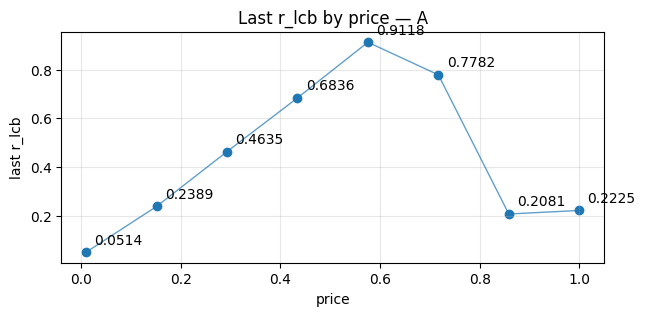

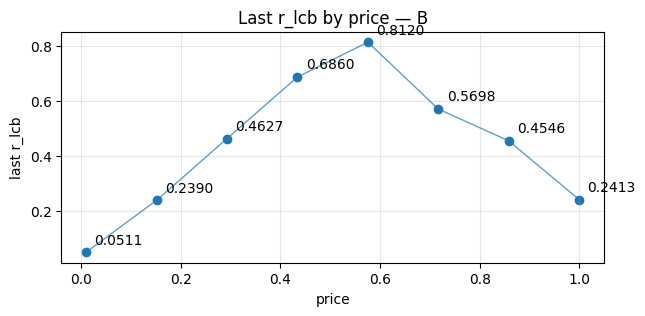

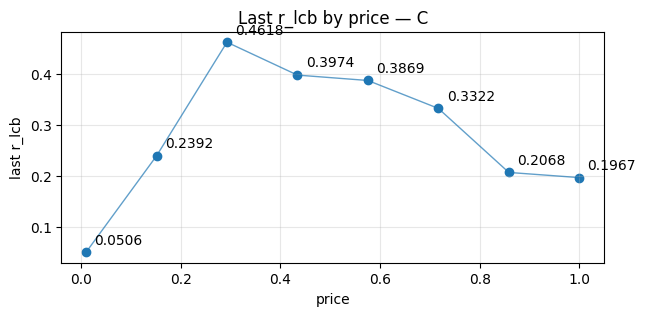

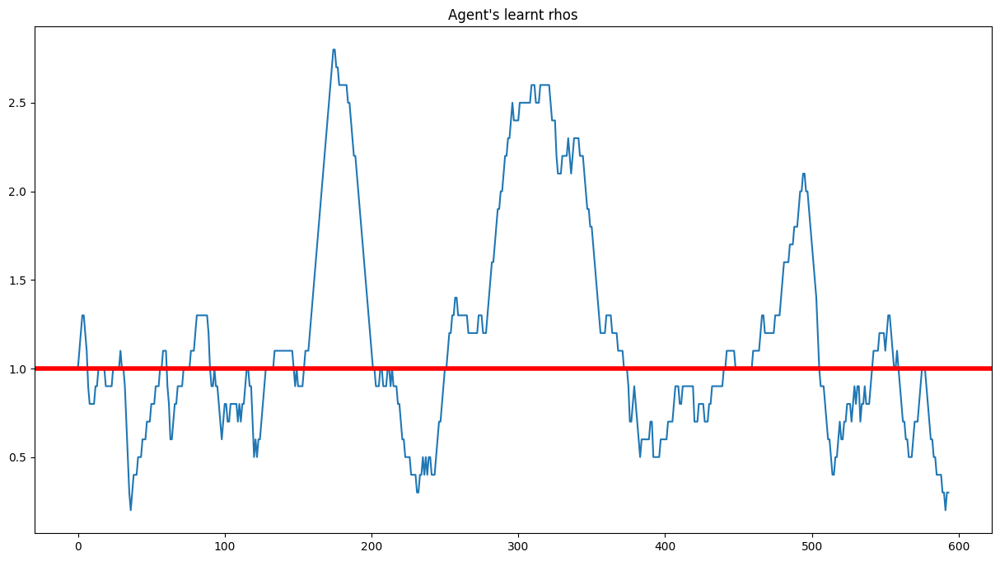

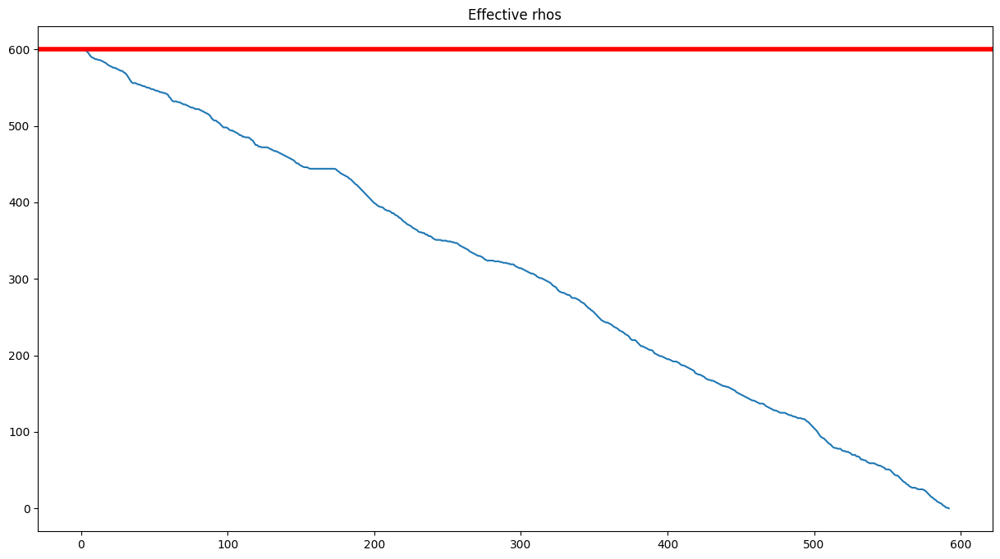

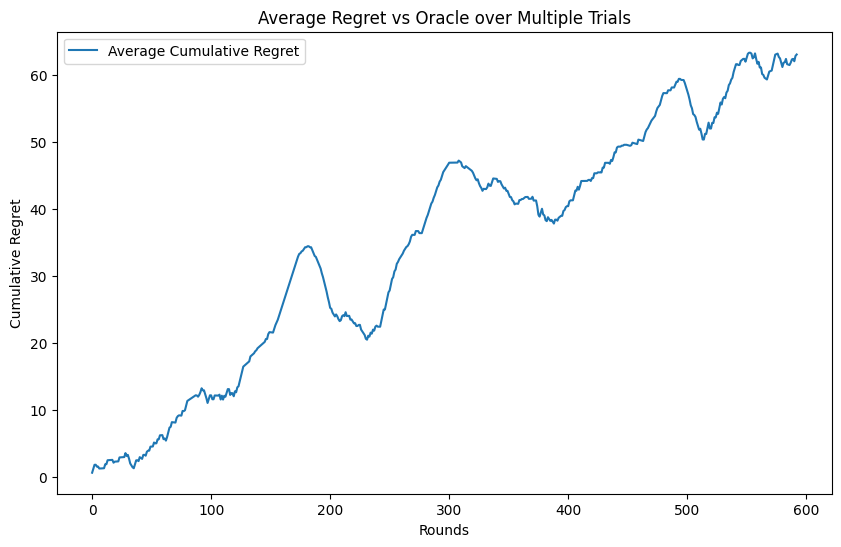

In [ ]:
run_one = 1
products = ['A','B','C']
budget = 600
T = 600
change_rounds = 30
U_T = int(T/change_rounds)
window = int(2*np.sqrt(T*np.log(T)/U_T))
#window = int(2*np.sqrt(np.log(T)))
seeds = [10123, 47281, 39502, 86734, 19285, 55012, 73190, 28461, 61027, 90834,
         45712, 67209, 31845, 82650, 14029, 59384, 71203, 40917, 28495, 63721]

fixed_prices = 0
if fixed_prices:
  K=10
  prices_per_product = np.linspace(0.01, 1, K)    
else:
  epsilon = T ** (-0.33)
  K = int(1 / epsilon)
  prices_per_product = np.linspace(0.01, 1, K)    

print(f'Discretizing prices with {K} values')
print(prices_per_product)
prices = {p: prices_per_product for p in products}
print(prices)

means = np.array([0.2, 0.5, 0.7])
covs = 0.01*np.array([[1., 0.3, 0.1],
                       [0.3, 1., 0.5],
                       [0.1, 0.5, 1]])

if run_one:
    utilities, _, _, clairv_util, fixed_hind_clair, _ = run_single_trial_combgp(0, products, prices, prices_per_product, budget, T, change_rounds, window, means, covs, seed=89)

    cum_utilities = np.cumsum(utilities)
    cum_clairv = np.cumsum(clairv_util)
    cum_clairv_fixed_hind = np.cumsum(fixed_hind_clair)

    avg_regret = cum_clairv - cum_utilities
    # avg_regret_fixed_hind = cum_clairv_fixed_hind - cum_utilities

    plt.figure(figsize=(10,6))
    plt.plot(avg_regret, label='Average Cumulative Regret')
    #plt.plot(avg_regret_fixed_hind, label='Average Cumulative Regret (Fixed, Hindsight)')
    plt.xlabel('Rounds')
    plt.ylabel('Cumulative Regret')
    plt.title('Average Regret vs Oracle over Multiple Trials')
    plt.legend()
    plt.show()

else:
    all_regrets, all_payments = run_all_trials_parallel_combgp(
    seeds, products, prices, prices_per_product, budget, T, change_rounds, window, means, covs, n_jobs=-1
    )
    all_regrets = np.array([np.pad(r, (0, T-len(r)), 'edge') for r in all_regrets])
    # Computes quantiles across trials for regret analysis
    lq_regret, median_regret, hq_regret = np.quantile(all_regrets, q=[0.25, 0.5, 0.75], axis=0)

With B = T and an intermediate number of intervals, the regret is pretty much the same as before, so **sublinear** with the same trend as before.

##### Single Trial with B > T

Discretizing prices with 8 values
[0.01       0.15142857 0.29285714 0.43428571 0.57571429 0.71714286
 0.85857143 1.        ]
{'A': array([0.01      , 0.15142857, 0.29285714, 0.43428571, 0.57571429,
       0.71714286, 0.85857143, 1.        ]), 'B': array([0.01      , 0.15142857, 0.29285714, 0.43428571, 0.57571429,
       0.71714286, 0.85857143, 1.        ]), 'C': array([0.01      , 0.15142857, 0.29285714, 0.43428571, 0.57571429,
       0.71714286, 0.85857143, 1.        ])}
Total # of Wins: 801
Best fixed LP failed: 2 The problem is infeasible. (HiGHS Status 8: model_status is Infeasible; primal_status is None)
Gamma: {'A': array([0.125, 0.125, 0.125, 0.125, 0.125, 0.125, 0.125, 0.125]), 'B': array([0.125, 0.125, 0.125, 0.125, 0.125, 0.125, 0.125, 0.125]), 'C': array([0.125, 0.125, 0.125, 0.125, 0.125, 0.125, 0.125, 0.125])}


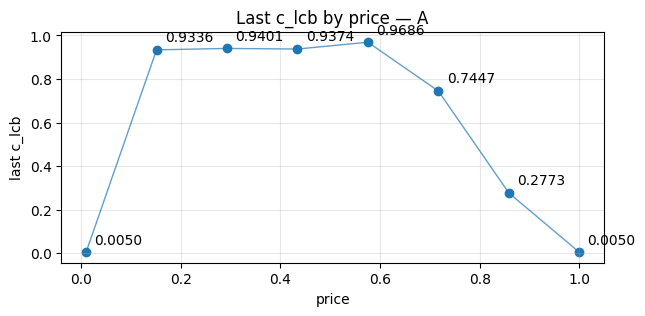

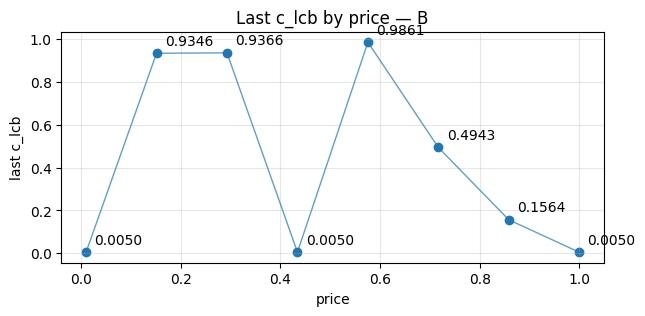

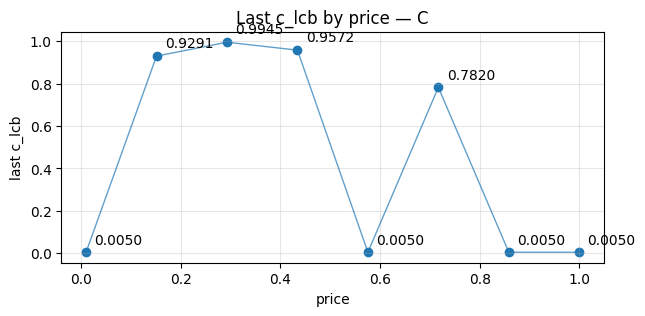

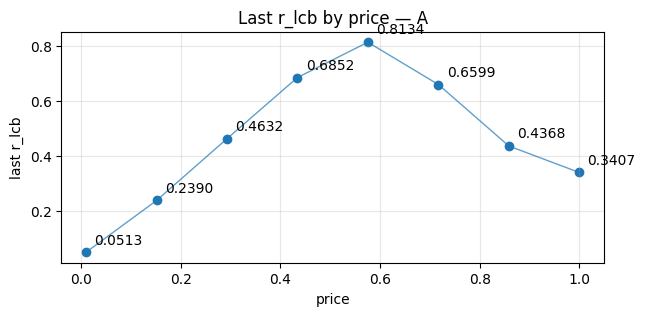

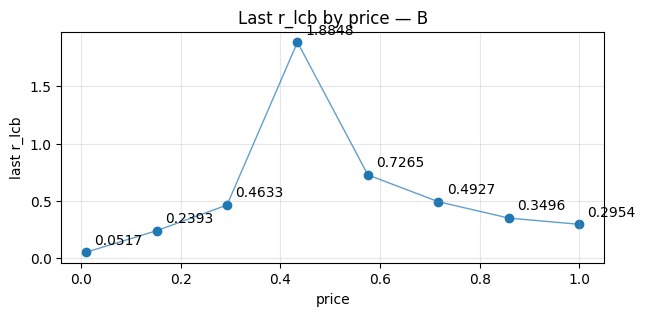

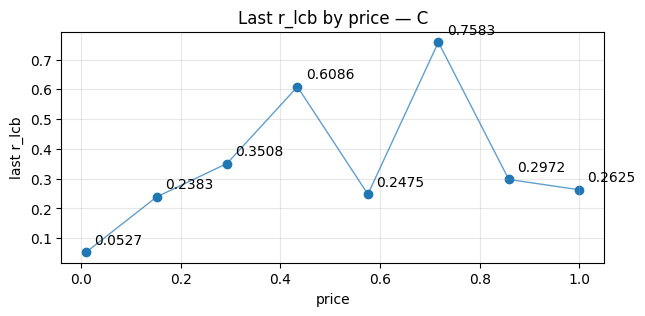

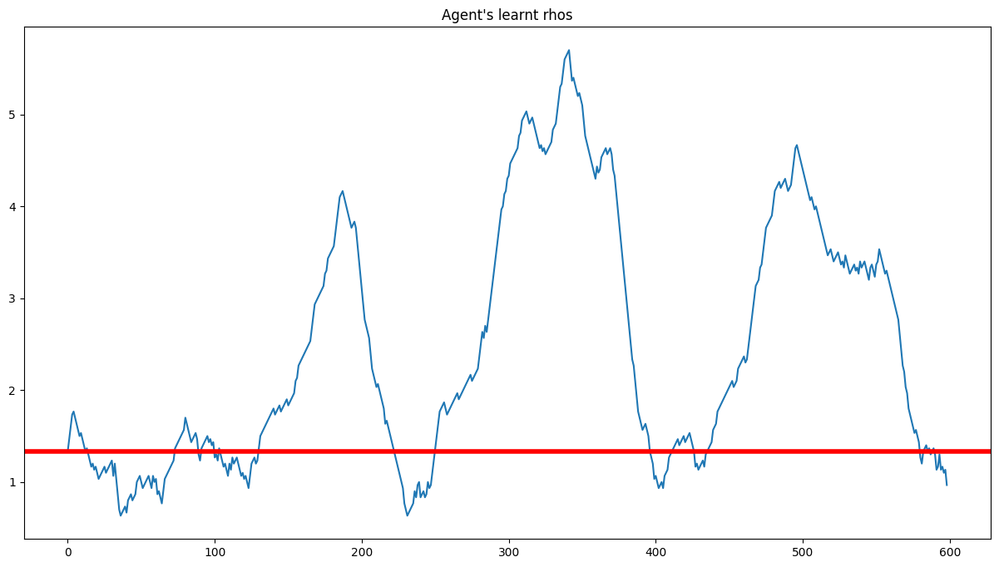

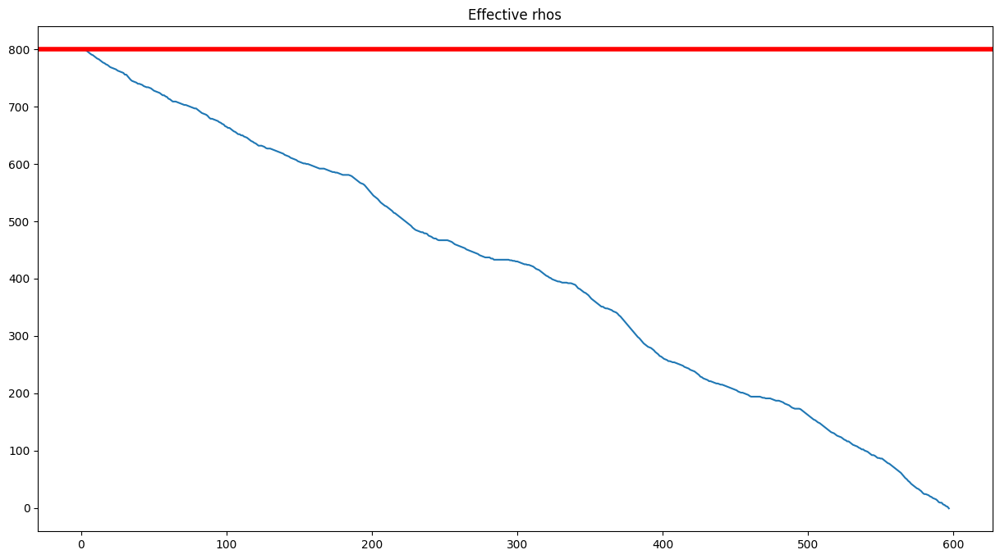

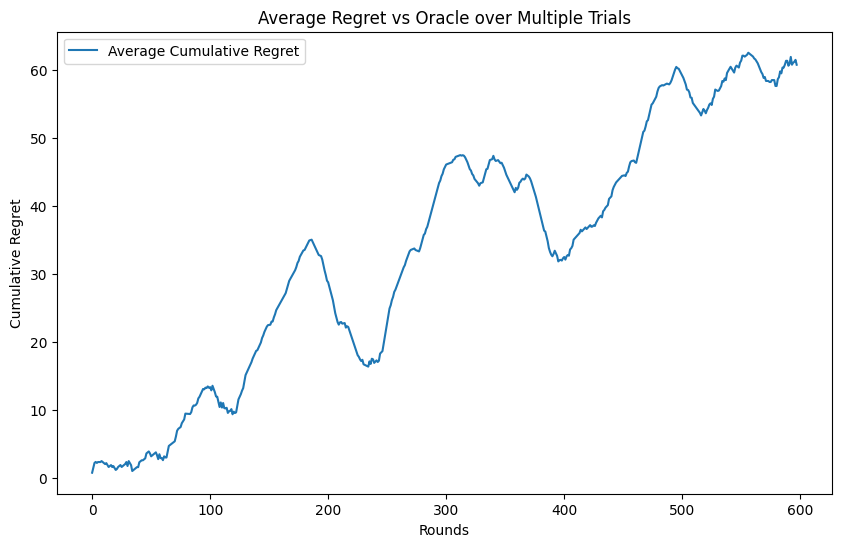

In [ ]:
run_one = 1
products = ['A','B','C']
budget = 800
T = 600
change_rounds = 30
U_T = int(T/change_rounds)
window = int(2*np.sqrt(T*np.log(T)/U_T))
#window = int(2*np.sqrt(np.log(T)))
seeds = [10123, 47281, 39502, 86734, 19285, 55012, 73190, 28461, 61027, 90834,
         45712, 67209, 31845, 82650, 14029, 59384, 71203, 40917, 28495, 63721]

fixed_prices = 0
if fixed_prices:
  K=10
  prices_per_product = np.linspace(0.01, 1, K)    
else:
  epsilon = T ** (-0.33)
  K = int(1 / epsilon)
  prices_per_product = np.linspace(0.01, 1, K)    

print(f'Discretizing prices with {K} values')
print(prices_per_product)
prices = {p: prices_per_product for p in products}
print(prices)

means = np.array([0.2, 0.5, 0.7])
covs = 0.01*np.array([[1., 0.3, 0.1],
                       [0.3, 1., 0.5],
                       [0.1, 0.5, 1]])

if run_one:
    utilities, _, _, clairv_util, fixed_hind_clair, _ = run_single_trial_combgp(0, products, prices, prices_per_product, budget, T, change_rounds, window, means, covs, seed=89)

    cum_utilities = np.cumsum(utilities)
    cum_clairv = np.cumsum(clairv_util)
    cum_clairv_fixed_hind = np.cumsum(fixed_hind_clair)

    avg_regret = cum_clairv - cum_utilities
    # avg_regret_fixed_hind = cum_clairv_fixed_hind - cum_utilities

    plt.figure(figsize=(10,6))
    plt.plot(avg_regret, label='Average Cumulative Regret')
    #plt.plot(avg_regret_fixed_hind, label='Average Cumulative Regret (Fixed, Hindsight)')
    plt.xlabel('Rounds')
    plt.ylabel('Cumulative Regret')
    plt.title('Average Regret vs Oracle over Multiple Trials')
    plt.legend()
    plt.show()

else:
    all_regrets, all_payments = run_all_trials_parallel_combgp(
    seeds, products, prices, prices_per_product, budget, T, change_rounds, window, means, covs, n_jobs=-1
    )
    all_regrets = np.array([np.pad(r, (0, T-len(r)), 'edge') for r in all_regrets])
    # Computes quantiles across trials for regret analysis
    lq_regret, median_regret, hq_regret = np.quantile(all_regrets, q=[0.25, 0.5, 0.75], axis=0)

With B > T, the peaks and the dumps become more prominent, so the regret can be considered **sublinear**.

##### Multiple Trials with B < T

Discretizing prices with 8 values
[0.01       0.15142857 0.29285714 0.43428571 0.57571429 0.71714286
 0.85857143 1.        ]
{'A': array([0.01      , 0.15142857, 0.29285714, 0.43428571, 0.57571429,
       0.71714286, 0.85857143, 1.        ]), 'B': array([0.01      , 0.15142857, 0.29285714, 0.43428571, 0.57571429,
       0.71714286, 0.85857143, 1.        ]), 'C': array([0.01      , 0.15142857, 0.29285714, 0.43428571, 0.57571429,
       0.71714286, 0.85857143, 1.        ])}





Trial 1:   0%|          | 0/600 [00:00<?, ?it/s]












Trial 1:   1%|          | 7/600 [00:00<00:10, 59.29it/s]

















Trial 1:   2%|▏         | 13/600 [00:00<00:10, 54.67it/s]












Trial 1:   3%|▎         | 20/600 [00:00<00:09, 58.65it/s]












Trial 1:   4%|▍         | 27/600 [00:00<00:09, 61.56it/s]












Trial 1:   6%|▌         | 34/600 [00:00<00:09, 58.03it/s]












Trial 1:   7%|▋         | 41/600 [00:00<00:09, 59.43it/s]


















Trial 1:   8%|▊         | 48/600 [00:00<00:08, 62.17it/s]


















Trial 1:   9%|▉         | 55/600 [00:00<00:08, 63.14it/s]
























Trial 1:  10%|█         | 62/600 [00:01<00:10, 52.70it/s]












Trial 1:  11%|█▏        | 68/600 [00:01<00:13, 40.54it/s]


















Trial 1:  13%|█▎        | 80/600 [00:01<00:09, 55.95it/s]













Trial 1:  14%|█▍        | 87/600 [00:01<00:09, 53.66it/s]

















Trial 1:  16%|█▌        | 93/600 [00:01<00:09, 50.97it/s

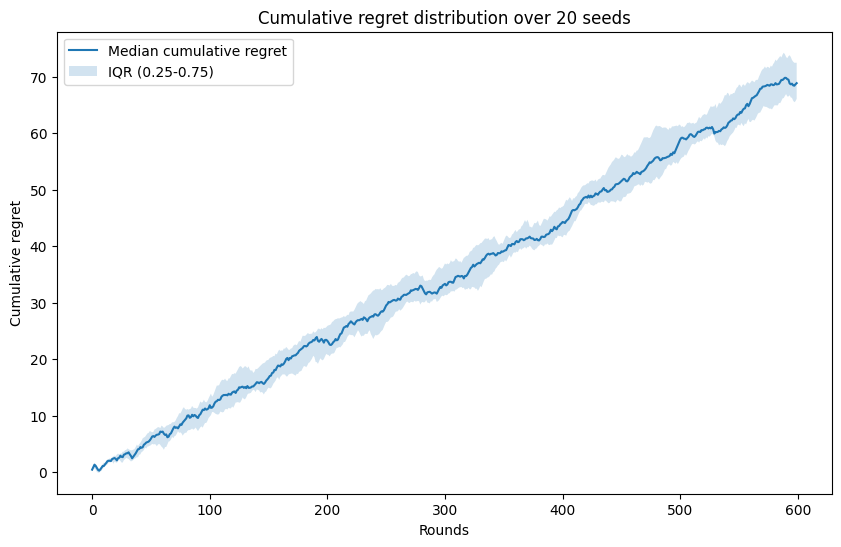

In [ ]:
run_one = 0
products = ['A','B','C']
budget = 400
T = 600
change_rounds = 30
U_T = int(T/change_rounds)
window = int(2*np.sqrt(T*np.log(T)/U_T))
#window = int(2*np.sqrt(np.log(T)))
seeds = [10123, 47281, 39502, 86734, 19285, 55012, 73190, 28461, 61027, 90834,
         45712, 67209, 31845, 82650, 14029, 59384, 71203, 40917, 28495, 63721]

fixed_prices = 0
if fixed_prices:
  K=10
  prices_per_product = np.linspace(0.01, 1, K)    
else:
  epsilon = T ** (-0.33)
  K = int(1 / epsilon)
  prices_per_product = np.linspace(0.01, 1, K)    

print(f'Discretizing prices with {K} values')
print(prices_per_product)
prices = {p: prices_per_product for p in products}
print(prices)

means = np.array([0.2, 0.5, 0.7])
covs = 0.01*np.array([[1., 0.3, 0.1],
                       [0.3, 1., 0.5],
                       [0.1, 0.5, 1]])

if run_one:
    utilities, _, _, clairv_util, fixed_hind_clair, _ = run_single_trial_combgp(0, products, prices, prices_per_product, budget, T, change_rounds, window, means, covs, seed=89)

    cum_utilities = np.cumsum(utilities)
    cum_clairv = np.cumsum(clairv_util)
    cum_clairv_fixed_hind = np.cumsum(fixed_hind_clair)

    avg_regret = cum_clairv - cum_utilities
    # avg_regret_fixed_hind = cum_clairv_fixed_hind - cum_utilities

    plt.figure(figsize=(10,6))
    plt.plot(avg_regret, label='Average Cumulative Regret')
    #plt.plot(avg_regret_fixed_hind, label='Average Cumulative Regret (Fixed, Hindsight)')
    plt.xlabel('Rounds')
    plt.ylabel('Cumulative Regret')
    plt.title('Average Regret vs Oracle over Multiple Trials')
    plt.legend()
    plt.show()

else:
    all_regrets, all_payments = run_all_trials_parallel_combgp(
    seeds, products, prices, prices_per_product, budget, T, change_rounds, window, means, covs, n_jobs=-1
    )
    all_regrets = np.array([np.pad(r, (0, T-len(r)), 'edge') for r in all_regrets])
    # Computes quantiles across trials for regret analysis
    lq_regret, median_regret, hq_regret = np.quantile(all_regrets, q=[0.25, 0.5, 0.75], axis=0)

    # Plot cumulative regret
    plt.figure(figsize=(10,6))
    plt.plot(median_regret, label='Median cumulative regret')
    plt.fill_between(range(T), lq_regret, hq_regret, alpha=0.2, label='IQR (0.25-0.75)')
    plt.xlabel('Rounds')
    plt.ylabel('Cumulative regret')
    plt.title(f'Cumulative regret distribution over {len(seeds)} seeds')
    plt.legend()
    plt.show()

We can see that the curve seems linear but its trend is characterised by some points where the curve starts to decrease, so it's not properly linear, it could be still **sublinear**.

Now, we increase the number of rounds after which the distribution changes

Discretizing prices with 8 values
[0.01       0.15142857 0.29285714 0.43428571 0.57571429 0.71714286
 0.85857143 1.        ]
{'A': array([0.01      , 0.15142857, 0.29285714, 0.43428571, 0.57571429,
       0.71714286, 0.85857143, 1.        ]), 'B': array([0.01      , 0.15142857, 0.29285714, 0.43428571, 0.57571429,
       0.71714286, 0.85857143, 1.        ]), 'C': array([0.01      , 0.15142857, 0.29285714, 0.43428571, 0.57571429,
       0.71714286, 0.85857143, 1.        ])}


Trial 1:   0%|          | 0/600 [00:00<?, ?it/s]


Trial 1:   1%|          | 4/600 [00:00<00:15, 37.38it/s]



















Trial 1:   3%|▎         | 20/600 [00:00<00:05, 103.47it/s]
























Trial 1:   5%|▌         | 31/600 [00:00<00:06, 81.60it/s] 




















Trial 1:   7%|▋         | 40/600 [00:00<00:08, 62.54it/s]


















Trial 1:   8%|▊         | 50/600 [00:00<00:07, 71.37it/s]
















Trial 1:  10%|▉         | 58/600 [00:00<00:07, 69.12it/s]





























Trial 1:  11%|█         | 66/600 [00:00<00:08, 62.74it/s]








Trial 1:  12%|█▏        | 73/600 [00:01<00:08, 64.27it/s]











Trial 1:  13%|█▎        | 80/600 [00:01<00:08, 61.71it/s]




















Trial 1:  14%|█▍        | 87/600 [00:01<00:08, 63.27it/s]




















Trial 1:  16%|█▌        | 94/600 [00:01<00:08, 62.70it/s]

























Trial 1:  17%|█▋        | 101/600 [00:01<00:07, 62.50it/s]




















Trial 1:  18%|█▊     

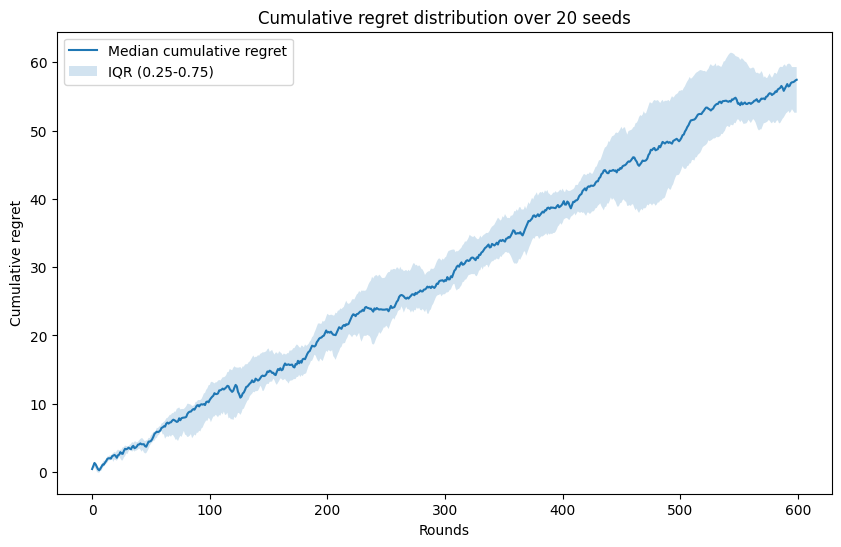

In [15]:
run_one = 0
products = ['A','B','C']
budget = 400
T = 600
change_rounds = 60
U_T = int(T/change_rounds)
window = int(2*np.sqrt(T*np.log(T)/U_T))
#window = int(2*np.sqrt(np.log(T)))
seeds = [10123, 47281, 39502, 86734, 19285, 55012, 73190, 28461, 61027, 90834,
         45712, 67209, 31845, 82650, 14029, 59384, 71203, 40917, 28495, 63721]

fixed_prices = 0
if fixed_prices:
  K=10
  prices_per_product = np.linspace(0.01, 1, K)    
else:
  epsilon = T ** (-0.33)
  K = int(1 / epsilon)
  prices_per_product = np.linspace(0.01, 1, K)    

print(f'Discretizing prices with {K} values')
print(prices_per_product)
prices = {p: prices_per_product for p in products}
print(prices)

means = np.array([0.2, 0.5, 0.7])
covs = 0.01*np.array([[1., 0.3, 0.1],
                       [0.3, 1., 0.5],
                       [0.1, 0.5, 1]])

if run_one:
    utilities, _, _, clairv_util, fixed_hind_clair, _ = run_single_trial_combgp(0, products, prices, prices_per_product, budget, T, change_rounds, window, means, covs, seed=89)

    cum_utilities = np.cumsum(utilities)
    cum_clairv = np.cumsum(clairv_util)
    cum_clairv_fixed_hind = np.cumsum(fixed_hind_clair)

    avg_regret = cum_clairv - cum_utilities
    # avg_regret_fixed_hind = cum_clairv_fixed_hind - cum_utilities

    plt.figure(figsize=(10,6))
    plt.plot(avg_regret, label='Average Cumulative Regret')
    #plt.plot(avg_regret_fixed_hind, label='Average Cumulative Regret (Fixed, Hindsight)')
    plt.xlabel('Rounds')
    plt.ylabel('Cumulative Regret')
    plt.title('Average Regret vs Oracle over Multiple Trials')
    plt.legend()
    plt.show()

else:
    all_regrets, all_payments = run_all_trials_parallel_combgp(
    seeds, products, prices, prices_per_product, budget, T, change_rounds, window, means, covs, n_jobs=-1
    )
    all_regrets = np.array([np.pad(r, (0, T-len(r)), 'edge') for r in all_regrets])
    # Computes quantiles across trials for regret analysis
    lq_regret, median_regret, hq_regret = np.quantile(all_regrets, q=[0.25, 0.5, 0.75], axis=0)

    # Plot cumulative regret
    plt.figure(figsize=(10,6))
    plt.plot(median_regret, label='Median cumulative regret')
    plt.fill_between(range(T), lq_regret, hq_regret, alpha=0.2, label='IQR (0.25-0.75)')
    plt.xlabel('Rounds')
    plt.ylabel('Cumulative regret')
    plt.title(f'Cumulative regret distribution over {len(seeds)} seeds')
    plt.legend()
    plt.show()

Then, if we consider an almost stationary environment (change_rounds almost equal to T), we should expect better performances

Discretizing prices with 8 values
[0.01       0.15142857 0.29285714 0.43428571 0.57571429 0.71714286
 0.85857143 1.        ]
{'A': array([0.01      , 0.15142857, 0.29285714, 0.43428571, 0.57571429,
       0.71714286, 0.85857143, 1.        ]), 'B': array([0.01      , 0.15142857, 0.29285714, 0.43428571, 0.57571429,
       0.71714286, 0.85857143, 1.        ]), 'C': array([0.01      , 0.15142857, 0.29285714, 0.43428571, 0.57571429,
       0.71714286, 0.85857143, 1.        ])}


Trial 1:   0%|          | 0/600 [00:00<?, ?it/s]














Trial 1:   2%|▎         | 15/600 [00:00<00:04, 134.66it/s]



















































Trial 1:   5%|▍         | 29/600 [00:00<00:08, 65.65it/s] 




























Trial 1:   6%|▋         | 38/600 [00:00<00:09, 60.20it/s]




















Trial 1:   8%|▊         | 45/600 [00:00<00:09, 59.01it/s]




















Trial 1:   9%|▊         | 52/600 [00:00<00:09, 60.68it/s]























Trial 1:  10%|▉         | 59/600 [00:00<00:09, 59.80it/s]
















Trial 1:  11%|█         | 66/600 [00:01<00:09, 59.21it/s]
















Trial 1:  12%|█▏        | 73/600 [00:01<00:08, 59.64it/s]




























Trial 1:  13%|█▎        | 80/600 [00:01<00:09, 54.07it/s]
















Trial 1:  14%|█▍        | 86/600 [00:01<00:09, 54.89it/s]



















































Trial 1:  15%|█▌        | 92/600 [00:01<00:13, 39.05it/s]




















Trial 1:

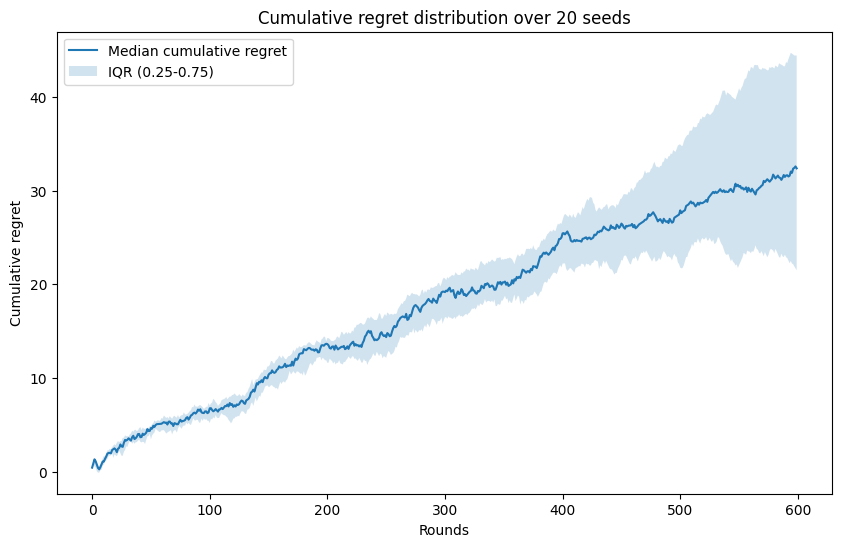

In [16]:
run_one = 0
products = ['A','B','C']
budget = 400
T = 600
change_rounds = 400
U_T = int(T/change_rounds)
window = int(2*np.sqrt(T*np.log(T)/U_T))
#window = int(2*np.sqrt(np.log(T)))
seeds = [10123, 47281, 39502, 86734, 19285, 55012, 73190, 28461, 61027, 90834,
         45712, 67209, 31845, 82650, 14029, 59384, 71203, 40917, 28495, 63721]

fixed_prices = 0
if fixed_prices:
  K=10
  prices_per_product = np.linspace(0.01, 1, K)    
else:
  epsilon = T ** (-0.33)
  K = int(1 / epsilon)
  prices_per_product = np.linspace(0.01, 1, K)    

print(f'Discretizing prices with {K} values')
print(prices_per_product)
prices = {p: prices_per_product for p in products}
print(prices)

means = np.array([0.2, 0.5, 0.7])
covs = 0.01*np.array([[1., 0.3, 0.1],
                       [0.3, 1., 0.5],
                       [0.1, 0.5, 1]])

if run_one:
    utilities, _, _, clairv_util, fixed_hind_clair, _ = run_single_trial_combgp(0, products, prices, prices_per_product, budget, T, change_rounds, window, means, covs, seed=89)

    cum_utilities = np.cumsum(utilities)
    cum_clairv = np.cumsum(clairv_util)
    cum_clairv_fixed_hind = np.cumsum(fixed_hind_clair)

    avg_regret = cum_clairv - cum_utilities
    # avg_regret_fixed_hind = cum_clairv_fixed_hind - cum_utilities

    plt.figure(figsize=(10,6))
    plt.plot(avg_regret, label='Average Cumulative Regret')
    #plt.plot(avg_regret_fixed_hind, label='Average Cumulative Regret (Fixed, Hindsight)')
    plt.xlabel('Rounds')
    plt.ylabel('Cumulative Regret')
    plt.title('Average Regret vs Oracle over Multiple Trials')
    plt.legend()
    plt.show()

else:
    all_regrets, all_payments = run_all_trials_parallel_combgp(
    seeds, products, prices, prices_per_product, budget, T, change_rounds, window, means, covs, n_jobs=-1
    )
    all_regrets = np.array([np.pad(r, (0, T-len(r)), 'edge') for r in all_regrets])
    # Computes quantiles across trials for regret analysis
    lq_regret, median_regret, hq_regret = np.quantile(all_regrets, q=[0.25, 0.5, 0.75], axis=0)

    # Plot cumulative regret
    plt.figure(figsize=(10,6))
    plt.plot(median_regret, label='Median cumulative regret')
    plt.fill_between(range(T), lq_regret, hq_regret, alpha=0.2, label='IQR (0.25-0.75)')
    plt.xlabel('Rounds')
    plt.ylabel('Cumulative regret')
    plt.title(f'Cumulative regret distribution over {len(seeds)} seeds')
    plt.legend()
    plt.show()

Now, the regret appears to be **sublinear**, because the algorithm works well when the number of intervals is low.

While with a highly non stationary environment, the performances drop down.

Discretizing prices with 8 values
[0.01       0.15142857 0.29285714 0.43428571 0.57571429 0.71714286
 0.85857143 1.        ]
{'A': array([0.01      , 0.15142857, 0.29285714, 0.43428571, 0.57571429,
       0.71714286, 0.85857143, 1.        ]), 'B': array([0.01      , 0.15142857, 0.29285714, 0.43428571, 0.57571429,
       0.71714286, 0.85857143, 1.        ]), 'C': array([0.01      , 0.15142857, 0.29285714, 0.43428571, 0.57571429,
       0.71714286, 0.85857143, 1.        ])}


Trial 1:   0%|          | 0/600 [00:00<?, ?it/s]














Trial 1:   1%|          | 4/600 [00:00<00:16, 35.94it/s]














Trial 1:   1%|▏         | 8/600 [00:00<00:16, 36.25it/s]
















Trial 1:   2%|▏         | 12/600 [00:00<00:19, 30.71it/s]



























Trial 1:   3%|▎         | 16/600 [00:00<00:21, 27.73it/s]



















Trial 1:   4%|▎         | 21/600 [00:00<00:17, 33.14it/s]



















Trial 1:   4%|▍         | 25/600 [00:00<00:18, 31.70it/s]
















Trial 1:   5%|▍         | 29/600 [00:00<00:17, 31.94it/s]













































Trial 1:   6%|▌         | 33/600 [00:01<00:25, 21.82it/s]






















Trial 1:   6%|▌         | 36/600 [00:01<00:27, 20.49it/s]

























Trial 1:   7%|▋         | 40/600 [00:01<00:23, 23.65it/s]


























Trial 1:   7%|▋         | 44/600 [00:01<00:20, 26.98it/s]




















Trial 1:   8%|▊         | 48/600 [00:01<00:19, 28.98

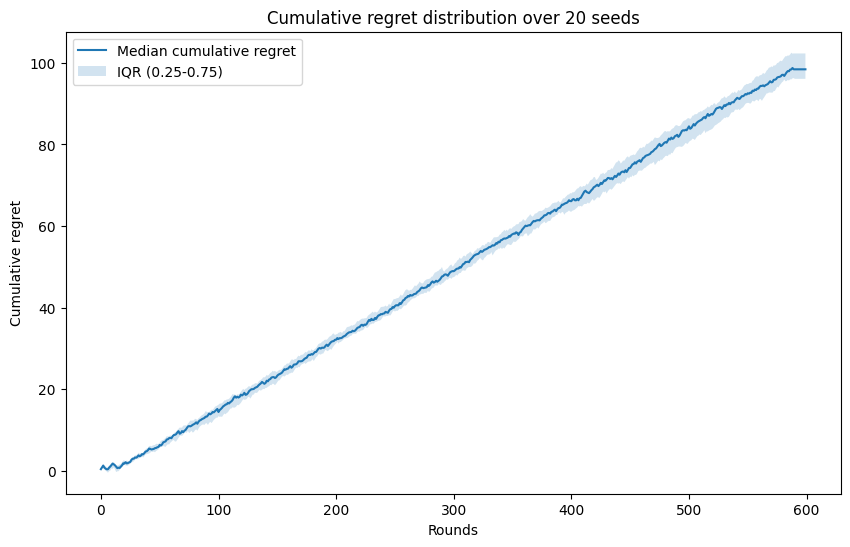

In [17]:
run_one = 0
products = ['A','B','C']
budget = 400
T = 600
change_rounds = 3
U_T = int(T/change_rounds)
window = int(2*np.sqrt(T*np.log(T)/U_T))
#window = int(2*np.sqrt(np.log(T)))
seeds = [10123, 47281, 39502, 86734, 19285, 55012, 73190, 28461, 61027, 90834,
         45712, 67209, 31845, 82650, 14029, 59384, 71203, 40917, 28495, 63721]

fixed_prices = 0
if fixed_prices:
  K=10
  prices_per_product = np.linspace(0.01, 1, K)    
else:
  epsilon = T ** (-0.33)
  K = int(1 / epsilon)
  prices_per_product = np.linspace(0.01, 1, K)    

print(f'Discretizing prices with {K} values')
print(prices_per_product)
prices = {p: prices_per_product for p in products}
print(prices)

means = np.array([0.2, 0.5, 0.7])
covs = 0.01*np.array([[1., 0.3, 0.1],
                       [0.3, 1., 0.5],
                       [0.1, 0.5, 1]])

if run_one:
    utilities, _, _, clairv_util, fixed_hind_clair, _ = run_single_trial_combgp(0, products, prices, prices_per_product, budget, T, change_rounds, window, means, covs, seed=89)

    cum_utilities = np.cumsum(utilities)
    cum_clairv = np.cumsum(clairv_util)
    cum_clairv_fixed_hind = np.cumsum(fixed_hind_clair)

    avg_regret = cum_clairv - cum_utilities
    # avg_regret_fixed_hind = cum_clairv_fixed_hind - cum_utilities

    plt.figure(figsize=(10,6))
    plt.plot(avg_regret, label='Average Cumulative Regret')
    #plt.plot(avg_regret_fixed_hind, label='Average Cumulative Regret (Fixed, Hindsight)')
    plt.xlabel('Rounds')
    plt.ylabel('Cumulative Regret')
    plt.title('Average Regret vs Oracle over Multiple Trials')
    plt.legend()
    plt.show()

else:
    all_regrets, all_payments = run_all_trials_parallel_combgp(
    seeds, products, prices, prices_per_product, budget, T, change_rounds, window, means, covs, n_jobs=-1
    )
    all_regrets = np.array([np.pad(r, (0, T-len(r)), 'edge') for r in all_regrets])
    # Computes quantiles across trials for regret analysis
    lq_regret, median_regret, hq_regret = np.quantile(all_regrets, q=[0.25, 0.5, 0.75], axis=0)

    # Plot cumulative regret
    plt.figure(figsize=(10,6))
    plt.plot(median_regret, label='Median cumulative regret')
    plt.fill_between(range(T), lq_regret, hq_regret, alpha=0.2, label='IQR (0.25-0.75)')
    plt.xlabel('Rounds')
    plt.ylabel('Cumulative regret')
    plt.title(f'Cumulative regret distribution over {len(seeds)} seeds')
    plt.legend()
    plt.show()

##### Multiple Trials with B > T

Discretizing prices with 8 values
[0.01       0.15142857 0.29285714 0.43428571 0.57571429 0.71714286
 0.85857143 1.        ]
{'A': array([0.01      , 0.15142857, 0.29285714, 0.43428571, 0.57571429,
       0.71714286, 0.85857143, 1.        ]), 'B': array([0.01      , 0.15142857, 0.29285714, 0.43428571, 0.57571429,
       0.71714286, 0.85857143, 1.        ]), 'C': array([0.01      , 0.15142857, 0.29285714, 0.43428571, 0.57571429,
       0.71714286, 0.85857143, 1.        ])}






Trial 1:   0%|          | 0/600 [00:00<?, ?it/s]

























Trial 1:   1%|          | 7/600 [00:00<00:10, 57.24it/s]























Trial 1:   2%|▎         | 15/600 [00:00<00:09, 63.75it/s]






Trial 1:   4%|▎         | 22/600 [00:00<00:08, 66.19it/s]




































Trial 1:   5%|▍         | 29/600 [00:00<00:09, 59.30it/s]




















Trial 1:   6%|▌         | 36/600 [00:00<00:10, 52.71it/s]

















Trial 1:   7%|▋         | 42/600 [00:00<00:11, 50.54it/s]




















Trial 1:   8%|▊         | 48/600 [00:00<00:11, 49.24it/s]




















Trial 1:   9%|▉         | 53/600 [00:00<00:11, 49.05it/s]




















Trial 1:  10%|█         | 60/600 [00:01<00:10, 53.06it/s]




















Trial 1:  11%|█         | 66/600 [00:01<00:10, 49.26it/s]




















Trial 1:  12%|█▏        | 73/600 [00:01<00:09, 54.06it/s]




















Trial 1:  13%|█▎        | 79/600 [00:01<00:11, 44.02it/s]







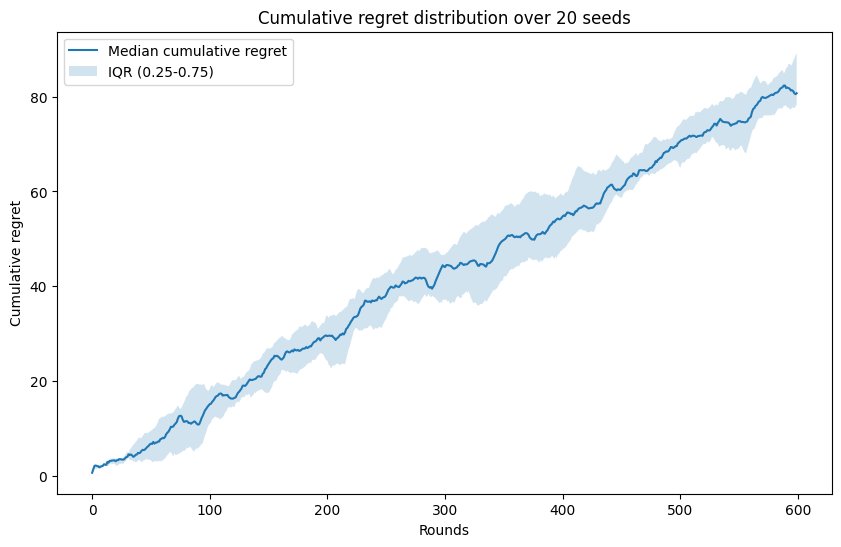

In [ ]:
run_one = 0
products = ['A','B','C']
budget = 800
T = 600
change_rounds = 30
U_T = int(T/change_rounds)
window = int(2*np.sqrt(T*np.log(T)/U_T))
#window = int(2*np.sqrt(np.log(T)))
seeds = [10123, 47281, 39502, 86734, 19285, 55012, 73190, 28461, 61027, 90834,
         45712, 67209, 31845, 82650, 14029, 59384, 71203, 40917, 28495, 63721]

fixed_prices = 0
if fixed_prices:
  K=10
  prices_per_product = np.linspace(0.01, 1, K)    
else:
  epsilon = T ** (-0.33)
  K = int(1 / epsilon)
  prices_per_product = np.linspace(0.01, 1, K)    

print(f'Discretizing prices with {K} values')
print(prices_per_product)
prices = {p: prices_per_product for p in products}
print(prices)

means = np.array([0.2, 0.5, 0.7])
covs = 0.01*np.array([[1., 0.3, 0.1],
                       [0.3, 1., 0.5],
                       [0.1, 0.5, 1]])

if run_one:
    utilities, _, _, clairv_util, fixed_hind_clair, _ = run_single_trial_combgp(0, products, prices, prices_per_product, budget, T, change_rounds, window, means, covs, seed=89)

    cum_utilities = np.cumsum(utilities)
    cum_clairv = np.cumsum(clairv_util)
    cum_clairv_fixed_hind = np.cumsum(fixed_hind_clair)

    avg_regret = cum_clairv - cum_utilities
    # avg_regret_fixed_hind = cum_clairv_fixed_hind - cum_utilities

    plt.figure(figsize=(10,6))
    plt.plot(avg_regret, label='Average Cumulative Regret')
    #plt.plot(avg_regret_fixed_hind, label='Average Cumulative Regret (Fixed, Hindsight)')
    plt.xlabel('Rounds')
    plt.ylabel('Cumulative Regret')
    plt.title('Average Regret vs Oracle over Multiple Trials')
    plt.legend()
    plt.show()

else:
    all_regrets, all_payments = run_all_trials_parallel_combgp(
    seeds, products, prices, prices_per_product, budget, T, change_rounds, window, means, covs, n_jobs=-1
    )
    all_regrets = np.array([np.pad(r, (0, T-len(r)), 'edge') for r in all_regrets])
    # Computes quantiles across trials for regret analysis
    lq_regret, median_regret, hq_regret = np.quantile(all_regrets, q=[0.25, 0.5, 0.75], axis=0)

    # Plot cumulative regret
    plt.figure(figsize=(10,6))
    plt.plot(median_regret, label='Median cumulative regret')
    plt.fill_between(range(T), lq_regret, hq_regret, alpha=0.2, label='IQR (0.25-0.75)')
    plt.xlabel('Rounds')
    plt.ylabel('Cumulative regret')
    plt.title(f'Cumulative regret distribution over {len(seeds)} seeds')
    plt.legend()
    plt.show()

Now, we increase the number of rounds after which the distribution changes

Discretizing prices with 8 values
[0.01       0.15142857 0.29285714 0.43428571 0.57571429 0.71714286
 0.85857143 1.        ]
{'A': array([0.01      , 0.15142857, 0.29285714, 0.43428571, 0.57571429,
       0.71714286, 0.85857143, 1.        ]), 'B': array([0.01      , 0.15142857, 0.29285714, 0.43428571, 0.57571429,
       0.71714286, 0.85857143, 1.        ]), 'C': array([0.01      , 0.15142857, 0.29285714, 0.43428571, 0.57571429,
       0.71714286, 0.85857143, 1.        ])}


Trial 1:   0%|          | 0/600 [00:00<?, ?it/s]




















Trial 1:   2%|▏         | 12/600 [00:00<00:06, 87.31it/s]




























Trial 1:   4%|▍         | 25/600 [00:00<00:05, 103.32it/s]





















Trial 1:   6%|▌         | 36/600 [00:00<00:06, 83.54it/s] 


























Trial 1:   8%|▊         | 45/600 [00:00<00:07, 75.08it/s]

















Trial 1:   9%|▉         | 53/600 [00:00<00:07, 71.17it/s]


























Trial 1:  10%|█         | 61/600 [00:00<00:08, 63.13it/s]



















Trial 1:  11%|█▏        | 68/600 [00:00<00:08, 61.76it/s]















Trial 1:  12%|█▎        | 75/600 [00:01<00:08, 60.04it/s]
























Trial 1:  14%|█▎        | 82/600 [00:01<00:08, 60.21it/s]




















Trial 1:  15%|█▍        | 89/600 [00:01<00:08, 58.98it/s]

















Trial 1:  16%|█▌        | 95/600 [00:01<00:10, 48.95it/s]






































Trial 1:  17%|█▋        | 101/600 [00:01

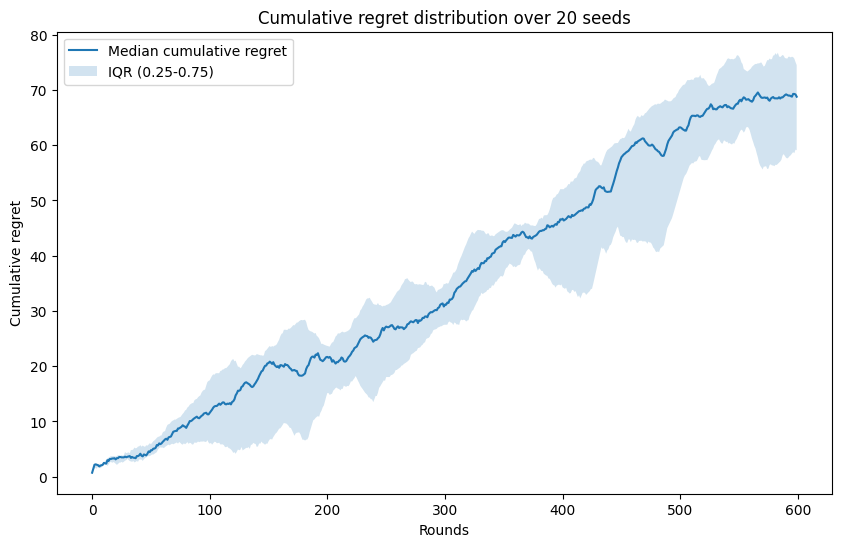

In [ ]:
run_one = 0
products = ['A','B','C']
budget = 800
T = 600
change_rounds = 60
U_T = int(T/change_rounds)
window = int(2*np.sqrt(T*np.log(T)/U_T))
#window = int(2*np.sqrt(np.log(T)))
seeds = [10123, 47281, 39502, 86734, 19285, 55012, 73190, 28461, 61027, 90834,
         45712, 67209, 31845, 82650, 14029, 59384, 71203, 40917, 28495, 63721]

fixed_prices = 0
if fixed_prices:
  K=10
  prices_per_product = np.linspace(0.01, 1, K)    
else:
  epsilon = T ** (-0.33)
  K = int(1 / epsilon)
  prices_per_product = np.linspace(0.01, 1, K)    

print(f'Discretizing prices with {K} values')
print(prices_per_product)
prices = {p: prices_per_product for p in products}
print(prices)

means = np.array([0.2, 0.5, 0.7])
covs = 0.01*np.array([[1., 0.3, 0.1],
                       [0.3, 1., 0.5],
                       [0.1, 0.5, 1]])

if run_one:
    utilities, _, _, clairv_util, fixed_hind_clair, _ = run_single_trial_combgp(0, products, prices, prices_per_product, budget, T, change_rounds, window, means, covs, seed=89)

    cum_utilities = np.cumsum(utilities)
    cum_clairv = np.cumsum(clairv_util)
    cum_clairv_fixed_hind = np.cumsum(fixed_hind_clair)

    avg_regret = cum_clairv - cum_utilities
    # avg_regret_fixed_hind = cum_clairv_fixed_hind - cum_utilities

    plt.figure(figsize=(10,6))
    plt.plot(avg_regret, label='Average Cumulative Regret')
    #plt.plot(avg_regret_fixed_hind, label='Average Cumulative Regret (Fixed, Hindsight)')
    plt.xlabel('Rounds')
    plt.ylabel('Cumulative Regret')
    plt.title('Average Regret vs Oracle over Multiple Trials')
    plt.legend()
    plt.show()

else:
    all_regrets, all_payments = run_all_trials_parallel_combgp(
    seeds, products, prices, prices_per_product, budget, T, change_rounds, window, means, covs, n_jobs=-1
    )

    all_regrets = np.array([np.pad(r, (0, T-len(r)), 'edge') for r in all_regrets])
    # Computes quantiles across trials for regret analysis
    lq_regret, median_regret, hq_regret = np.quantile(all_regrets, q=[0.25, 0.5, 0.75], axis=0)

    # Plot cumulative regret
    plt.figure(figsize=(10,6))
    plt.plot(median_regret, label='Median cumulative regret')
    plt.fill_between(range(T), lq_regret, hq_regret, alpha=0.2, label='IQR (0.25-0.75)')
    plt.xlabel('Rounds')
    plt.ylabel('Cumulative regret')
    plt.title(f'Cumulative regret distribution over {len(seeds)} seeds')
    plt.legend()
    plt.show()

Then, if we consider an almost stationary environment (change_rounds almost equal to T), we should expect better performances

Discretizing prices with 8 values
[0.01       0.15142857 0.29285714 0.43428571 0.57571429 0.71714286
 0.85857143 1.        ]
{'A': array([0.01      , 0.15142857, 0.29285714, 0.43428571, 0.57571429,
       0.71714286, 0.85857143, 1.        ]), 'B': array([0.01      , 0.15142857, 0.29285714, 0.43428571, 0.57571429,
       0.71714286, 0.85857143, 1.        ]), 'C': array([0.01      , 0.15142857, 0.29285714, 0.43428571, 0.57571429,
       0.71714286, 0.85857143, 1.        ])}


Trial 1:   0%|          | 0/600 [00:00<?, ?it/s]














Trial 1:   2%|▏         | 14/600 [00:00<00:04, 117.57it/s]




















Trial 1:   4%|▍         | 26/600 [00:00<00:06, 92.73it/s] 



















Trial 1:   6%|▌         | 36/600 [00:00<00:06, 82.02it/s]
























Trial 1:   8%|▊         | 45/600 [00:00<00:07, 74.89it/s]































Trial 1:   9%|▉         | 53/600 [00:00<00:12, 44.45it/s]




















Trial 1:  12%|█▏        | 70/600 [00:01<00:07, 67.74it/s]








































Trial 1:  13%|█▎        | 80/600 [00:01<00:10, 49.76it/s]




















Trial 1:  15%|█▌        | 92/600 [00:01<00:08, 61.16it/s]






























Trial 1:  17%|█▋        | 101/600 [00:01<00:08, 57.76it/s]

















Trial 1:  18%|█▊        | 109/600 [00:01<00:08, 56.71it/s]




















Trial 1:  19%|█▉        | 116/600 [00:01<00:08, 56.44it/s]













Trial 1:  20%|██        | 123/600 [00:02

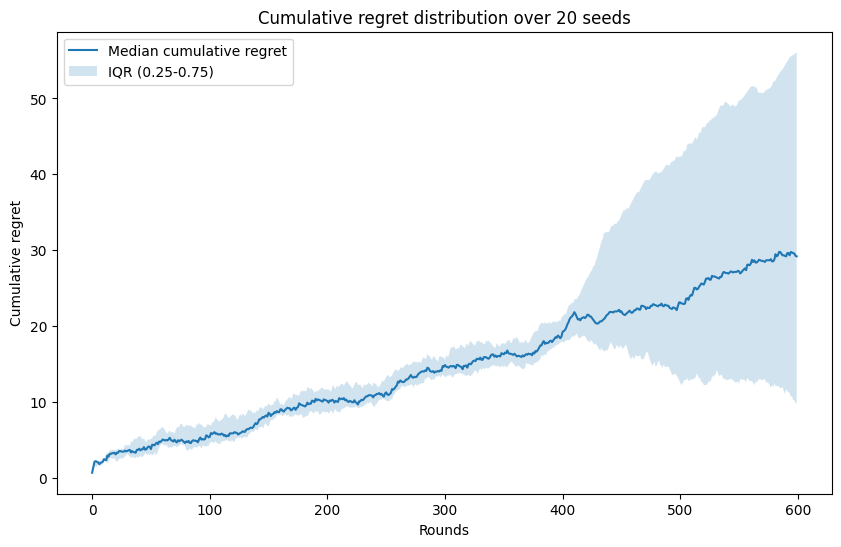

In [ ]:
run_one = 0
products = ['A','B','C']
budget = 800
T = 600
change_rounds = 400
U_T = int(T/change_rounds)
window = int(2*np.sqrt(T*np.log(T)/U_T))
#window = int(2*np.sqrt(np.log(T)))
seeds = [10123, 47281, 39502, 86734, 19285, 55012, 73190, 28461, 61027, 90834,
         45712, 67209, 31845, 82650, 14029, 59384, 71203, 40917, 28495, 63721]

fixed_prices = 0
if fixed_prices:
  K=10
  prices_per_product = np.linspace(0.01, 1, K)    
else:
  epsilon = T ** (-0.33)
  K = int(1 / epsilon)
  prices_per_product = np.linspace(0.01, 1, K)    

print(f'Discretizing prices with {K} values')
print(prices_per_product)
prices = {p: prices_per_product for p in products}
print(prices)

means = np.array([0.2, 0.5, 0.7])
covs = 0.01*np.array([[1., 0.3, 0.1],
                       [0.3, 1., 0.5],
                       [0.1, 0.5, 1]])

if run_one:
    utilities, _, _, clairv_util, fixed_hind_clair, _ = run_single_trial_combgp(0, products, prices, prices_per_product, budget, T, change_rounds, window, means, covs, seed=89)

    cum_utilities = np.cumsum(utilities)
    cum_clairv = np.cumsum(clairv_util)
    cum_clairv_fixed_hind = np.cumsum(fixed_hind_clair)

    avg_regret = cum_clairv - cum_utilities
    # avg_regret_fixed_hind = cum_clairv_fixed_hind - cum_utilities

    plt.figure(figsize=(10,6))
    plt.plot(avg_regret, label='Average Cumulative Regret')
    #plt.plot(avg_regret_fixed_hind, label='Average Cumulative Regret (Fixed, Hindsight)')
    plt.xlabel('Rounds')
    plt.ylabel('Cumulative Regret')
    plt.title('Average Regret vs Oracle over Multiple Trials')
    plt.legend()
    plt.show()

else:
    all_regrets, all_payments = run_all_trials_parallel_combgp(
    seeds, products, prices, prices_per_product, budget, T, change_rounds, window, means, covs, n_jobs=-1
    )
    all_regrets = np.array([np.pad(r, (0, T-len(r)), 'edge') for r in all_regrets])
    # Computes quantiles across trials for regret analysis
    lq_regret, median_regret, hq_regret = np.quantile(all_regrets, q=[0.25, 0.5, 0.75], axis=0)

    # Plot cumulative regret
    plt.figure(figsize=(10,6))
    plt.plot(median_regret, label='Median cumulative regret')
    plt.fill_between(range(T), lq_regret, hq_regret, alpha=0.2, label='IQR (0.25-0.75)')
    plt.xlabel('Rounds')
    plt.ylabel('Cumulative regret')
    plt.title(f'Cumulative regret distribution over {len(seeds)} seeds')
    plt.legend()
    plt.show()

While with a highly non stationary environment, the performances drop down.

Discretizing prices with 8 values
[0.01       0.15142857 0.29285714 0.43428571 0.57571429 0.71714286
 0.85857143 1.        ]
{'A': array([0.01      , 0.15142857, 0.29285714, 0.43428571, 0.57571429,
       0.71714286, 0.85857143, 1.        ]), 'B': array([0.01      , 0.15142857, 0.29285714, 0.43428571, 0.57571429,
       0.71714286, 0.85857143, 1.        ]), 'C': array([0.01      , 0.15142857, 0.29285714, 0.43428571, 0.57571429,
       0.71714286, 0.85857143, 1.        ])}


Trial 1:   0%|          | 0/600 [00:00<?, ?it/s]














Trial 1:   2%|▏         | 10/600 [00:00<00:05, 99.05it/s]



































Trial 1:   3%|▎         | 20/600 [00:00<00:11, 50.93it/s]





















Trial 1:   4%|▍         | 27/600 [00:00<00:12, 45.11it/s]















































Trial 1:   6%|▌         | 33/600 [00:00<00:19, 29.41it/s]



















Trial 1:   6%|▌         | 37/600 [00:01<00:18, 29.86it/s]
































Trial 1:   7%|▋         | 41/600 [00:01<00:21, 26.20it/s]



















Trial 1:   7%|▋         | 44/600 [00:01<00:21, 26.30it/s]




















Trial 1:   8%|▊         | 48/600 [00:01<00:19, 28.22it/s]


























Trial 1:   9%|▊         | 52/600 [00:01<00:23, 23.38it/s]


















Trial 1:  10%|█         | 62/600 [00:01<00:14, 37.98it/s]

























Trial 1:  11%|█         | 67/600 [00:01<00:14, 38.03it/s]






























Trial 1

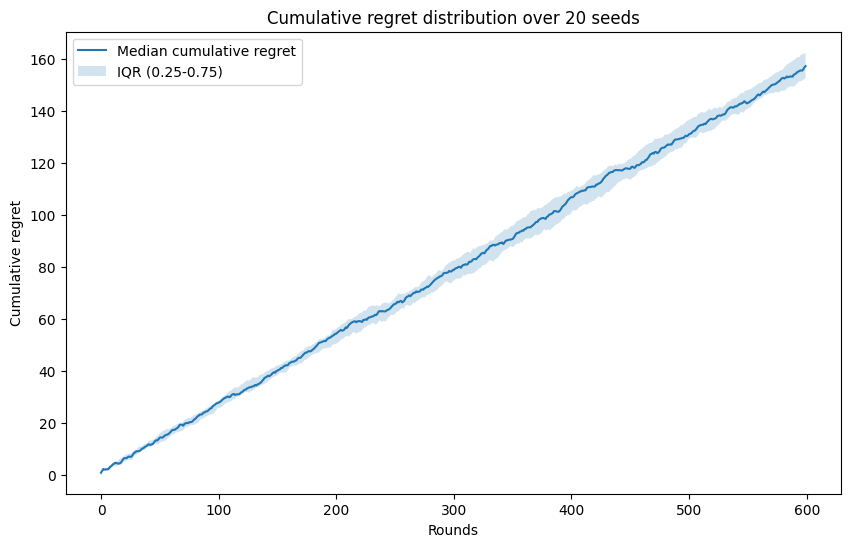

In [ ]:
run_one = 0
products = ['A','B','C']
budget = 800
T = 600
change_rounds = 3
U_T = int(T/change_rounds)
window = int(2*np.sqrt(T*np.log(T)/U_T))
#window = int(2*np.sqrt(np.log(T)))
seeds = [10123, 47281, 39502, 86734, 19285, 55012, 73190, 28461, 61027, 90834,
         45712, 67209, 31845, 82650, 14029, 59384, 71203, 40917, 28495, 63721]

fixed_prices = 0
if fixed_prices:
  K=10
  prices_per_product = np.linspace(0.01, 1, K)    
else:
  epsilon = T ** (-0.33)
  K = int(1 / epsilon)
  prices_per_product = np.linspace(0.01, 1, K)    

print(f'Discretizing prices with {K} values')
print(prices_per_product)
prices = {p: prices_per_product for p in products}
print(prices)

means = np.array([0.2, 0.5, 0.7])
covs = 0.01*np.array([[1., 0.3, 0.1],
                       [0.3, 1., 0.5],
                       [0.1, 0.5, 1]])

if run_one:
    utilities, _, _, clairv_util, fixed_hind_clair, _ = run_single_trial_combgp(0, products, prices, prices_per_product, budget, T, change_rounds, window, means, covs, seed=89)

    cum_utilities = np.cumsum(utilities)
    cum_clairv = np.cumsum(clairv_util)
    cum_clairv_fixed_hind = np.cumsum(fixed_hind_clair)

    avg_regret = cum_clairv - cum_utilities
    # avg_regret_fixed_hind = cum_clairv_fixed_hind - cum_utilities

    plt.figure(figsize=(10,6))
    plt.plot(avg_regret, label='Average Cumulative Regret')
    #plt.plot(avg_regret_fixed_hind, label='Average Cumulative Regret (Fixed, Hindsight)')
    plt.xlabel('Rounds')
    plt.ylabel('Cumulative Regret')
    plt.title('Average Regret vs Oracle over Multiple Trials')
    plt.legend()
    plt.show()

else:
    all_regrets, all_payments = run_all_trials_parallel_combgp(
    seeds, products, prices, prices_per_product, budget, T, change_rounds, window, means, covs, n_jobs=-1
    )
    all_regrets = np.array([np.pad(r, (0, T-len(r)), 'edge') for r in all_regrets])
    # Computes quantiles across trials for regret analysis
    lq_regret, median_regret, hq_regret = np.quantile(all_regrets, q=[0.25, 0.5, 0.75], axis=0)

    # Plot cumulative regret
    plt.figure(figsize=(10,6))
    plt.plot(median_regret, label='Median cumulative regret')
    plt.fill_between(range(T), lq_regret, hq_regret, alpha=0.2, label='IQR (0.25-0.75)')
    plt.xlabel('Rounds')
    plt.ylabel('Cumulative regret')
    plt.title(f'Cumulative regret distribution over {len(seeds)} seeds')
    plt.legend()
    plt.show()

With B > T, all the considerations done in the previous case (B < T) are still valid for this case.

### Trials with Primal_Dual

##### Single Trial with B < T

Discretizing prices with 8 values
[0.01       0.15142857 0.29285714 0.43428571 0.57571429 0.71714286
 0.85857143 1.        ]
{'A': array([0.01      , 0.15142857, 0.29285714, 0.43428571, 0.57571429,
       0.71714286, 0.85857143, 1.        ]), 'B': array([0.01      , 0.15142857, 0.29285714, 0.43428571, 0.57571429,
       0.71714286, 0.85857143, 1.        ]), 'C': array([0.01      , 0.15142857, 0.29285714, 0.43428571, 0.57571429,
       0.71714286, 0.85857143, 1.        ])}
Total # of Wins: 400
Gamma: {'A': array([ 0.,  0.,  0.,  0.,  0., -0.,  1.,  0.]), 'B': array([ 0.,  0.,  0.,  0., -0.,  1.,  0.,  0.]), 'C': array([0.        , 0.        , 0.        , 0.        , 0.57138685,
       0.42861315, 0.        , 0.        ])}


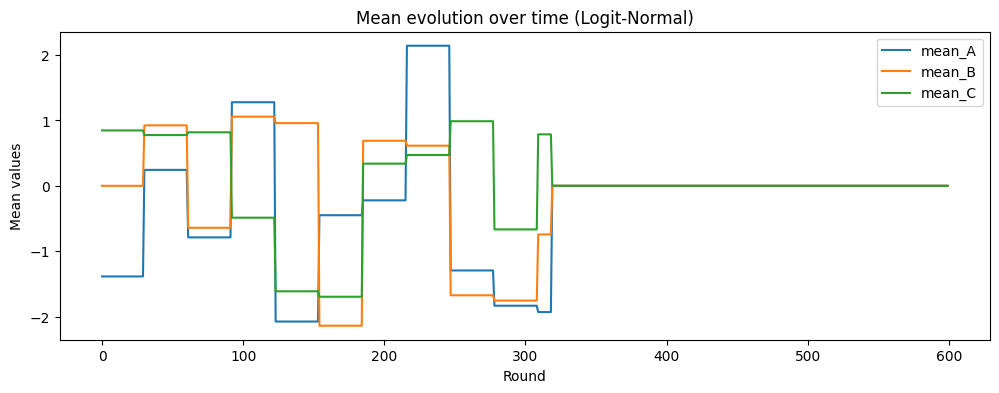

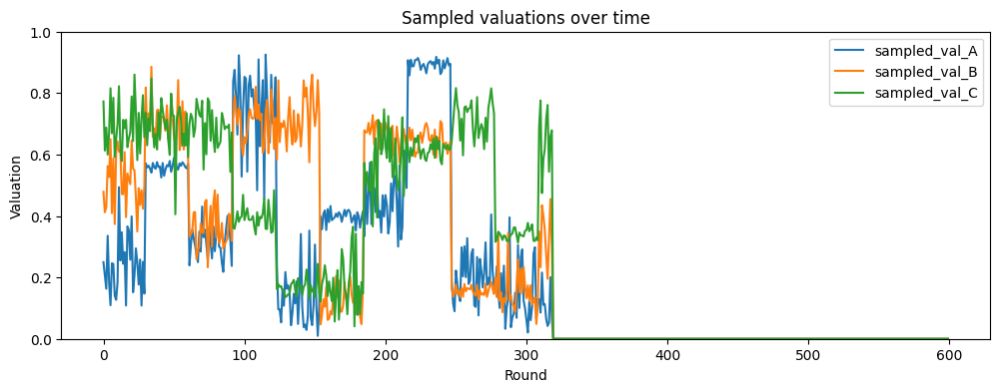

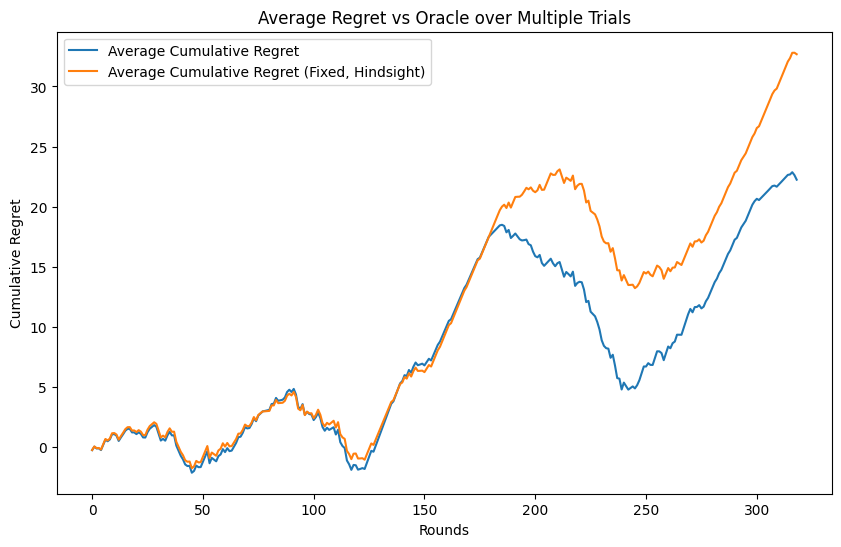

In [ ]:
run_one = 1
products = ['A','B','C']
budget = 400
T = 600
change_rounds = 30
seeds = [10123, 47281, 39502, 86734, 19285, 55012, 73190, 28461, 61027, 90834,
         45712, 67209, 31845, 82650, 14029, 59384, 71203, 40917, 28495, 63721]

fixed_prices = 0
if fixed_prices:
  K=5
  prices_per_product = np.linspace(0.01, 1, K)
else:
  epsilon = T ** (-0.33)
  K = int(1 / epsilon)
  prices_per_product = np.linspace(0.01, 1, K)    

print(f'Discretizing prices with {K} values')
print(prices_per_product)
prices = {p: prices_per_product for p in products}
print(prices)

means = np.array([0.2, 0.5, 0.7])
covs = 0.01*np.array([[1., 0.3, 0.1],
                       [0.3, 1., 0.5],
                       [0.1, 0.5, 1]])

eta = T**(-0.6)
if run_one:
    utilities, _, _, clairv_util, fixed_hind_clair, _, history = run_single_trial_viz(0, products, prices, prices_per_product, budget, T, eta, K, means, covs, change_rounds, seed=89, n_viz_rounds=T)

    cum_utilities = np.cumsum(utilities)
    cum_clairv = np.cumsum(clairv_util)
    cum_clairv_fixed_hind = np.cumsum(fixed_hind_clair)

    avg_regret = cum_clairv - cum_utilities
    avg_regret_fixed_hind = cum_clairv_fixed_hind - cum_utilities

    plt.figure(figsize=(10,6))
    plt.plot(avg_regret, label='Average Cumulative Regret')
    plt.plot(avg_regret_fixed_hind, label='Average Cumulative Regret (Fixed, Hindsight)')
    plt.xlabel('Rounds')
    plt.ylabel('Cumulative Regret')
    plt.title('Average Regret vs Oracle over Multiple Trials')
    plt.legend()
    plt.show()

else:
    all_regrets, all_payments = run_all_trials_parallel(
    seeds, products, prices, prices_per_product, budget, T, eta, K, means, covs, change_rounds, n_jobs=-1
    )
    all_regrets = np.array([np.pad(r, (0, T-len(r)), 'edge') for r in all_regrets])
    # Computes quantiles across trials for regret analysis
    lq_regret, median_regret, hq_regret = np.quantile(all_regrets, q=[0.25, 0.5, 0.75], axis=0)
    all_payments = np.array([np.pad(r, (0, T-len(r)), 'edge') for r in all_payments])
    # Computes quantiles across trials for regret analysis
    lq_payments, median_payments, hq_payments = np.quantile(all_payments, q=[0.25, 0.5, 0.75], axis=0)

THe regret is **sublinear**, with peaks and dumps, depending on the number of intervals and the distribution at each interval.

##### Single Trial with B = T

Discretizing prices with 8 values
[0.01       0.15142857 0.29285714 0.43428571 0.57571429 0.71714286
 0.85857143 1.        ]
{'A': array([0.01      , 0.15142857, 0.29285714, 0.43428571, 0.57571429,
       0.71714286, 0.85857143, 1.        ]), 'B': array([0.01      , 0.15142857, 0.29285714, 0.43428571, 0.57571429,
       0.71714286, 0.85857143, 1.        ]), 'C': array([0.01      , 0.15142857, 0.29285714, 0.43428571, 0.57571429,
       0.71714286, 0.85857143, 1.        ])}
Total # of Wins: 600
Gamma: {'A': array([0., 0., 0., 0., 0., 1., 0., 0.]), 'B': array([0.        , 0.        , 0.        , 0.        , 0.06578332,
       0.93421668, 0.        , 0.        ]), 'C': array([0., 0., 0., 0., 1., 0., 0., 0.])}


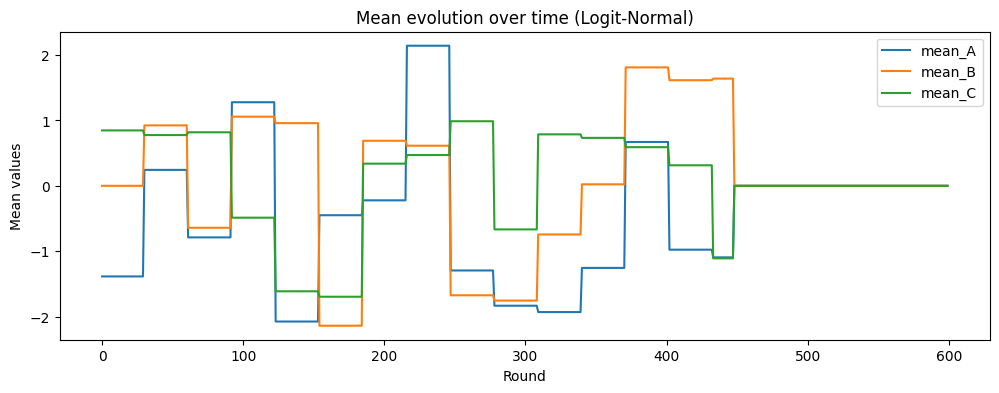

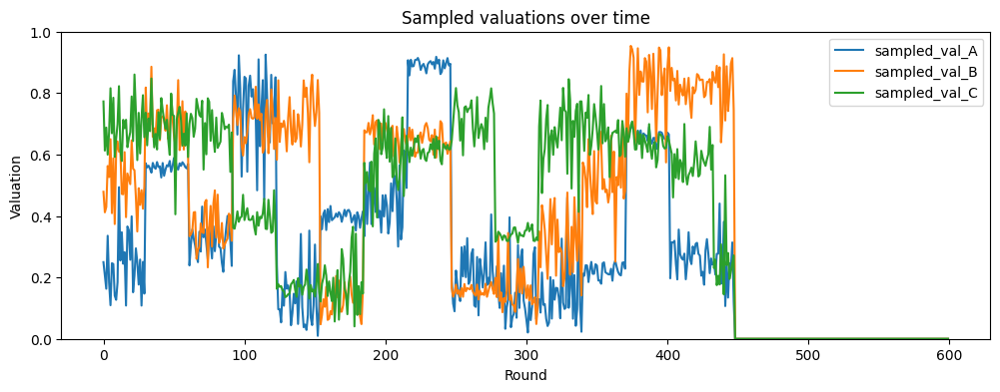

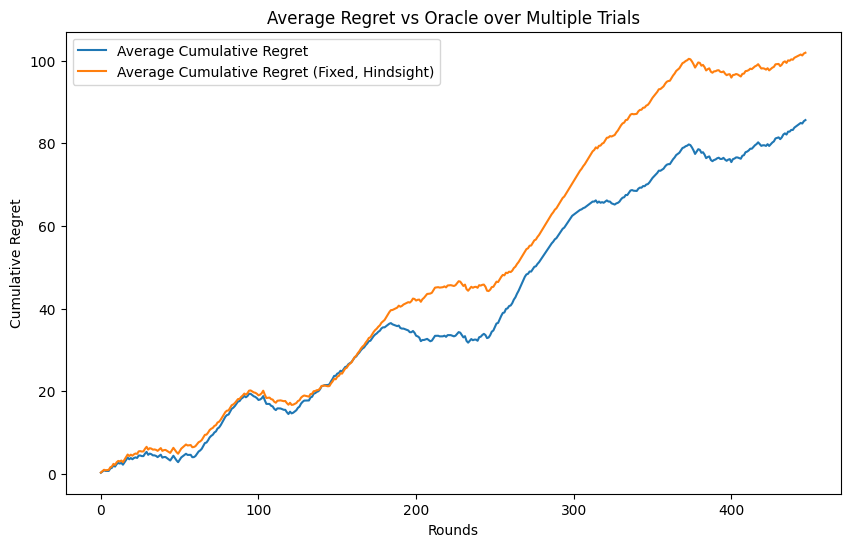

In [ ]:
run_one = 1
products = ['A','B','C']
budget = 600
T = 600
change_rounds = 30
seeds = [10123, 47281, 39502, 86734, 19285, 55012, 73190, 28461, 61027, 90834,
         45712, 67209, 31845, 82650, 14029, 59384, 71203, 40917, 28495, 63721]

fixed_prices = 0
if fixed_prices:
  K=5
  prices_per_product = np.linspace(0.01, 1, K)
else:
  epsilon = T ** (-0.33)
  K = int(1 / epsilon)
  prices_per_product = np.linspace(0.01, 1, K)    

print(f'Discretizing prices with {K} values')
print(prices_per_product)
prices = {p: prices_per_product for p in products}
print(prices)

means = np.array([0.2, 0.5, 0.7])
covs = 0.01*np.array([[1., 0.3, 0.1],
                       [0.3, 1., 0.5],
                       [0.1, 0.5, 1]])

eta = T**(-0.6)
if run_one:
    utilities, _, _, clairv_util, fixed_hind_clair, _, history = run_single_trial_viz(0, products, prices, prices_per_product, budget, T, eta, K, means, covs, change_rounds, seed=89, n_viz_rounds=T)

    cum_utilities = np.cumsum(utilities)
    cum_clairv = np.cumsum(clairv_util)
    cum_clairv_fixed_hind = np.cumsum(fixed_hind_clair)

    avg_regret = cum_clairv - cum_utilities
    avg_regret_fixed_hind = cum_clairv_fixed_hind - cum_utilities

    plt.figure(figsize=(10,6))
    plt.plot(avg_regret, label='Average Cumulative Regret')
    plt.plot(avg_regret_fixed_hind, label='Average Cumulative Regret (Fixed, Hindsight)')
    plt.xlabel('Rounds')
    plt.ylabel('Cumulative Regret')
    plt.title('Average Regret vs Oracle over Multiple Trials')
    plt.legend()
    plt.show()

else:
    all_regrets, all_payments = run_all_trials_parallel(
    seeds, products, prices, prices_per_product, budget, T, eta, K, means, covs, change_rounds, n_jobs=-1
    )
    all_regrets = np.array([np.pad(r, (0, T-len(r)), 'edge') for r in all_regrets])
    # Computes quantiles across trials for regret analysis
    lq_regret, median_regret, hq_regret = np.quantile(all_regrets, q=[0.25, 0.5, 0.75], axis=0)
    all_payments = np.array([np.pad(r, (0, T-len(r)), 'edge') for r in all_payments])
    # Computes quantiles across trials for regret analysis
    lq_payments, median_payments, hq_payments = np.quantile(all_payments, q=[0.25, 0.5, 0.75], axis=0)


**Sublinear** regret with peaks and dumps, as the previous case.

##### Single Trial with B > T

Discretizing prices with 8 values
[0.01       0.15142857 0.29285714 0.43428571 0.57571429 0.71714286
 0.85857143 1.        ]
{'A': array([0.01      , 0.15142857, 0.29285714, 0.43428571, 0.57571429,
       0.71714286, 0.85857143, 1.        ]), 'B': array([0.01      , 0.15142857, 0.29285714, 0.43428571, 0.57571429,
       0.71714286, 0.85857143, 1.        ]), 'C': array([0.01      , 0.15142857, 0.29285714, 0.43428571, 0.57571429,
       0.71714286, 0.85857143, 1.        ])}
Total # of Wins: 800
Gamma: {'A': array([0.        , 0.        , 0.        , 0.18392131, 0.81607869,
       0.        , 0.        , 0.        ]), 'B': array([0., 0., 0., 0., 1., 0., 0., 0.]), 'C': array([ 0.,  0.,  0., -0.,  1.,  0.,  0.,  0.])}


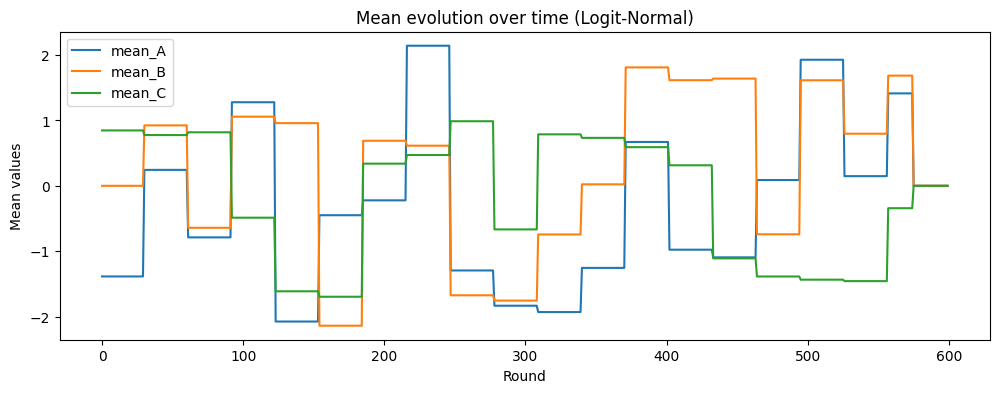

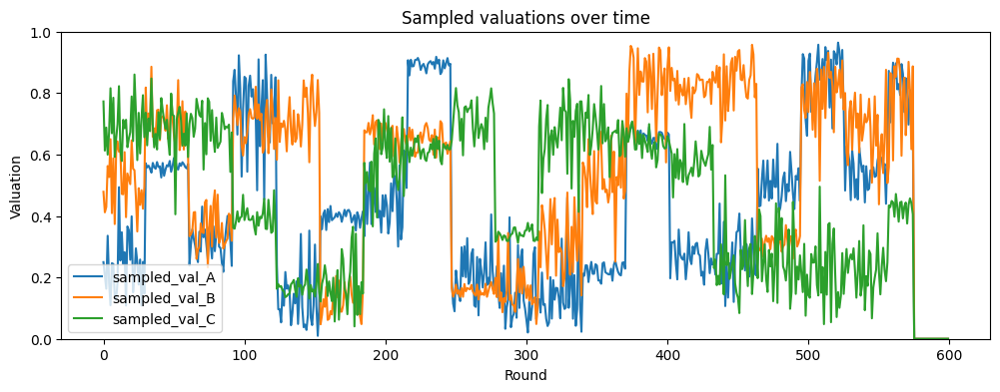

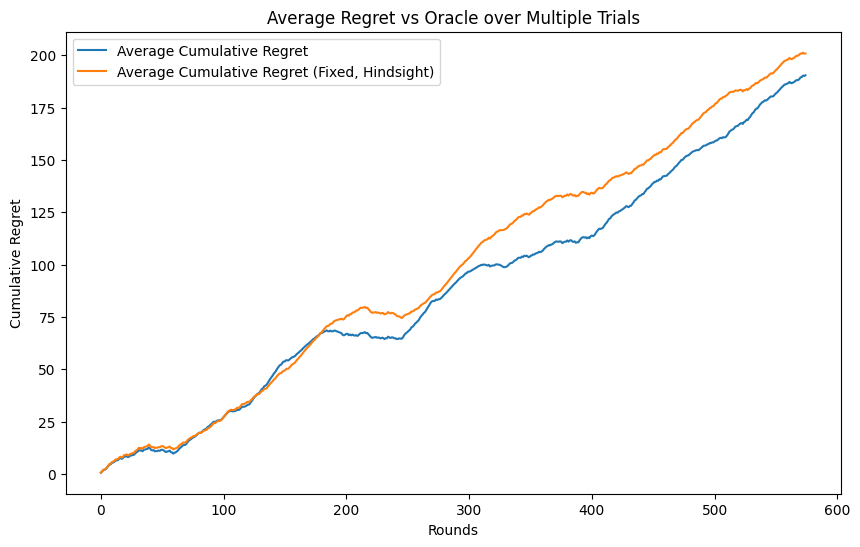

In [ ]:
run_one = 1
products = ['A','B','C']
budget = 800
T = 600
change_rounds = 30
seeds = [10123, 47281, 39502, 86734, 19285, 55012, 73190, 28461, 61027, 90834,
         45712, 67209, 31845, 82650, 14029, 59384, 71203, 40917, 28495, 63721]

fixed_prices = 0
if fixed_prices:
  K=10
  prices_per_product = np.linspace(0.01, 1, K)
else:
  epsilon = T ** (-0.33)
  K = int(1 / epsilon)
  prices_per_product = np.linspace(0.01, 1, K)    

print(f'Discretizing prices with {K} values')
print(prices_per_product)
prices = {p: prices_per_product for p in products}
print(prices)

means = np.array([0.2, 0.5, 0.7])
covs = 0.01*np.array([[1., 0.3, 0.1],
                       [0.3, 1., 0.5],
                       [0.1, 0.5, 1]])

eta = T**(-0.6)
if run_one:
    utilities, _, _, clairv_util, fixed_hind_clair, _, history = run_single_trial_viz(0, products, prices, prices_per_product, budget, T, eta, K, means, covs, change_rounds, seed=89, n_viz_rounds=T)

    cum_utilities = np.cumsum(utilities)
    cum_clairv = np.cumsum(clairv_util)
    cum_clairv_fixed_hind = np.cumsum(fixed_hind_clair)

    avg_regret = cum_clairv - cum_utilities
    avg_regret_fixed_hind = cum_clairv_fixed_hind - cum_utilities

    plt.figure(figsize=(10,6))
    plt.plot(avg_regret, label='Average Cumulative Regret')
    plt.plot(avg_regret_fixed_hind, label='Average Cumulative Regret (Fixed, Hindsight)')
    plt.xlabel('Rounds')
    plt.ylabel('Cumulative Regret')
    plt.title('Average Regret vs Oracle over Multiple Trials')
    plt.legend()
    plt.show()

else:
    all_regrets, all_payments = run_all_trials_parallel(
    seeds, products, prices, prices_per_product, budget, T, eta, K, means, covs, change_rounds, n_jobs=-1
    )
    all_regrets = np.array([np.pad(r, (0, T-len(r)), 'edge') for r in all_regrets])
    # Computes quantiles across trials for regret analysis
    lq_regret, median_regret, hq_regret = np.quantile(all_regrets, q=[0.25, 0.5, 0.75], axis=0)
    all_payments = np.array([np.pad(r, (0, T-len(r)), 'edge') for r in all_payments])
    # Computes quantiles across trials for regret analysis
    lq_payments, median_payments, hq_payments = np.quantile(all_payments, q=[0.25, 0.5, 0.75], axis=0)


**Sublinear** regret with less peaks and dumps, but the trend is similar the the previous ones, although less evident.

##### Multiple Trials with B < T

Discretizing prices with 8 values
[0.01       0.15142857 0.29285714 0.43428571 0.57571429 0.71714286
 0.85857143 1.        ]
{'A': array([0.01      , 0.15142857, 0.29285714, 0.43428571, 0.57571429,
       0.71714286, 0.85857143, 1.        ]), 'B': array([0.01      , 0.15142857, 0.29285714, 0.43428571, 0.57571429,
       0.71714286, 0.85857143, 1.        ]), 'C': array([0.01      , 0.15142857, 0.29285714, 0.43428571, 0.57571429,
       0.71714286, 0.85857143, 1.        ])}

















Trial 1:   0%|          | 0/600 [00:00<?, ?it/s]














Trial 1:   7%|▋         | 41/600 [00:00<00:01, 408.12it/s]














Trial 1:  16%|█▌        | 93/600 [00:00<00:01, 404.76it/s]











Trial 1:  22%|██▎       | 135/600 [00:00<00:01, 386.42it/s]















Trial 1:  31%|███       | 186/600 [00:00<00:01, 404.76it/s]















Trial 1:  39%|███▊      | 232/600 [00:00<00:00, 422.63it/s]















Trial 1:  46%|████▌     | 275/600 [00:00<00:00, 395.68it/s]
























                                                           




























































































































































































































































































































































































































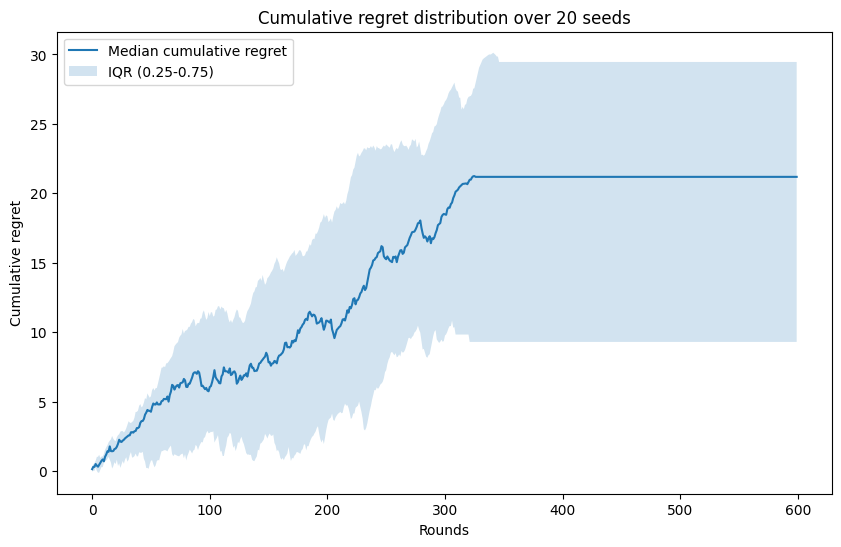

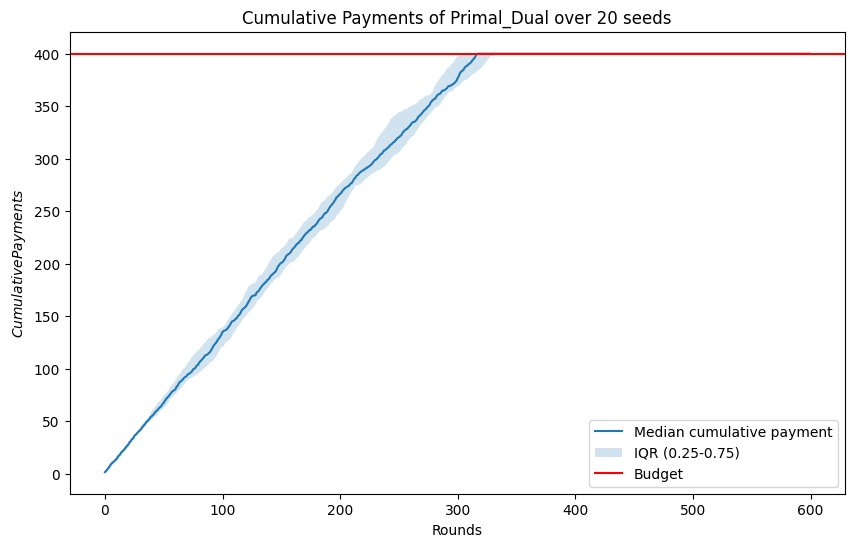

In [18]:
run_one = 0
products = ['A','B','C']
budget = 400
T = 600
change_rounds = 30
seeds = [10123, 47281, 39502, 86734, 19285, 55012, 73190, 28461, 61027, 90834,
         45712, 67209, 31845, 82650, 14029, 59384, 71203, 40917, 28495, 63721]

fixed_prices = 0
if fixed_prices:
  K=10
  prices_per_product = np.linspace(0.01, 1, K)
else:
  epsilon = T ** (-0.33)
  K = int(1 / epsilon)
  prices_per_product = np.linspace(0.01, 1, K)    

print(f'Discretizing prices with {K} values')
print(prices_per_product)
prices = {p: prices_per_product for p in products}
print(prices)

means = np.array([0.2, 0.5, 0.7])
covs = 0.01*np.array([[1., 0.3, 0.1],
                       [0.3, 1., 0.5],
                       [0.1, 0.5, 1]])

eta = T**(-0.6)
if run_one:
    utilities, _, _, clairv_util, fixed_hind_clair, history = run_single_trial_viz(0, products, prices, prices_per_product, budget, T, eta, K, means, covs, change_rounds, seed=89, n_viz_rounds=T)

    cum_utilities = np.cumsum(utilities)
    cum_clairv = np.cumsum(clairv_util)
    cum_clairv_fixed_hind = np.cumsum(fixed_hind_clair)

    avg_regret = cum_clairv - cum_utilities
    avg_regret_fixed_hind = cum_clairv_fixed_hind - cum_utilities

    plt.figure(figsize=(10,6))
    plt.plot(avg_regret, label='Average Cumulative Regret')
    plt.plot(avg_regret_fixed_hind, label='Average Cumulative Regret (Fixed, Hindsight)')
    plt.xlabel('Rounds')
    plt.ylabel('Cumulative Regret')
    plt.title('Average Regret vs Oracle over Multiple Trials')
    plt.legend()
    plt.show()

else:
    all_regrets, all_payments = run_all_trials_parallel(
    seeds, products, prices, prices_per_product, budget, T, eta, K, means, covs, change_rounds, n_jobs=-1
    )
    all_regrets = np.array([np.pad(r, (0, T-len(r)), 'edge') for r in all_regrets])
    # Computes quantiles across trials for regret analysis
    lq_regret, median_regret, hq_regret = np.quantile(all_regrets, q=[0.25, 0.5, 0.75], axis=0)
    all_payments = np.array([np.pad(r, (0, T-len(r)), 'edge') for r in all_payments])
    # Computes quantiles across trials for regret analysis
    lq_payments, median_payments, hq_payments = np.quantile(all_payments, q=[0.25, 0.5, 0.75], axis=0)

    # Plot cumulative regret
    plt.figure(figsize=(10,6))
    plt.plot(median_regret, label='Median cumulative regret')
    # Plot interquartile range 
    plt.fill_between(range(T), lq_regret, hq_regret, alpha=0.2, label='IQR (0.25-0.75)')
    plt.xlabel('Rounds')
    plt.ylabel('Cumulative regret')
    plt.title(f'Cumulative regret distribution over {len(seeds)} seeds')
    plt.legend()
    plt.show()

    plt.figure(figsize=(10,6))
    plt.plot(median_payments, label='Median cumulative payment')
    # Plot interquartile range 
    plt.fill_between(range(T), lq_payments, hq_payments, alpha=0.2, label='IQR (0.25-0.75)')
    plt.xlabel('Rounds')
    plt.ylabel('$Cumulative Payments$')
    plt.axhline(budget, color='red', label='Budget')
    plt.legend()
    plt.title(f'Cumulative Payments of Primal_Dual over {len(seeds)} seeds')
    plt.show()

The regret is **sublinear**.

Now, we increase the number of rounds after which the distribution changes.

Discretizing prices with 8 values
[0.01       0.15142857 0.29285714 0.43428571 0.57571429 0.71714286
 0.85857143 1.        ]
{'A': array([0.01      , 0.15142857, 0.29285714, 0.43428571, 0.57571429,
       0.71714286, 0.85857143, 1.        ]), 'B': array([0.01      , 0.15142857, 0.29285714, 0.43428571, 0.57571429,
       0.71714286, 0.85857143, 1.        ]), 'C': array([0.01      , 0.15142857, 0.29285714, 0.43428571, 0.57571429,
       0.71714286, 0.85857143, 1.        ])}


Trial 1:   0%|          | 0/600 [00:00<?, ?it/s]









Trial 1:  20%|██        | 121/600 [00:00<00:00, 1189.47it/s]















Trial 1:  40%|████      | 240/600 [00:00<00:00, 688.19it/s] 









                                                           


































































































































































































































































































































































































































































































































































































































































































































































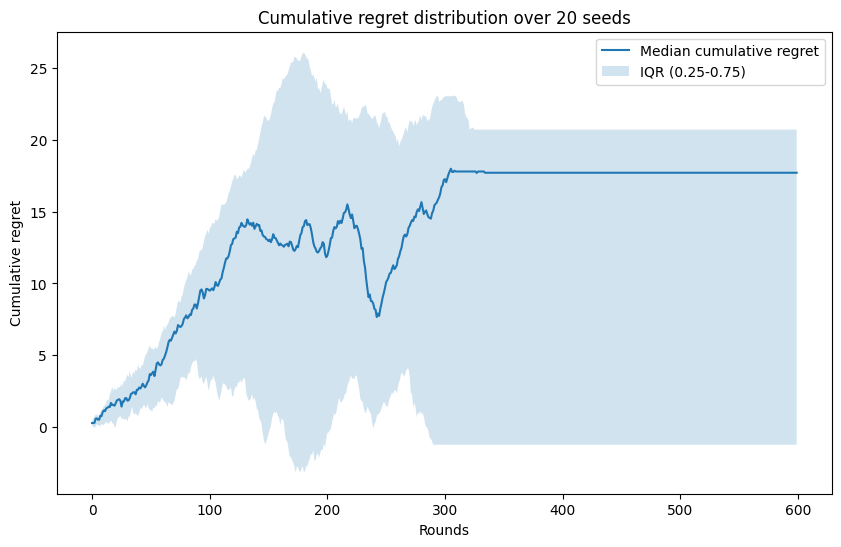

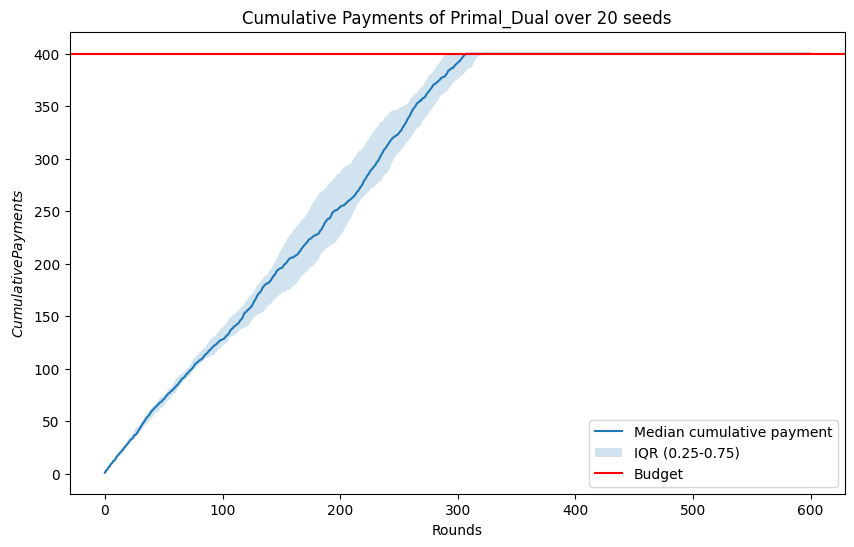

In [19]:
run_one = 0
products = ['A','B','C']
budget = 400
T = 600
change_rounds = 60
seeds = [10123, 47281, 39502, 86734, 19285, 55012, 73190, 28461, 61027, 90834,
         45712, 67209, 31845, 82650, 14029, 59384, 71203, 40917, 28495, 63721]

fixed_prices = 0
if fixed_prices:
  K=10
  prices_per_product = np.linspace(0.01, 1, K)
else:
  epsilon = T ** (-0.33)
  K = int(1 / epsilon)
  prices_per_product = np.linspace(0.01, 1, K)    

print(f'Discretizing prices with {K} values')
print(prices_per_product)
prices = {p: prices_per_product for p in products}
print(prices)

means = np.array([0.2, 0.5, 0.7])
covs = 0.01*np.array([[1., 0.3, 0.1],
                       [0.3, 1., 0.5],
                       [0.1, 0.5, 1]])

eta = T**(-0.6)
if run_one:
    utilities, _, _, clairv_util, fixed_hind_clair, history = run_single_trial_viz(0, products, prices, prices_per_product, budget, T, eta, K, means, covs, change_rounds, seed=89, n_viz_rounds=T)

    cum_utilities = np.cumsum(utilities)
    cum_clairv = np.cumsum(clairv_util)
    cum_clairv_fixed_hind = np.cumsum(fixed_hind_clair)

    avg_regret = cum_clairv - cum_utilities
    avg_regret_fixed_hind = cum_clairv_fixed_hind - cum_utilities

    plt.figure(figsize=(10,6))
    plt.plot(avg_regret, label='Average Cumulative Regret')
    plt.plot(avg_regret_fixed_hind, label='Average Cumulative Regret (Fixed, Hindsight)')
    plt.xlabel('Rounds')
    plt.ylabel('Cumulative Regret')
    plt.title('Average Regret vs Oracle over Multiple Trials')
    plt.legend()
    plt.show()

else:
    all_regrets, all_payments = run_all_trials_parallel(
    seeds, products, prices, prices_per_product, budget, T, eta, K, means, covs, change_rounds, n_jobs=-1
    )
    all_regrets = np.array([np.pad(r, (0, T-len(r)), 'edge') for r in all_regrets])
    # Computes quantiles across trials for regret analysis
    lq_regret, median_regret, hq_regret = np.quantile(all_regrets, q=[0.25, 0.5, 0.75], axis=0)
    all_payments = np.array([np.pad(r, (0, T-len(r)), 'edge') for r in all_payments])
    # Computes quantiles across trials for regret analysis
    lq_payments, median_payments, hq_payments = np.quantile(all_payments, q=[0.25, 0.5, 0.75], axis=0)

    # Plot cumulative regret
    plt.figure(figsize=(10,6))
    plt.plot(median_regret, label='Median cumulative regret')
    # Plot interquartile range 
    plt.fill_between(range(T), lq_regret, hq_regret, alpha=0.2, label='IQR (0.25-0.75)')
    plt.xlabel('Rounds')
    plt.ylabel('Cumulative regret')
    plt.title(f'Cumulative regret distribution over {len(seeds)} seeds')
    plt.legend()
    plt.show()

    plt.figure(figsize=(10,6))
    plt.plot(median_payments, label='Median cumulative payment')
    # Plot interquartile range 
    plt.fill_between(range(T), lq_payments, hq_payments, alpha=0.2, label='IQR (0.25-0.75)')
    plt.xlabel('Rounds')
    plt.ylabel('$Cumulative Payments$')
    plt.axhline(budget, color='red', label='Budget')
    plt.legend()
    plt.title(f'Cumulative Payments of Primal_Dual over {len(seeds)} seeds')
    plt.show()

Still **sublinear** regret.

Then, if we consider an almost stationary environment (change_rounds almost equal to T), we should expect worse performances

Discretizing prices with 8 values
[0.01       0.15142857 0.29285714 0.43428571 0.57571429 0.71714286
 0.85857143 1.        ]
{'A': array([0.01      , 0.15142857, 0.29285714, 0.43428571, 0.57571429,
       0.71714286, 0.85857143, 1.        ]), 'B': array([0.01      , 0.15142857, 0.29285714, 0.43428571, 0.57571429,
       0.71714286, 0.85857143, 1.        ]), 'C': array([0.01      , 0.15142857, 0.29285714, 0.43428571, 0.57571429,
       0.71714286, 0.85857143, 1.        ])}


Trial 1:   3%|▎         | 17/600 [00:00<00:04, 120.67it/s]









Trial 1:  14%|█▍        | 83/600 [00:00<00:01, 392.00it/s]











Trial 1:  21%|██        | 127/600 [00:00<00:01, 261.25it/s]













Trial 1:  27%|██▋       | 160/600 [00:00<00:01, 274.18it/s]




















Trial 1:  34%|███▍      | 203/600 [00:00<00:01, 314.03it/s]
























Trial 1:  40%|███▉      | 239/600 [00:00<00:01, 264.73it/s]


















                                                           






















































































































































































































































































































































































































































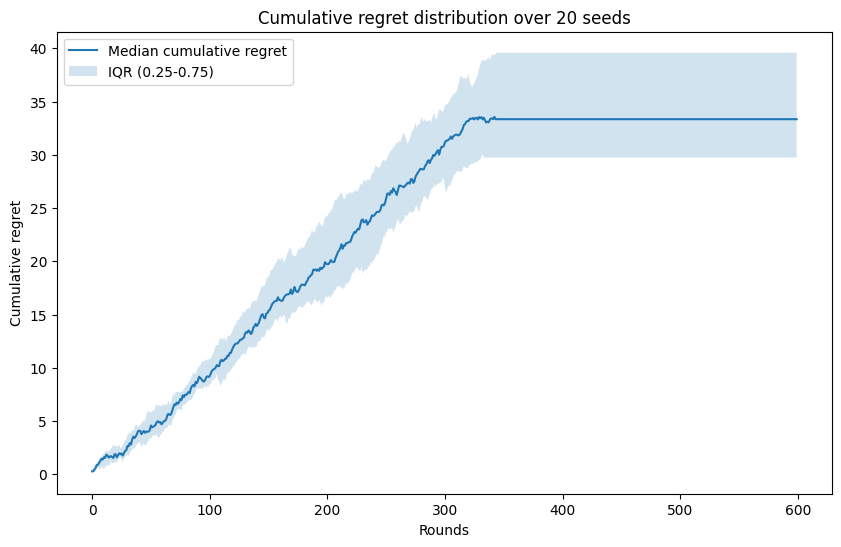

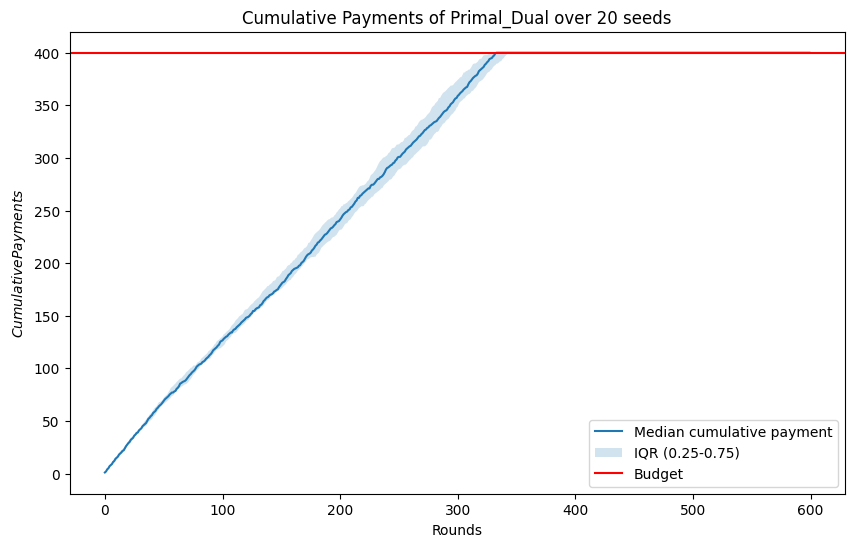

In [20]:
run_one = 0
products = ['A','B','C']
budget = 400
T = 600
change_rounds = 400
seeds = [10123, 47281, 39502, 86734, 19285, 55012, 73190, 28461, 61027, 90834,
         45712, 67209, 31845, 82650, 14029, 59384, 71203, 40917, 28495, 63721]

fixed_prices = 0
if fixed_prices:
  K=10
  prices_per_product = np.linspace(0.01, 1, K)
else:
  epsilon = T ** (-0.33)
  K = int(1 / epsilon)
  prices_per_product = np.linspace(0.01, 1, K)    

print(f'Discretizing prices with {K} values')
print(prices_per_product)
prices = {p: prices_per_product for p in products}
print(prices)

means = np.array([0.2, 0.5, 0.7])
covs = 0.01*np.array([[1., 0.3, 0.1],
                       [0.3, 1., 0.5],
                       [0.1, 0.5, 1]])

eta = T**(-0.6)
if run_one:
    utilities, _, _, clairv_util, fixed_hind_clair, history = run_single_trial_viz(0, products, prices, prices_per_product, budget, T, eta, K, means, covs, change_rounds, seed=89, n_viz_rounds=T)

    cum_utilities = np.cumsum(utilities)
    cum_clairv = np.cumsum(clairv_util)
    cum_clairv_fixed_hind = np.cumsum(fixed_hind_clair)

    avg_regret = cum_clairv - cum_utilities
    avg_regret_fixed_hind = cum_clairv_fixed_hind - cum_utilities

    plt.figure(figsize=(10,6))
    plt.plot(avg_regret, label='Average Cumulative Regret')
    plt.plot(avg_regret_fixed_hind, label='Average Cumulative Regret (Fixed, Hindsight)')
    plt.xlabel('Rounds')
    plt.ylabel('Cumulative Regret')
    plt.title('Average Regret vs Oracle over Multiple Trials')
    plt.legend()
    plt.show()

else:
    all_regrets, all_payments = run_all_trials_parallel(
    seeds, products, prices, prices_per_product, budget, T, eta, K, means, covs, change_rounds, n_jobs=-1
    )
    all_regrets = np.array([np.pad(r, (0, T-len(r)), 'edge') for r in all_regrets])
    # Computes quantiles across trials for regret analysis
    lq_regret, median_regret, hq_regret = np.quantile(all_regrets, q=[0.25, 0.5, 0.75], axis=0)
    all_payments = np.array([np.pad(r, (0, T-len(r)), 'edge') for r in all_payments])
    # Computes quantiles across trials for regret analysis
    lq_payments, median_payments, hq_payments = np.quantile(all_payments, q=[0.25, 0.5, 0.75], axis=0)

    # Plot cumulative regret
    plt.figure(figsize=(10,6))
    plt.plot(median_regret, label='Median cumulative regret')
    # Plot interquartile range 
    plt.fill_between(range(T), lq_regret, hq_regret, alpha=0.2, label='IQR (0.25-0.75)')
    plt.xlabel('Rounds')
    plt.ylabel('Cumulative regret')
    plt.title(f'Cumulative regret distribution over {len(seeds)} seeds')
    plt.legend()
    plt.show()

    plt.figure(figsize=(10,6))
    plt.plot(median_payments, label='Median cumulative payment')
    # Plot interquartile range 
    plt.fill_between(range(T), lq_payments, hq_payments, alpha=0.2, label='IQR (0.25-0.75)')
    plt.xlabel('Rounds')
    plt.ylabel('$Cumulative Payments$')
    plt.axhline(budget, color='red', label='Budget')
    plt.legend()
    plt.title(f'Cumulative Payments of Primal_Dual over {len(seeds)} seeds')
    plt.show()

While with an almost highly non-stationary environment, the performances should become better.

Discretizing prices with 8 values
[0.01       0.15142857 0.29285714 0.43428571 0.57571429 0.71714286
 0.85857143 1.        ]
{'A': array([0.01      , 0.15142857, 0.29285714, 0.43428571, 0.57571429,
       0.71714286, 0.85857143, 1.        ]), 'B': array([0.01      , 0.15142857, 0.29285714, 0.43428571, 0.57571429,
       0.71714286, 0.85857143, 1.        ]), 'C': array([0.01      , 0.15142857, 0.29285714, 0.43428571, 0.57571429,
       0.71714286, 0.85857143, 1.        ])}


Trial 1:   0%|          | 0/600 [00:00<?, ?it/s]














Trial 1:   3%|▎         | 20/600 [00:00<00:03, 160.44it/s]



































Trial 1:   6%|▌         | 37/600 [00:00<00:05, 106.71it/s]


























Trial 1:   8%|▊         | 49/600 [00:00<00:05, 92.83it/s] 




















Trial 1:  10%|▉         | 59/600 [00:00<00:06, 88.07it/s]

























Trial 1:  11%|█▏        | 68/600 [00:00<00:06, 81.13it/s]




















Trial 1:  13%|█▎        | 78/600 [00:00<00:06, 86.02it/s]




















Trial 1:  14%|█▍        | 87/600 [00:00<00:06, 81.67it/s]



























Trial 1:  16%|█▌        | 96/600 [00:01<00:06, 74.57it/s]




















Trial 1:  17%|█▋        | 104/600 [00:01<00:06, 72.20it/s]
















Trial 1:  19%|█▊        | 112/600 [00:01<00:06, 73.10it/s]


















Trial 1:  20%|██        | 121/600 [00:01<00:06, 76.75it/s]























Trial 1:  22%|██▏       | 129/600 [00:01<00

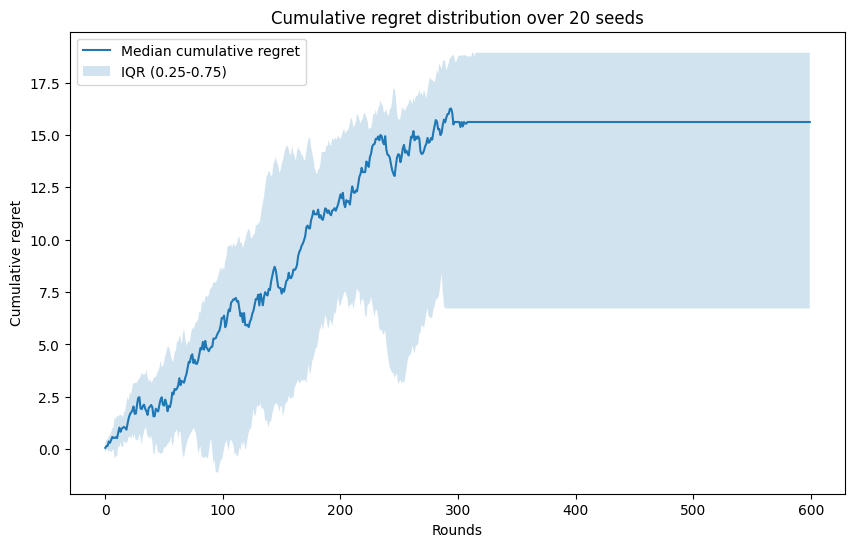

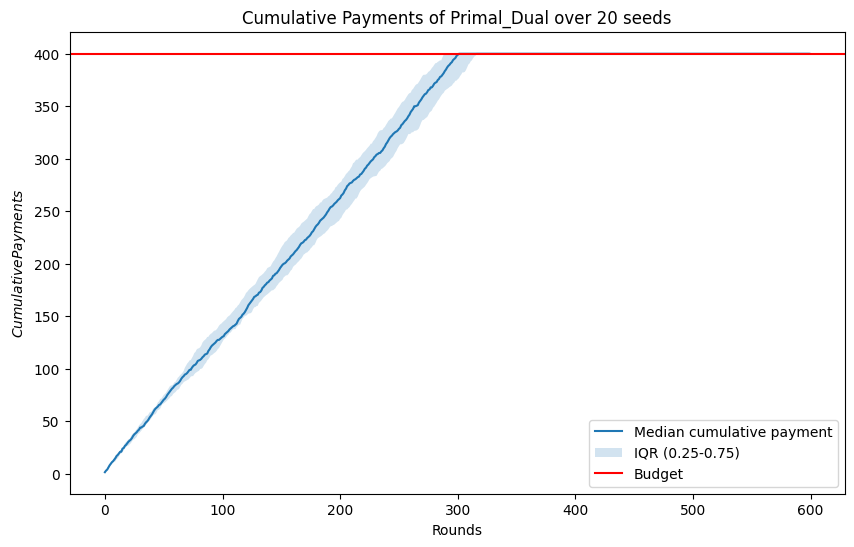

In [21]:
run_one = 0
products = ['A','B','C']
budget = 400
T = 600
change_rounds = 3
seeds = [10123, 47281, 39502, 86734, 19285, 55012, 73190, 28461, 61027, 90834,
         45712, 67209, 31845, 82650, 14029, 59384, 71203, 40917, 28495, 63721]

fixed_prices = 0
if fixed_prices:
  K=10
  prices_per_product = np.linspace(0.01, 1, K)
else:
  epsilon = T ** (-0.33)
  K = int(1 / epsilon)
  prices_per_product = np.linspace(0.01, 1, K)    

print(f'Discretizing prices with {K} values')
print(prices_per_product)
prices = {p: prices_per_product for p in products}
print(prices)

means = np.array([0.2, 0.5, 0.7])
covs = 0.01*np.array([[1., 0.3, 0.1],
                       [0.3, 1., 0.5],
                       [0.1, 0.5, 1]])

eta = T**(-0.6)
if run_one:
    utilities, _, _, clairv_util, fixed_hind_clair, history = run_single_trial_viz(0, products, prices, prices_per_product, budget, T, eta, K, means, covs, change_rounds, seed=89, n_viz_rounds=T)

    cum_utilities = np.cumsum(utilities)
    cum_clairv = np.cumsum(clairv_util)
    cum_clairv_fixed_hind = np.cumsum(fixed_hind_clair)

    avg_regret = cum_clairv - cum_utilities
    avg_regret_fixed_hind = cum_clairv_fixed_hind - cum_utilities

    plt.figure(figsize=(10,6))
    plt.plot(avg_regret, label='Average Cumulative Regret')
    plt.plot(avg_regret_fixed_hind, label='Average Cumulative Regret (Fixed, Hindsight)')
    plt.xlabel('Rounds')
    plt.ylabel('Cumulative Regret')
    plt.title('Average Regret vs Oracle over Multiple Trials')
    plt.legend()
    plt.show()

else:
    all_regrets, all_payments = run_all_trials_parallel(
    seeds, products, prices, prices_per_product, budget, T, eta, K, means, covs, change_rounds, n_jobs=-1
    )
    all_regrets = np.array([np.pad(r, (0, T-len(r)), 'edge') for r in all_regrets])
    # Computes quantiles across trials for regret analysis
    lq_regret, median_regret, hq_regret = np.quantile(all_regrets, q=[0.25, 0.5, 0.75], axis=0)
    all_payments = np.array([np.pad(r, (0, T-len(r)), 'edge') for r in all_payments])
    # Computes quantiles across trials for regret analysis
    lq_payments, median_payments, hq_payments = np.quantile(all_payments, q=[0.25, 0.5, 0.75], axis=0)

    # Plot cumulative regret
    plt.figure(figsize=(10,6))
    plt.plot(median_regret, label='Median cumulative regret')
    # Plot interquartile range 
    plt.fill_between(range(T), lq_regret, hq_regret, alpha=0.2, label='IQR (0.25-0.75)')
    plt.xlabel('Rounds')
    plt.ylabel('Cumulative regret')
    plt.title(f'Cumulative regret distribution over {len(seeds)} seeds')
    plt.legend()
    plt.show()

    plt.figure(figsize=(10,6))
    plt.plot(median_payments, label='Median cumulative payment')
    # Plot interquartile range 
    plt.fill_between(range(T), lq_payments, hq_payments, alpha=0.2, label='IQR (0.25-0.75)')
    plt.xlabel('Rounds')
    plt.ylabel('$Cumulative Payments$')
    plt.axhline(budget, color='red', label='Budget')
    plt.legend()
    plt.title(f'Cumulative Payments of Primal_Dual over {len(seeds)} seeds')
    plt.show()

##### Multiple Trials with B > T

Discretizing prices with 8 values
[0.01       0.15142857 0.29285714 0.43428571 0.57571429 0.71714286
 0.85857143 1.        ]
{'A': array([0.01      , 0.15142857, 0.29285714, 0.43428571, 0.57571429,
       0.71714286, 0.85857143, 1.        ]), 'B': array([0.01      , 0.15142857, 0.29285714, 0.43428571, 0.57571429,
       0.71714286, 0.85857143, 1.        ]), 'C': array([0.01      , 0.15142857, 0.29285714, 0.43428571, 0.57571429,
       0.71714286, 0.85857143, 1.        ])}




Trial 1:   0%|          | 0/600 [00:00<?, ?it/s]








Trial 1:   6%|▌         | 37/600 [00:00<00:01, 369.96it/s]






Trial 1:  15%|█▌        | 91/600 [00:00<00:01, 447.35it/s]










Trial 1:  23%|██▎       | 136/600 [00:00<00:01, 409.42it/s]



Trial 1:  30%|███       | 183/600 [00:00<00:00, 431.23it/s]




















Trial 1:  38%|███▊      | 227/600 [00:00<00:00, 380.83it/s]















Trial 1:  44%|████▍     | 266/600 [00:00<00:00, 368.44it/s]















Trial 1:  51%|█████     | 304/600 [00:00<00:00, 360.52it/s]















Trial 1:  57%|█████▋    | 341/600 [00:00<00:00, 341.95it/s]















Trial 1:  63%|██████▎   | 380/600 [00:01<00:00, 353.73it/s]












Trial 1:  70%|███████   | 420/600 [00:01<00:00, 364.88it/s]















Trial 1:  76%|███████▌  | 457/600 [00:01<00:00, 354.62it/s]






















Trial 1:  83%|████████▎ | 496/600 [00:01<00:00, 332.17it/s]



















Trial 1:  88%|████████▊ | 530/600 [00:01<00:00, 316.45it

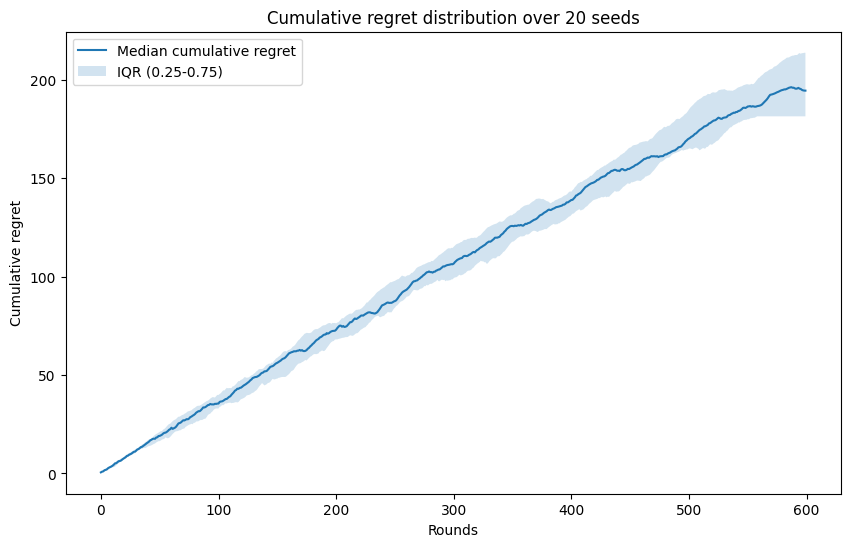

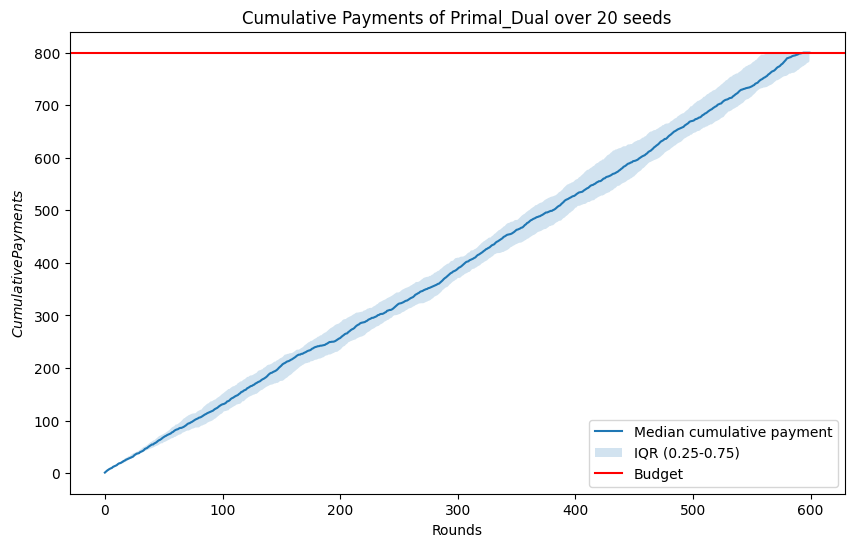

In [ ]:
run_one = 0
products = ['A','B','C']
budget = 800
T = 600
change_rounds = 30
seeds = [10123, 47281, 39502, 86734, 19285, 55012, 73190, 28461, 61027, 90834,
         45712, 67209, 31845, 82650, 14029, 59384, 71203, 40917, 28495, 63721]

fixed_prices = 0
if fixed_prices:
  K=10
  prices_per_product = np.linspace(0.01, 1, K)
else:
  epsilon = T ** (-0.33)
  K = int(1 / epsilon)
  prices_per_product = np.linspace(0.01, 1, K)    

print(f'Discretizing prices with {K} values')
print(prices_per_product)
prices = {p: prices_per_product for p in products}
print(prices)

means = np.array([0.2, 0.5, 0.7])
covs = 0.01*np.array([[1., 0.3, 0.1],
                       [0.3, 1., 0.5],
                       [0.1, 0.5, 1]])

eta = T**(-0.6)
if run_one:
    utilities, _, _, clairv_util, fixed_hind_clair, history = run_single_trial_viz(0, products, prices, prices_per_product, budget, T, eta, K, means, covs, change_rounds, seed=89, n_viz_rounds=T)

    cum_utilities = np.cumsum(utilities)
    cum_clairv = np.cumsum(clairv_util)
    cum_clairv_fixed_hind = np.cumsum(fixed_hind_clair)

    avg_regret = cum_clairv - cum_utilities
    avg_regret_fixed_hind = cum_clairv_fixed_hind - cum_utilities

    plt.figure(figsize=(10,6))
    plt.plot(avg_regret, label='Average Cumulative Regret')
    plt.plot(avg_regret_fixed_hind, label='Average Cumulative Regret (Fixed, Hindsight)')
    plt.xlabel('Rounds')
    plt.ylabel('Cumulative Regret')
    plt.title('Average Regret vs Oracle over Multiple Trials')
    plt.legend()
    plt.show()

else:
    all_regrets, all_payments = run_all_trials_parallel(
    seeds, products, prices, prices_per_product, budget, T, eta, K, means, covs, change_rounds, n_jobs=-1
    )
    all_regrets = np.array([np.pad(r, (0, T-len(r)), 'edge') for r in all_regrets])
    # Computes quantiles across trials for regret analysis
    lq_regret, median_regret, hq_regret = np.quantile(all_regrets, q=[0.25, 0.5, 0.75], axis=0)
    all_payments = np.array([np.pad(r, (0, T-len(r)), 'edge') for r in all_payments])
    # Computes quantiles across trials for regret analysis
    lq_payments, median_payments, hq_payments = np.quantile(all_payments, q=[0.25, 0.5, 0.75], axis=0)

    # Plot cumulative regret
    plt.figure(figsize=(10,6))
    plt.plot(median_regret, label='Median cumulative regret')
    # Plot interquartile range 
    plt.fill_between(range(T), lq_regret, hq_regret, alpha=0.2, label='IQR (0.25-0.75)')
    plt.xlabel('Rounds')
    plt.ylabel('Cumulative regret')
    plt.title(f'Cumulative regret distribution over {len(seeds)} seeds')
    plt.legend()
    plt.show()

    plt.figure(figsize=(10,6))
    plt.plot(median_payments, label='Median cumulative payment')
    # Plot interquartile range 
    plt.fill_between(range(T), lq_payments, hq_payments, alpha=0.2, label='IQR (0.25-0.75)')
    plt.xlabel('Rounds')
    plt.ylabel('$Cumulative Payments$')
    plt.axhline(budget, color='red', label='Budget')
    plt.legend()
    plt.title(f'Cumulative Payments of Primal_Dual over {len(seeds)} seeds')
    plt.show()


Discretizing prices with 8 values
[0.01       0.15142857 0.29285714 0.43428571 0.57571429 0.71714286
 0.85857143 1.        ]
{'A': array([0.01      , 0.15142857, 0.29285714, 0.43428571, 0.57571429,
       0.71714286, 0.85857143, 1.        ]), 'B': array([0.01      , 0.15142857, 0.29285714, 0.43428571, 0.57571429,
       0.71714286, 0.85857143, 1.        ]), 'C': array([0.01      , 0.15142857, 0.29285714, 0.43428571, 0.57571429,
       0.71714286, 0.85857143, 1.        ])}


Trial 1:   0%|          | 0/600 [00:00<?, ?it/s]

















Trial 1:  20%|██        | 120/600 [00:00<00:00, 801.20it/s]
































Trial 1:  34%|███▎      | 201/600 [00:00<00:00, 542.74it/s]













Trial 1:  43%|████▎     | 258/600 [00:00<00:00, 511.71it/s]




















Trial 1:  52%|█████▏    | 310/600 [00:00<00:00, 498.33it/s]















Trial 1:  61%|██████    | 366/600 [00:00<00:00, 499.75it/s]


















Trial 1:  70%|███████   | 421/600 [00:00<00:00, 451.56it/s]




















Trial 1:  78%|███████▊  | 467/600 [00:00<00:00, 435.31it/s]



























Trial 1:  85%|████████▌ | 511/600 [00:01<00:00, 260.59it/s]




















                                                           







































































































































































































































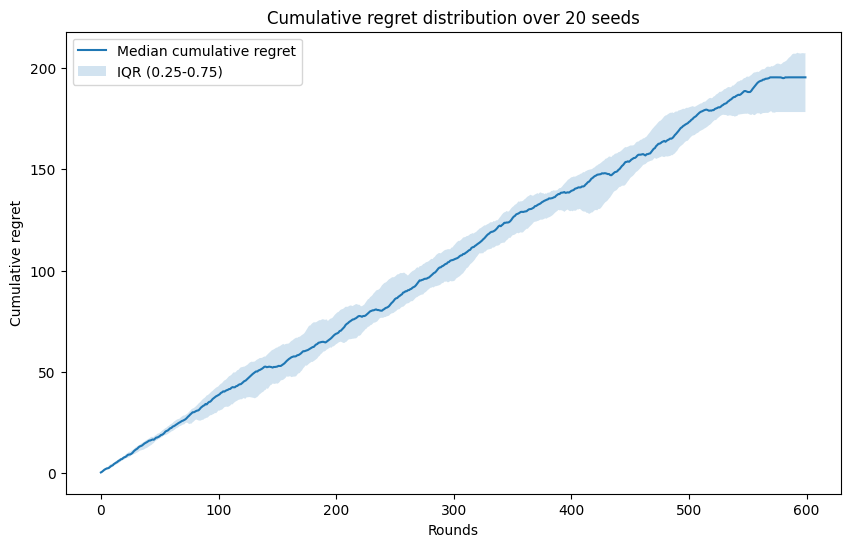

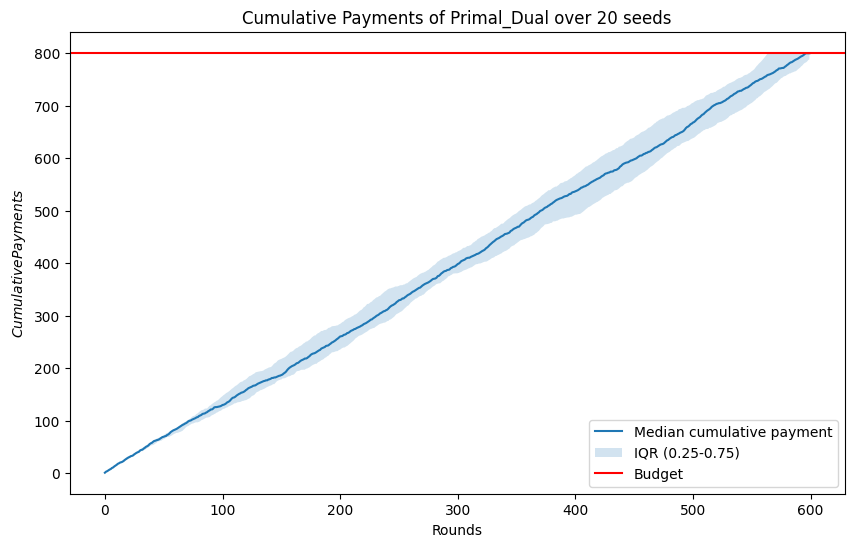

In [ ]:
run_one = 0
products = ['A','B','C']
budget = 800
T = 600
change_rounds = 60
seeds = [10123, 47281, 39502, 86734, 19285, 55012, 73190, 28461, 61027, 90834,
         45712, 67209, 31845, 82650, 14029, 59384, 71203, 40917, 28495, 63721]

fixed_prices = 0
if fixed_prices:
  K=10
  prices_per_product = np.linspace(0.01, 1, K)
else:
  epsilon = T ** (-0.33)
  K = int(1 / epsilon)
  prices_per_product = np.linspace(0.01, 1, K)    

print(f'Discretizing prices with {K} values')
print(prices_per_product)
prices = {p: prices_per_product for p in products}
print(prices)

means = np.array([0.2, 0.5, 0.7])
covs = 0.01*np.array([[1., 0.3, 0.1],
                       [0.3, 1., 0.5],
                       [0.1, 0.5, 1]])

eta = T**(-0.6)
if run_one:
    utilities, _, _, clairv_util, fixed_hind_clair, history = run_single_trial_viz(0, products, prices, prices_per_product, budget, T, eta, K, means, covs, change_rounds, seed=89, n_viz_rounds=T)

    cum_utilities = np.cumsum(utilities)
    cum_clairv = np.cumsum(clairv_util)
    cum_clairv_fixed_hind = np.cumsum(fixed_hind_clair)

    avg_regret = cum_clairv - cum_utilities
    avg_regret_fixed_hind = cum_clairv_fixed_hind - cum_utilities

    plt.figure(figsize=(10,6))
    plt.plot(avg_regret, label='Average Cumulative Regret')
    plt.plot(avg_regret_fixed_hind, label='Average Cumulative Regret (Fixed, Hindsight)')
    plt.xlabel('Rounds')
    plt.ylabel('Cumulative Regret')
    plt.title('Average Regret vs Oracle over Multiple Trials')
    plt.legend()
    plt.show()

else:
    all_regrets, all_payments = run_all_trials_parallel(
    seeds, products, prices, prices_per_product, budget, T, eta, K, means, covs, change_rounds, n_jobs=-1
    )
    all_regrets = np.array([np.pad(r, (0, T-len(r)), 'edge') for r in all_regrets])
    # Computes quantiles across trials for regret analysis
    lq_regret, median_regret, hq_regret = np.quantile(all_regrets, q=[0.25, 0.5, 0.75], axis=0)
    all_payments = np.array([np.pad(r, (0, T-len(r)), 'edge') for r in all_payments])
    # Computes quantiles across trials for regret analysis
    lq_payments, median_payments, hq_payments = np.quantile(all_payments, q=[0.25, 0.5, 0.75], axis=0)


    # Plot cumulative regret
    plt.figure(figsize=(10,6))
    plt.plot(median_regret, label='Median cumulative regret')
    # Plot interquartile range 
    plt.fill_between(range(T), lq_regret, hq_regret, alpha=0.2, label='IQR (0.25-0.75)')
    plt.xlabel('Rounds')
    plt.ylabel('Cumulative regret')
    plt.title(f'Cumulative regret distribution over {len(seeds)} seeds')
    plt.legend()
    plt.show()

    plt.figure(figsize=(10,6))
    plt.plot(median_payments, label='Median cumulative payment')
    # Plot interquartile range 
    plt.fill_between(range(T), lq_payments, hq_payments, alpha=0.2, label='IQR (0.25-0.75)')
    plt.xlabel('Rounds')
    plt.ylabel('$Cumulative Payments$')
    plt.axhline(budget, color='red', label='Budget')
    plt.legend()
    plt.title(f'Cumulative Payments of Primal_Dual over {len(seeds)} seeds')
    plt.show()

Discretizing prices with 8 values
[0.01       0.15142857 0.29285714 0.43428571 0.57571429 0.71714286
 0.85857143 1.        ]
{'A': array([0.01      , 0.15142857, 0.29285714, 0.43428571, 0.57571429,
       0.71714286, 0.85857143, 1.        ]), 'B': array([0.01      , 0.15142857, 0.29285714, 0.43428571, 0.57571429,
       0.71714286, 0.85857143, 1.        ]), 'C': array([0.01      , 0.15142857, 0.29285714, 0.43428571, 0.57571429,
       0.71714286, 0.85857143, 1.        ])}


Trial 1:   0%|          | 0/600 [00:00<?, ?it/s]









Trial 1:  13%|█▎        | 77/600 [00:00<00:00, 763.69it/s]





























Trial 1:  26%|██▌       | 154/600 [00:00<00:00, 494.04it/s]






















Trial 1:  35%|███▍      | 209/600 [00:00<00:01, 375.53it/s]














Trial 1:  42%|████▏     | 252/600 [00:00<00:00, 372.93it/s]














Trial 1:  49%|████▊     | 292/600 [00:00<00:01, 228.35it/s]














Trial 1:  54%|█████▎    | 322/600 [00:01<00:01, 241.33it/s]




















Trial 1:  59%|█████▊    | 352/600 [00:01<00:01, 244.40it/s]




















Trial 1:  64%|██████▍   | 383/600 [00:01<00:00, 258.46it/s]









































Trial 1:  69%|██████▉   | 413/600 [00:01<00:00, 208.99it/s]
















Trial 1:  73%|███████▎  | 438/600 [00:01<00:00, 214.20it/s]





Trial 1:  78%|███████▊  | 470/600 [00:01<00:00, 236.45it/s]




















Trial 1:  94%|█████████▍| 567/600 [00:01<00:00, 416.49it/s]










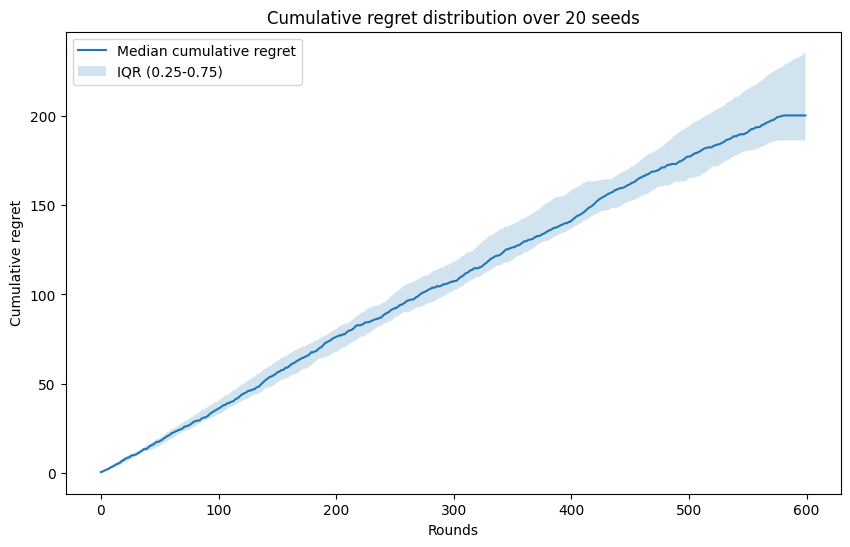

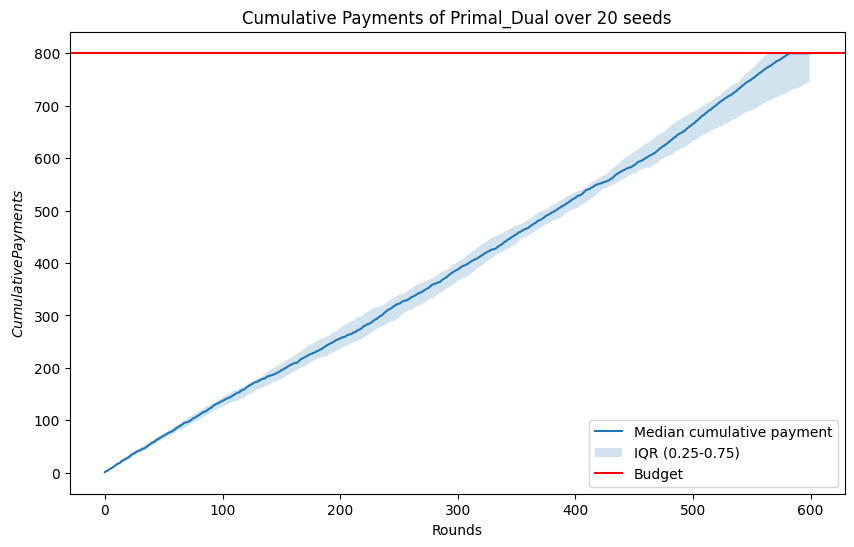

In [ ]:
run_one = 0
products = ['A','B','C']
budget = 800
T = 600
change_rounds = 400
seeds = [10123, 47281, 39502, 86734, 19285, 55012, 73190, 28461, 61027, 90834,
         45712, 67209, 31845, 82650, 14029, 59384, 71203, 40917, 28495, 63721]

fixed_prices = 0
if fixed_prices:
  K=10
  prices_per_product = np.linspace(0.01, 1, K)
else:
  epsilon = T ** (-0.33)
  K = int(1 / epsilon)
  prices_per_product = np.linspace(0.01, 1, K)    

print(f'Discretizing prices with {K} values')
print(prices_per_product)
prices = {p: prices_per_product for p in products}
print(prices)

means = np.array([0.2, 0.5, 0.7])
covs = 0.01*np.array([[1., 0.3, 0.1],
                       [0.3, 1., 0.5],
                       [0.1, 0.5, 1]])

eta = T**(-0.6)
if run_one:
    utilities, _, _, clairv_util, fixed_hind_clair, history = run_single_trial_viz(0, products, prices, prices_per_product, budget, T, eta, K, means, covs, change_rounds, seed=89, n_viz_rounds=T)

    cum_utilities = np.cumsum(utilities)
    cum_clairv = np.cumsum(clairv_util)
    cum_clairv_fixed_hind = np.cumsum(fixed_hind_clair)

    avg_regret = cum_clairv - cum_utilities
    avg_regret_fixed_hind = cum_clairv_fixed_hind - cum_utilities

    plt.figure(figsize=(10,6))
    plt.plot(avg_regret, label='Average Cumulative Regret')
    plt.plot(avg_regret_fixed_hind, label='Average Cumulative Regret (Fixed, Hindsight)')
    plt.xlabel('Rounds')
    plt.ylabel('Cumulative Regret')
    plt.title('Average Regret vs Oracle over Multiple Trials')
    plt.legend()
    plt.show()

else:
    all_regrets, all_payments = run_all_trials_parallel(
    seeds, products, prices, prices_per_product, budget, T, eta, K, means, covs, change_rounds, n_jobs=-1
    )
    all_regrets = np.array([np.pad(r, (0, T-len(r)), 'edge') for r in all_regrets])
    # Computes quantiles across trials for regret analysis
    lq_regret, median_regret, hq_regret = np.quantile(all_regrets, q=[0.25, 0.5, 0.75], axis=0)

    all_payments = np.array([np.pad(r, (0, T-len(r)), 'edge') for r in all_payments])
    # Computes quantiles across trials for regret analysis
    lq_payments, median_payments, hq_payments = np.quantile(all_payments, q=[0.25, 0.5, 0.75], axis=0)


    # Plot cumulative regret
    plt.figure(figsize=(10,6))
    plt.plot(median_regret, label='Median cumulative regret')
    # Plot interquartile range 
    plt.fill_between(range(T), lq_regret, hq_regret, alpha=0.2, label='IQR (0.25-0.75)')
    plt.xlabel('Rounds')
    plt.ylabel('Cumulative regret')
    plt.title(f'Cumulative regret distribution over {len(seeds)} seeds')
    plt.legend()
    plt.show()

    plt.figure(figsize=(10,6))
    plt.plot(median_payments, label='Median cumulative payment')
    # Plot interquartile range 
    plt.fill_between(range(T), lq_payments, hq_payments, alpha=0.2, label='IQR (0.25-0.75)')
    plt.xlabel('Rounds')
    plt.ylabel('$Cumulative Payments$')
    plt.axhline(budget, color='red', label='Budget')
    plt.legend()
    plt.title(f'Cumulative Payments of Primal_Dual over {len(seeds)} seeds')
    plt.show()

Discretizing prices with 8 values
[0.01       0.15142857 0.29285714 0.43428571 0.57571429 0.71714286
 0.85857143 1.        ]
{'A': array([0.01      , 0.15142857, 0.29285714, 0.43428571, 0.57571429,
       0.71714286, 0.85857143, 1.        ]), 'B': array([0.01      , 0.15142857, 0.29285714, 0.43428571, 0.57571429,
       0.71714286, 0.85857143, 1.        ]), 'C': array([0.01      , 0.15142857, 0.29285714, 0.43428571, 0.57571429,
       0.71714286, 0.85857143, 1.        ])}


Trial 1:   0%|          | 0/600 [00:00<?, ?it/s]














Trial 1:   3%|▎         | 20/600 [00:00<00:03, 172.78it/s]

























Trial 1:   6%|▋         | 38/600 [00:00<00:05, 99.34it/s] 

































Trial 1:   8%|▊         | 50/600 [00:00<00:07, 75.42it/s]


























Trial 1:  10%|▉         | 59/600 [00:00<00:11, 49.06it/s]




















Trial 1:  14%|█▎        | 81/600 [00:01<00:06, 78.74it/s]




























Trial 1:  16%|█▌        | 93/600 [00:01<00:06, 75.73it/s]






















Trial 1:  17%|█▋        | 104/600 [00:01<00:06, 79.39it/s]


















Trial 1:  19%|█▉        | 115/600 [00:01<00:05, 84.39it/s]



















Trial 1:  21%|██        | 125/600 [00:01<00:05, 82.26it/s]














Trial 1:  22%|██▎       | 135/600 [00:01<00:05, 86.12it/s]



































Trial 1:  24%|██▍       | 145/600 [00:01<00:05, 79.23it/s]
















Trial 1:  26%|██▌       | 154/600 [0

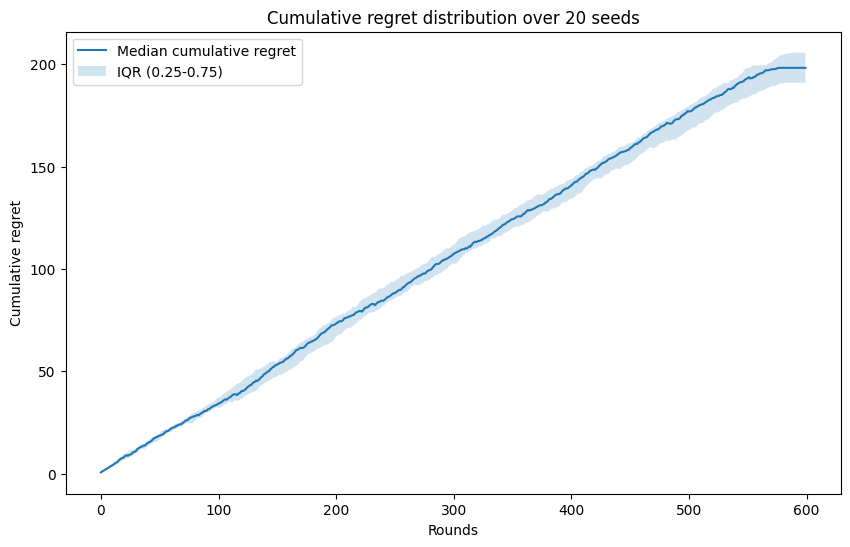

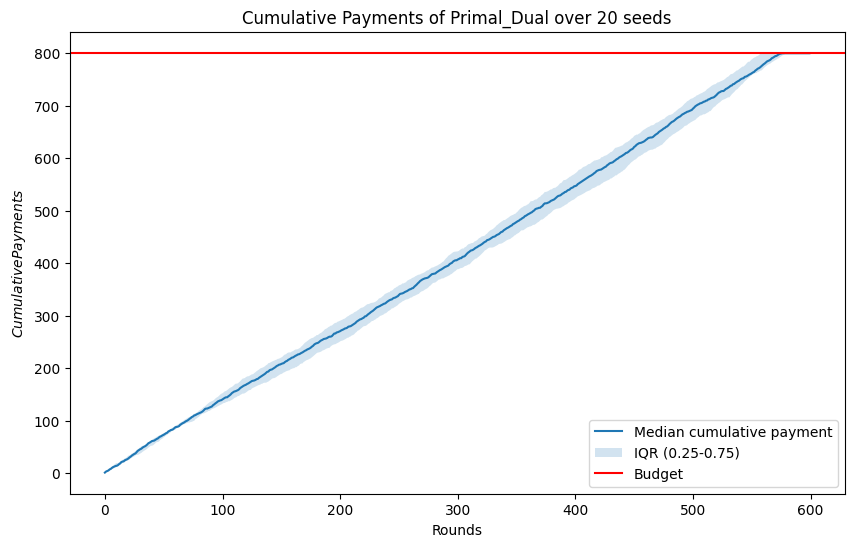

In [ ]:
run_one = 0
products = ['A','B','C']
budget = 800
T = 600
change_rounds = 3
seeds = [10123, 47281, 39502, 86734, 19285, 55012, 73190, 28461, 61027, 90834,
         45712, 67209, 31845, 82650, 14029, 59384, 71203, 40917, 28495, 63721]

fixed_prices = 0
if fixed_prices:
  K=10
  prices_per_product = np.linspace(0.01, 1, K)
else:
  epsilon = T ** (-0.33)
  K = int(1 / epsilon)
  prices_per_product = np.linspace(0.01, 1, K)    

print(f'Discretizing prices with {K} values')
print(prices_per_product)
prices = {p: prices_per_product for p in products}
print(prices)

means = np.array([0.2, 0.5, 0.7])
covs = 0.01*np.array([[1., 0.3, 0.1],
                       [0.3, 1., 0.5],
                       [0.1, 0.5, 1]])

eta = T**(-0.6)
if run_one:
    utilities, _, _, clairv_util, fixed_hind_clair, history = run_single_trial_viz(0, products, prices, prices_per_product, budget, T, eta, K, means, covs, change_rounds, seed=89, n_viz_rounds=T)

    cum_utilities = np.cumsum(utilities)
    cum_clairv = np.cumsum(clairv_util)
    cum_clairv_fixed_hind = np.cumsum(fixed_hind_clair)

    avg_regret = cum_clairv - cum_utilities
    avg_regret_fixed_hind = cum_clairv_fixed_hind - cum_utilities

    plt.figure(figsize=(10,6))
    plt.plot(avg_regret, label='Average Cumulative Regret')
    plt.plot(avg_regret_fixed_hind, label='Average Cumulative Regret (Fixed, Hindsight)')
    plt.xlabel('Rounds')
    plt.ylabel('Cumulative Regret')
    plt.title('Average Regret vs Oracle over Multiple Trials')
    plt.legend()
    plt.show()

else:
    all_regrets, all_payments = run_all_trials_parallel(
    seeds, products, prices, prices_per_product, budget, T, eta, K, means, covs, change_rounds, n_jobs=-1
    )
    all_regrets = np.array([np.pad(r, (0, T-len(r)), 'edge') for r in all_regrets])
    # Computes quantiles across trials for regret analysis
    lq_regret, median_regret, hq_regret = np.quantile(all_regrets, q=[0.25, 0.5, 0.75], axis=0)
    all_payments = np.array([np.pad(r, (0, T-len(r)), 'edge') for r in all_payments])
    # Computes quantiles across trials for regret analysis
    lq_payments, median_payments, hq_payments = np.quantile(all_payments, q=[0.25, 0.5, 0.75], axis=0)


    # Plot cumulative regret
    plt.figure(figsize=(10,6))
    plt.plot(median_regret, label='Median cumulative regret')
    # Plot interquartile range 
    plt.fill_between(range(T), lq_regret, hq_regret, alpha=0.2, label='IQR (0.25-0.75)')
    plt.xlabel('Rounds')
    plt.ylabel('Cumulative regret')
    plt.title(f'Cumulative regret distribution over {len(seeds)} seeds')
    plt.legend()
    plt.show()

    plt.figure(figsize=(10,6))
    plt.plot(median_payments, label='Median cumulative payment')
    # Plot interquartile range 
    plt.fill_between(range(T), lq_payments, hq_payments, alpha=0.2, label='IQR (0.25-0.75)')
    plt.xlabel('Rounds')
    plt.ylabel('$Cumulative Payments$')
    plt.axhline(budget, color='red', label='Budget')
    plt.legend()
    plt.title(f'Cumulative Payments of Primal_Dual over {len(seeds)} seeds')
    plt.show()

With B > T, the performances are not so good because, as we know from Requirement 4, the Primal-Dual Agent struggles with a $ \rho $ greater than 1, influencing the $ \lambda $ updates and so the Primal and the choice of prices.

### Comparison between the two Agents

#### Multiple trials B < T

##### Small intervals (highly non stationary)

In [ ]:
run_one = 0
products = ['A','B','C']
budget = 400
T = 600
change_rounds = 3
U_T = int(T/change_rounds)
window = int(2*np.sqrt(T*np.log(T)/U_T))
#window = int(2*np.sqrt(np.log(T)))
seeds = [10123, 47281, 39502, 86734, 19285, 55012, 73190, 28461, 61027, 90834,
         45712, 67209, 31845, 82650, 14029, 59384, 71203, 40917, 28495, 63721]

fixed_prices = 0

if fixed_prices:
  K=10
  prices_per_product = np.linspace(0.01, 1, K)    
else:
  epsilon = T ** (-0.33)
  K = int(1 / epsilon)
  prices_per_product = np.linspace(0.01, 1, K)    

print(f'Discretizing prices with {K} values')
print(prices_per_product)
prices = {p: prices_per_product for p in products}
print(prices)

means = np.array([0.2, 0.5, 0.7])
covs = 0.01*np.array([[1., 0.3, 0.1],
                       [0.3, 1., 0.5],
                       [0.1, 0.5, 1]])

eta = T**(-0.6)
if run_one:
    utilities, _, _, clairv_util, fixed_hind_clair, _ = run_single_trial_combgp(0, products, prices, prices_per_product, budget, T, change_rounds, window, means, covs, seed=89)

    cum_utilities = np.cumsum(utilities)
    cum_clairv = np.cumsum(clairv_util)
    cum_clairv_fixed_hind = np.cumsum(fixed_hind_clair)

    avg_regret = cum_clairv - cum_utilities
    # avg_regret_fixed_hind = cum_clairv_fixed_hind - cum_utilities

    plt.figure(figsize=(10,6))
    plt.plot(avg_regret, label='Average Cumulative Regret')
    #plt.plot(avg_regret_fixed_hind, label='Average Cumulative Regret (Fixed, Hindsight)')
    plt.xlabel('Rounds')
    plt.ylabel('Cumulative Regret')
    plt.title('Average Regret vs Oracle over Multiple Trials')
    plt.legend()
    plt.show()

else:
    all_regrets_combgp, all_payments_combgp = run_all_trials_parallel_combgp(
    seeds, products, prices, prices_per_product, budget, T, change_rounds, window, means, covs, n_jobs=-1
    )
    all_regrets_combgp = np.array([np.pad(r, (0, T-len(r)), 'edge') for r in all_regrets_combgp])
    # Computes quantiles across trials for regret analysis
    lq_regret_combgp, median_regret_combgp, hq_regret_combgp = np.quantile(all_regrets_combgp, q=[0.25, 0.5, 0.75], axis=0)
    all_payments_combgp = np.array([np.pad(r, (0, T-len(r)), 'edge') for r in all_payments_combgp])
    lq_payments_combgp, median_payments_combgp, hq_payments_combgp = np.quantile(all_payments_combgp, q=[0.25, 0.5, 0.75], axis=0)

    all_regrets_pd, all_payments_pd = run_all_trials_parallel(
    seeds, products, prices, prices_per_product, budget, T, eta, K, means, covs, change_rounds, n_jobs=-1
    )
    all_regrets_pd = np.array([np.pad(r, (0, T-len(r)), 'edge') for r in all_regrets_pd])
    # Computes quantiles across trials for regret analysis
    lq_regret_pd, median_regret_pd, hq_regret_pd = np.quantile(all_regrets_pd, q=[0.25, 0.5, 0.75], axis=0)
    all_payments_pd = np.array([np.pad(r, (0, T-len(r)), 'edge') for r in all_payments_pd])
    lq_payments_pd, median_payments_pd, hq_payments_pd = np.quantile(all_payments_pd, q=[0.25, 0.5, 0.75], axis=0)

Discretizing prices with 8 values
[0.01       0.15142857 0.29285714 0.43428571 0.57571429 0.71714286
 0.85857143 1.        ]
{'A': array([0.01      , 0.15142857, 0.29285714, 0.43428571, 0.57571429,
       0.71714286, 0.85857143, 1.        ]), 'B': array([0.01      , 0.15142857, 0.29285714, 0.43428571, 0.57571429,
       0.71714286, 0.85857143, 1.        ]), 'C': array([0.01      , 0.15142857, 0.29285714, 0.43428571, 0.57571429,
       0.71714286, 0.85857143, 1.        ])}


Trial 1:   0%|          | 0/600 [00:00<?, ?it/s]


Trial 1:   1%|          | 5/600 [00:00<00:13, 44.51it/s]







Trial 1:   2%|▏         | 10/600 [00:00<00:13, 44.68it/s]













Trial 1:   2%|▎         | 15/600 [00:00<00:13, 44.89it/s]


















Trial 1:   3%|▎         | 20/600 [00:00<00:14, 40.79it/s]















Trial 1:   4%|▍         | 25/600 [00:00<00:13, 42.06it/s]


















Trial 1:   5%|▌         | 30/600 [00:00<00:13, 42.19it/s]














Trial 1:   6%|▌         | 35/600 [00:00<00:13, 42.53it/s]

















Trial 1:   7%|▋         | 40/600 [00:00<00:14, 37.91it/s]


















Trial 1:   7%|▋         | 44/600 [00:01<00:14, 38.04it/s]


















Trial 1:   8%|▊         | 49/600 [00:01<00:13, 39.87it/s]


















Trial 1:   9%|▉         | 54/600 [00:01<00:13, 41.58it/s]


















Trial 1:  10%|▉         | 59/600 [00:01<00:13, 41.39it/s]


















Trial 1:  11%|█         | 64/600 [00:01<00:13, 38.69it/s]






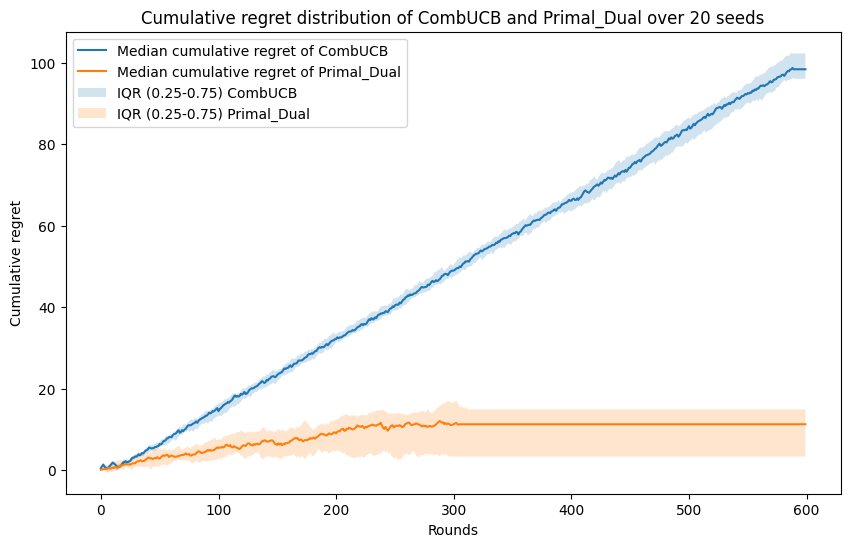

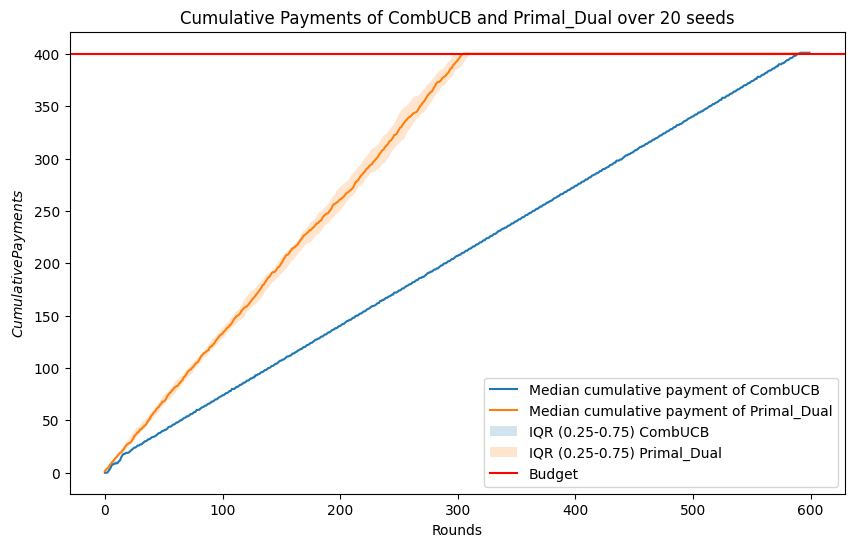

In [295]:
# Plot cumulative regret
plt.figure(figsize=(10,6))
plt.plot(median_regret_combgp, label='Median cumulative regret of CombUCB')
plt.plot(median_regret_pd, label='Median cumulative regret of Primal_Dual')
# Plot interquartile range 
plt.fill_between(range(T), lq_regret_combgp, hq_regret_combgp, alpha=0.2, label='IQR (0.25-0.75) CombUCB')
plt.fill_between(range(T), lq_regret_pd, hq_regret_pd, alpha=0.2, label='IQR (0.25-0.75) Primal_Dual')
plt.xlabel('Rounds')
plt.ylabel('Cumulative regret')
plt.title(f'Cumulative regret distribution of CombUCB and Primal_Dual over {len(seeds)} seeds')
plt.legend()
plt.show()

plt.figure(figsize=(10,6))
plt.plot(median_payments_combgp, label='Median cumulative payment of CombUCB')
plt.plot(median_payments_pd, label='Median cumulative payment of Primal_Dual')
# Plot interquartile range 
plt.fill_between(range(T), lq_payments_combgp, hq_payments_combgp, alpha=0.2, label='IQR (0.25-0.75) CombUCB')
plt.fill_between(range(T), lq_payments_pd, hq_payments_pd, alpha=0.2, label='IQR (0.25-0.75) Primal_Dual')
plt.xlabel('Rounds')
plt.ylabel('$Cumulative Payments$')
plt.axhline(budget, color='red', label='Budget')
plt.legend()
plt.title(f'Cumulative Payments of CombUCB and Primal_Dual over {len(seeds)} seeds')
plt.show()

When the environment is almost highly non stationary, so a lot of intervals, the Primal-Dual outperforms the CombUCB with GP and SW agent, as expected, being the Primal-Dual agent designed to work well with highly non stationary environments.

##### Intermediate intervals

In [ ]:
run_one = 0
products = ['A','B','C']
budget = 400
T = 600
change_rounds = 30
U_T = int(T/change_rounds)
window = int(2*np.sqrt(T*np.log(T)/U_T))
#window = int(2*np.sqrt(np.log(T)))
seeds = [10123, 47281, 39502, 86734, 19285, 55012, 73190, 28461, 61027, 90834,
         45712, 67209, 31845, 82650, 14029, 59384, 71203, 40917, 28495, 63721]

fixed_prices = 0
if fixed_prices:
  K=10
  prices_per_product = np.linspace(0.01, 1, K)    
else:
  epsilon = T ** (-0.33)
  K = int(1 / epsilon)
  prices_per_product = np.linspace(0.01, 1, K)    

print(f'Discretizing prices with {K} values')
print(prices_per_product)
prices = {p: prices_per_product for p in products}
print(prices)

means = np.array([0.2, 0.5, 0.7])
covs = 0.01*np.array([[1., 0.3, 0.1],
                       [0.3, 1., 0.5],
                       [0.1, 0.5, 1]])

eta = T**(-0.6)
if run_one:
    utilities, _, _, clairv_util, fixed_hind_clair, _ = run_single_trial_combgp(0, products, prices, prices_per_product, budget, T, change_rounds, window, means, covs, seed=89)

    cum_utilities = np.cumsum(utilities)
    cum_clairv = np.cumsum(clairv_util)
    cum_clairv_fixed_hind = np.cumsum(fixed_hind_clair)

    avg_regret = cum_clairv - cum_utilities
    # avg_regret_fixed_hind = cum_clairv_fixed_hind - cum_utilities

    plt.figure(figsize=(10,6))
    plt.plot(avg_regret, label='Average Cumulative Regret')
    #plt.plot(avg_regret_fixed_hind, label='Average Cumulative Regret (Fixed, Hindsight)')
    plt.xlabel('Rounds')
    plt.ylabel('Cumulative Regret')
    plt.title('Average Regret vs Oracle over Multiple Trials')
    plt.legend()
    plt.show()

else:
    all_regrets_combgp, all_payments_combgp = run_all_trials_parallel_combgp(
    seeds, products, prices, prices_per_product, budget, T, change_rounds, window, means, covs, n_jobs=-1
    )
    all_regrets_combgp = np.array([np.pad(r, (0, T-len(r)), 'edge') for r in all_regrets_combgp])
    # Computes quantiles across trials for regret analysis
    lq_regret_combgp, median_regret_combgp, hq_regret_combgp = np.quantile(all_regrets_combgp, q=[0.25, 0.5, 0.75], axis=0)
    all_payments_combgp = np.array([np.pad(r, (0, T-len(r)), 'edge') for r in all_payments_combgp])
    lq_payments_combgp, median_payments_combgp, hq_payments_combgp = np.quantile(all_payments_combgp, q=[0.25, 0.5, 0.75], axis=0)

    all_regrets_pd, all_payments_pd = run_all_trials_parallel(
    seeds, products, prices, prices_per_product, budget, T, eta, K, means, covs, change_rounds, n_jobs=-1
    )
    all_regrets_pd = np.array([np.pad(r, (0, T-len(r)), 'edge') for r in all_regrets_pd])
    # Computes quantiles across trials for regret analysis
    lq_regret_pd, median_regret_pd, hq_regret_pd = np.quantile(all_regrets_pd, q=[0.25, 0.5, 0.75], axis=0)
    all_payments_pd = np.array([np.pad(r, (0, T-len(r)), 'edge') for r in all_payments_pd])
    lq_payments_pd, median_payments_pd, hq_payments_pd = np.quantile(all_payments_pd, q=[0.25, 0.5, 0.75], axis=0)

Discretizing prices with 8 values
[0.01       0.15142857 0.29285714 0.43428571 0.57571429 0.71714286
 0.85857143 1.        ]
{'A': array([0.01      , 0.15142857, 0.29285714, 0.43428571, 0.57571429,
       0.71714286, 0.85857143, 1.        ]), 'B': array([0.01      , 0.15142857, 0.29285714, 0.43428571, 0.57571429,
       0.71714286, 0.85857143, 1.        ]), 'C': array([0.01      , 0.15142857, 0.29285714, 0.43428571, 0.57571429,
       0.71714286, 0.85857143, 1.        ])}


Trial 1:   0%|          | 0/600 [00:00<?, ?it/s]





Trial 1:   1%|          | 5/600 [00:00<00:11, 49.83it/s]




















Trial 1:   4%|▍         | 25/600 [00:00<00:04, 129.65it/s]

























Trial 1:   6%|▋         | 38/600 [00:00<00:06, 84.47it/s] 














Trial 1:   8%|▊         | 48/600 [00:00<00:07, 72.82it/s]















Trial 1:  10%|▉         | 57/600 [00:00<00:07, 72.17it/s]




























Trial 1:  11%|█         | 65/600 [00:00<00:08, 64.63it/s]







Trial 1:  12%|█▏        | 74/600 [00:01<00:07, 69.03it/s]




















Trial 1:  14%|█▍        | 83/600 [00:01<00:07, 71.83it/s]





























Trial 1:  15%|█▌        | 91/600 [00:01<00:07, 67.77it/s]




















Trial 1:  16%|█▋        | 98/600 [00:01<00:07, 64.57it/s]











Trial 1:  18%|█▊        | 105/600 [00:01<00:07, 63.99it/s]




















Trial 1:  19%|█▉        | 113/600 [00:01<00:08, 57.26it/s]





























Trial 1: 

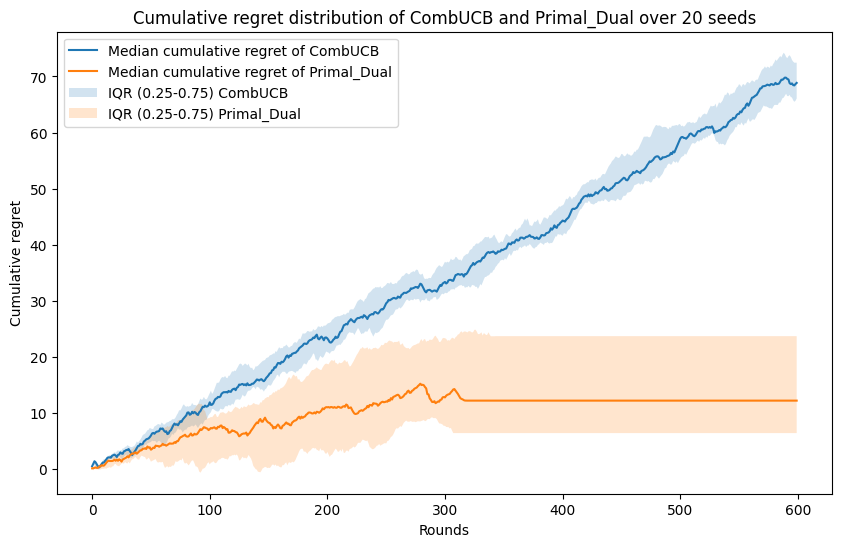

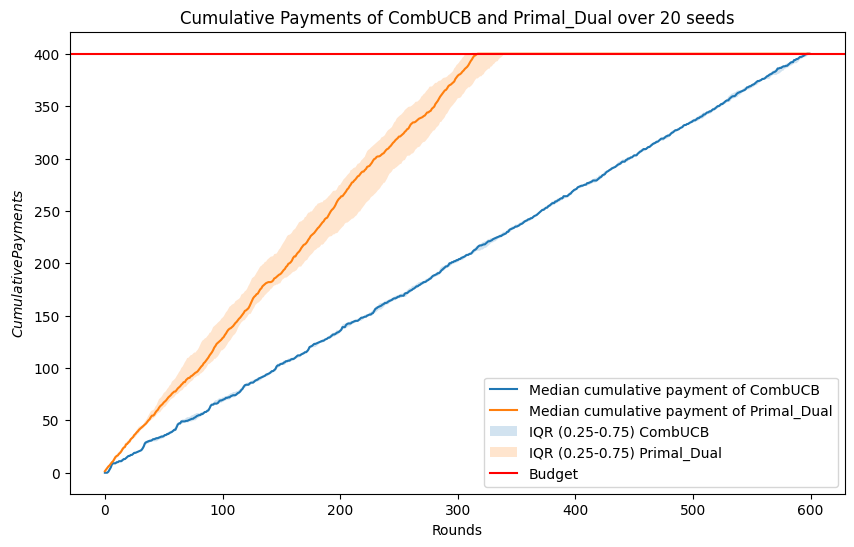

In [297]:
# Plot cumulative regret
plt.figure(figsize=(10,6))
plt.plot(median_regret_combgp, label='Median cumulative regret of CombUCB')
plt.plot(median_regret_pd, label='Median cumulative regret of Primal_Dual')
# Plot interquartile range 
plt.fill_between(range(T), lq_regret_combgp, hq_regret_combgp, alpha=0.2, label='IQR (0.25-0.75) CombUCB')
plt.fill_between(range(T), lq_regret_pd, hq_regret_pd, alpha=0.2, label='IQR (0.25-0.75) Primal_Dual')
plt.xlabel('Rounds')
plt.ylabel('Cumulative regret')
plt.title(f'Cumulative regret distribution of CombUCB and Primal_Dual over {len(seeds)} seeds')
plt.legend()
plt.show()

plt.figure(figsize=(10,6))
plt.plot(median_payments_combgp, label='Median cumulative payment of CombUCB')
plt.plot(median_payments_pd, label='Median cumulative payment of Primal_Dual')
# Plot interquartile range 
plt.fill_between(range(T), lq_payments_combgp, hq_payments_combgp, alpha=0.2, label='IQR (0.25-0.75) CombUCB')
plt.fill_between(range(T), lq_payments_pd, hq_payments_pd, alpha=0.2, label='IQR (0.25-0.75) Primal_Dual')
plt.xlabel('Rounds')
plt.ylabel('$Cumulative Payments$')
plt.axhline(budget, color='red', label='Budget')
plt.legend()
plt.title(f'Cumulative Payments of CombUCB and Primal_Dual over {len(seeds)} seeds')
plt.show()

Reducing the number of intervals makes the performances of the CombUCB-GP-SW more comparable to the performances of the Primal-Dual, but still the last one is better.

##### Large intervals (almost stationary)

In [ ]:
run_one = 0
products = ['A','B','C']
budget = 400
T = 600
change_rounds = 200
U_T = int(T/change_rounds)
window = int(2*np.sqrt(T*np.log(T)/U_T))
#window = int(2*np.sqrt(np.log(T)))
seeds = [10123, 47281, 39502, 86734, 19285, 55012, 73190, 28461, 61027, 90834,
         45712, 67209, 31845, 82650, 14029, 59384, 71203, 40917, 28495, 63721]

fixed_prices = 0
if fixed_prices:
  K=10
  prices_per_product = np.linspace(0.01, 1, K)    
else:
  epsilon = T ** (-0.33)
  K = int(1 / epsilon)
  prices_per_product = np.linspace(0.01, 1, K)    

print(f'Discretizing prices with {K} values')
print(prices_per_product)
prices = {p: prices_per_product for p in products}
print(prices)

means = np.array([0.2, 0.5, 0.7])
covs = 0.01*np.array([[1., 0.3, 0.1],
                       [0.3, 1., 0.5],
                       [0.1, 0.5, 1]])

eta = T**(-0.6)
if run_one:
    utilities, _, _, clairv_util, fixed_hind_clair, _ = run_single_trial_combgp(0, products, prices, prices_per_product, budget, T, change_rounds, window, means, covs, seed=89)

    cum_utilities = np.cumsum(utilities)
    cum_clairv = np.cumsum(clairv_util)
    cum_clairv_fixed_hind = np.cumsum(fixed_hind_clair)

    avg_regret = cum_clairv - cum_utilities
    # avg_regret_fixed_hind = cum_clairv_fixed_hind - cum_utilities

    plt.figure(figsize=(10,6))
    plt.plot(avg_regret, label='Average Cumulative Regret')
    #plt.plot(avg_regret_fixed_hind, label='Average Cumulative Regret (Fixed, Hindsight)')
    plt.xlabel('Rounds')
    plt.ylabel('Cumulative Regret')
    plt.title('Average Regret vs Oracle over Multiple Trials')
    plt.legend()
    plt.show()

else:
    all_regrets_combgp, all_payments_combgp = run_all_trials_parallel_combgp(
    seeds, products, prices, prices_per_product, budget, T, change_rounds, window, means, covs, n_jobs=-1
    )
    all_regrets_combgp = np.array([np.pad(r, (0, T-len(r)), 'edge') for r in all_regrets_combgp])
    # Computes quantiles across trials for regret analysis
    lq_regret_combgp, median_regret_combgp, hq_regret_combgp = np.quantile(all_regrets_combgp, q=[0.25, 0.5, 0.75], axis=0)
    all_payments_combgp = np.array([np.pad(r, (0, T-len(r)), 'edge') for r in all_payments_combgp])
    lq_payments_combgp, median_payments_combgp, hq_payments_combgp = np.quantile(all_payments_combgp, q=[0.25, 0.5, 0.75], axis=0)

    all_regrets_pd, all_payments_pd = run_all_trials_parallel(
    seeds, products, prices, prices_per_product, budget, T, eta, K, means, covs, change_rounds, n_jobs=-1
    )
    all_regrets_pd = np.array([np.pad(r, (0, T-len(r)), 'edge') for r in all_regrets_pd])
    # Computes quantiles across trials for regret analysis
    lq_regret_pd, median_regret_pd, hq_regret_pd = np.quantile(all_regrets_pd, q=[0.25, 0.5, 0.75], axis=0)
    all_payments_pd = np.array([np.pad(r, (0, T-len(r)), 'edge') for r in all_payments_pd])
    lq_payments_pd, median_payments_pd, hq_payments_pd = np.quantile(all_payments_pd, q=[0.25, 0.5, 0.75], axis=0)

Discretizing prices with 8 values
[0.01       0.15142857 0.29285714 0.43428571 0.57571429 0.71714286
 0.85857143 1.        ]
{'A': array([0.01      , 0.15142857, 0.29285714, 0.43428571, 0.57571429,
       0.71714286, 0.85857143, 1.        ]), 'B': array([0.01      , 0.15142857, 0.29285714, 0.43428571, 0.57571429,
       0.71714286, 0.85857143, 1.        ]), 'C': array([0.01      , 0.15142857, 0.29285714, 0.43428571, 0.57571429,
       0.71714286, 0.85857143, 1.        ])}


Trial 1:   0%|          | 0/600 [00:00<?, ?it/s]















Trial 1:   2%|▏         | 14/600 [00:00<00:04, 120.22it/s]











































Trial 1:   4%|▍         | 27/600 [00:00<00:08, 69.33it/s] 

















Trial 1:   6%|▌         | 36/600 [00:00<00:07, 72.35it/s]






























Trial 1:   7%|▋         | 44/600 [00:00<00:08, 67.98it/s]





















Trial 1:   9%|▊         | 52/600 [00:00<00:08, 67.21it/s]






















Trial 1:  10%|▉         | 59/600 [00:00<00:09, 59.67it/s]















Trial 1:  11%|█         | 67/600 [00:00<00:08, 62.83it/s]


















Trial 1:  12%|█▏        | 74/600 [00:01<00:08, 62.25it/s]






















Trial 1:  14%|█▎        | 81/600 [00:01<00:08, 58.85it/s]




















Trial 1:  15%|█▍        | 88/600 [00:01<00:08, 57.20it/s]




















Trial 1:  16%|█▌        | 94/600 [00:01<00:08, 57.71it/s]


















Trial 1:  17%|█▋        | 100/600 [00:01<00:08, 58

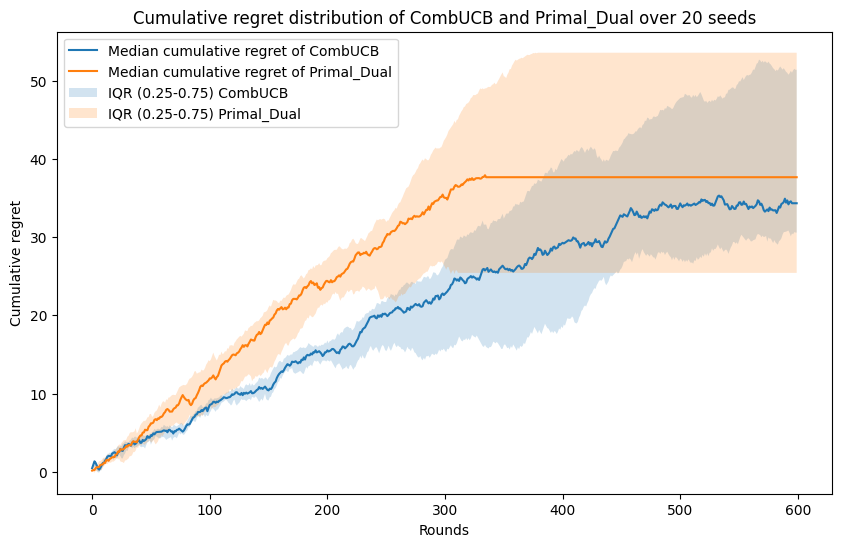

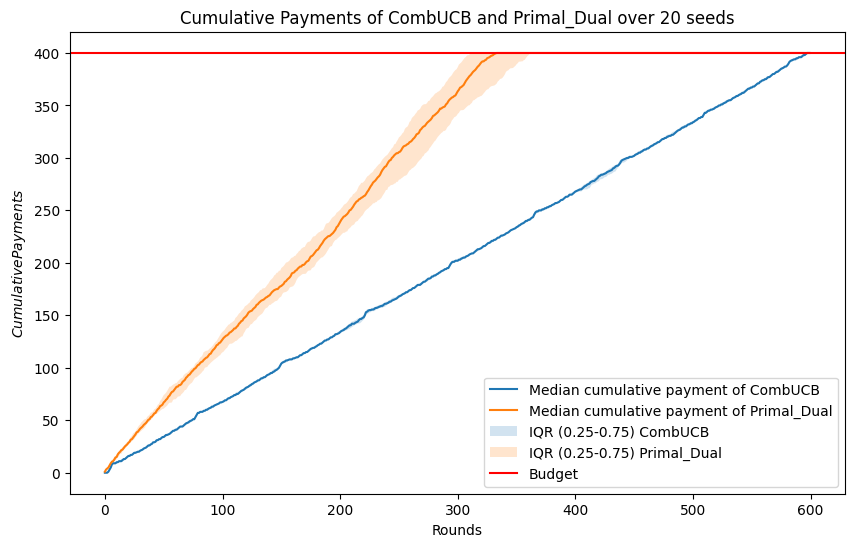

In [299]:
# Plot cumulative regret
plt.figure(figsize=(10,6))
plt.plot(median_regret_combgp, label='Median cumulative regret of CombUCB')
plt.plot(median_regret_pd, label='Median cumulative regret of Primal_Dual')
# Plot interquartile range 
plt.fill_between(range(T), lq_regret_combgp, hq_regret_combgp, alpha=0.2, label='IQR (0.25-0.75) CombUCB')
plt.fill_between(range(T), lq_regret_pd, hq_regret_pd, alpha=0.2, label='IQR (0.25-0.75) Primal_Dual')
plt.xlabel('Rounds')
plt.ylabel('Cumulative regret')
plt.title(f'Cumulative regret distribution of CombUCB and Primal_Dual over {len(seeds)} seeds')
plt.legend()
plt.show()

plt.figure(figsize=(10,6))
plt.plot(median_payments_combgp, label='Median cumulative payment of CombUCB')
plt.plot(median_payments_pd, label='Median cumulative payment of Primal_Dual')
# Plot interquartile range 
plt.fill_between(range(T), lq_payments_combgp, hq_payments_combgp, alpha=0.2, label='IQR (0.25-0.75) CombUCB')
plt.fill_between(range(T), lq_payments_pd, hq_payments_pd, alpha=0.2, label='IQR (0.25-0.75) Primal_Dual')
plt.xlabel('Rounds')
plt.ylabel('$Cumulative Payments$')
plt.axhline(budget, color='red', label='Budget')
plt.legend()
plt.title(f'Cumulative Payments of CombUCB and Primal_Dual over {len(seeds)} seeds')
plt.show()

Now, with very few intervals, so an almost stationary environment, the performances of CombUCB-GP-SW are better than those of the Primal-Dual, because the CombUCB-GP-SW is designed to work well in stationary environments and the sliding window helps it with almsot stationary environments.

#### Multiple Trials B = T

##### Small intervals (highly non stationary)

In [15]:
run_one = 0
products = ['A','B','C']
budget = 600
T = 600
change_rounds = 3
U_T = int(T/change_rounds)
window = int(2*np.sqrt(T*np.log(T)/U_T))
#window = int(2*np.sqrt(np.log(T)))
seeds = [10123, 47281, 39502, 86734, 19285, 55012, 73190, 28461, 61027, 90834,
         45712, 67209, 31845, 82650, 14029, 59384, 71203, 40917, 28495, 63721]

fixed_prices = 0

if fixed_prices:
  K=10
  prices_per_product = np.linspace(0.01, 1, K)    
  # prices_per_product = np.array([0, 0.05, 0.1, 0.15, 0.20, 0.25, 0.30, 0.35, 0.4, 0.45, 0.5, 0.55, 0.6, 0.65, 0.7, 0.75, 0.8, 0.85, 0.9, 0.95, 1.0])
else:
  epsilon = T ** (-0.33)
  K = int(1 / epsilon)
  prices_per_product = np.linspace(0.01, 1, K)    

print(f'Discretizing prices with {K} values')
print(prices_per_product)
prices = {p: prices_per_product for p in products}
print(prices)


means = np.array([0.2, 0.5, 0.7])
covs = 0.01*np.array([[1., 0.3, 0.1],
                       [0.3, 1., 0.5],
                       [0.1, 0.5, 1]])

# eta = T**(-0.5) 
eta = T**(-0.6)
if run_one:
    utilities, _, _, clairv_util, fixed_hind_clair, _ = run_single_trial_combgp(0, products, prices, prices_per_product, budget, T, change_rounds, window, means, covs, seed=89)

    cum_utilities = np.cumsum(utilities)
    cum_clairv = np.cumsum(clairv_util)
    cum_clairv_fixed_hind = np.cumsum(fixed_hind_clair)

    avg_regret = cum_clairv - cum_utilities
    # avg_regret_fixed_hind = cum_clairv_fixed_hind - cum_utilities

    plt.figure(figsize=(10,6))
    plt.plot(avg_regret, label='Average Cumulative Regret')
    #plt.plot(avg_regret_fixed_hind, label='Average Cumulative Regret (Fixed, Hindsight)')
    plt.xlabel('Rounds')
    plt.ylabel('Cumulative Regret')
    plt.title('Average Regret vs Oracle over Multiple Trials')
    plt.legend()
    plt.show()

else:
    all_regrets_combgp, all_payments_combgp = run_all_trials_parallel_combgp(
    seeds, products, prices, prices_per_product, budget, T, change_rounds, window, means, covs, n_jobs=-1
    )
    all_regrets_combgp = np.array([np.pad(r, (0, T-len(r)), 'edge') for r in all_regrets_combgp])
    # Computes quantiles across trials for regret analysis
    lq_regret_combgp, median_regret_combgp, hq_regret_combgp = np.quantile(all_regrets_combgp, q=[0.25, 0.5, 0.75], axis=0)
    all_payments_combgp = np.array([np.pad(r, (0, T-len(r)), 'edge') for r in all_payments_combgp])
    lq_payments_combgp, median_payments_combgp, hq_payments_combgp = np.quantile(all_payments_combgp, q=[0.25, 0.5, 0.75], axis=0)


    all_regrets_pd, all_payments_pd = run_all_trials_parallel(
    seeds, products, prices, prices_per_product, budget, T, eta, K, means, covs, change_rounds, n_jobs=-1
    )
    all_regrets_pd = np.array([np.pad(r, (0, T-len(r)), 'edge') for r in all_regrets_pd])
    # Computes quantiles across trials for regret analysis
    lq_regret_pd, median_regret_pd, hq_regret_pd = np.quantile(all_regrets_pd, q=[0.25, 0.5, 0.75], axis=0)
    all_payments_pd = np.array([np.pad(r, (0, T-len(r)), 'edge') for r in all_payments_pd])
    lq_payments_pd, median_payments_pd, hq_payments_pd = np.quantile(all_payments_pd, q=[0.25, 0.5, 0.75], axis=0)

Discretizing prices with 8 values
[0.01       0.15142857 0.29285714 0.43428571 0.57571429 0.71714286
 0.85857143 1.        ]
{'A': array([0.01      , 0.15142857, 0.29285714, 0.43428571, 0.57571429,
       0.71714286, 0.85857143, 1.        ]), 'B': array([0.01      , 0.15142857, 0.29285714, 0.43428571, 0.57571429,
       0.71714286, 0.85857143, 1.        ]), 'C': array([0.01      , 0.15142857, 0.29285714, 0.43428571, 0.57571429,
       0.71714286, 0.85857143, 1.        ])}


Trial 1:   0%|          | 0/600 [00:00<?, ?it/s]




Trial 1:   0%|          | 3/600 [00:00<00:20, 28.59it/s]












Trial 1:   1%|          | 6/600 [00:00<00:22, 26.04it/s]



















Trial 1:   2%|▏         | 9/600 [00:00<00:23, 24.74it/s]























Trial 1:   2%|▏         | 13/600 [00:00<00:21, 26.77it/s]









Trial 1:   3%|▎         | 17/600 [00:00<00:19, 30.59it/s]












Trial 1:   4%|▎         | 22/600 [00:00<00:16, 34.51it/s]















Trial 1:   4%|▍         | 27/600 [00:00<00:15, 37.94it/s]

















Trial 1:   5%|▌         | 31/600 [00:00<00:16, 34.96it/s]









Trial 1:   6%|▌         | 35/600 [00:01<00:16, 34.97it/s]
























Trial 1:   6%|▋         | 39/600 [00:01<00:16, 34.20it/s]















Trial 1:   7%|▋         | 43/600 [00:01<00:16, 33.31it/s]




















Trial 1:   8%|▊         | 47/600 [00:01<00:15, 34.73it/s]




















Trial 1:   8%|▊         | 51/600 [00:01<00:15, 34.71it/s]



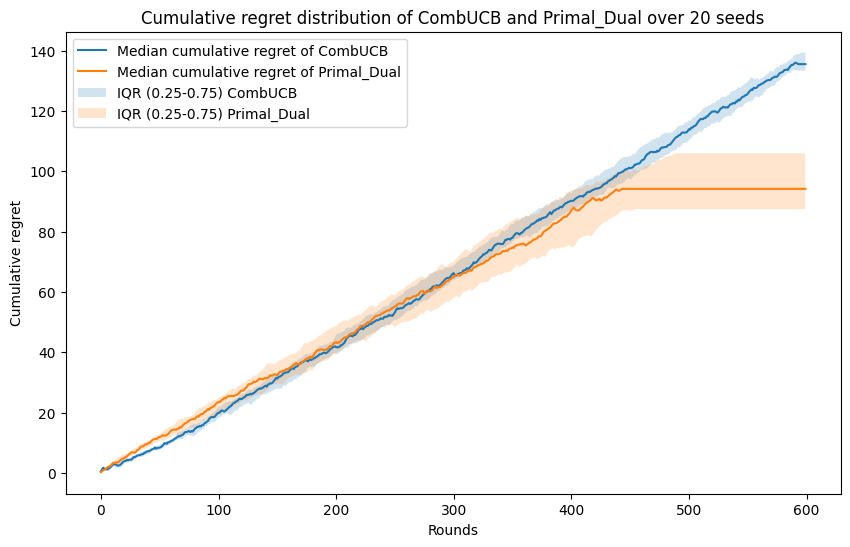

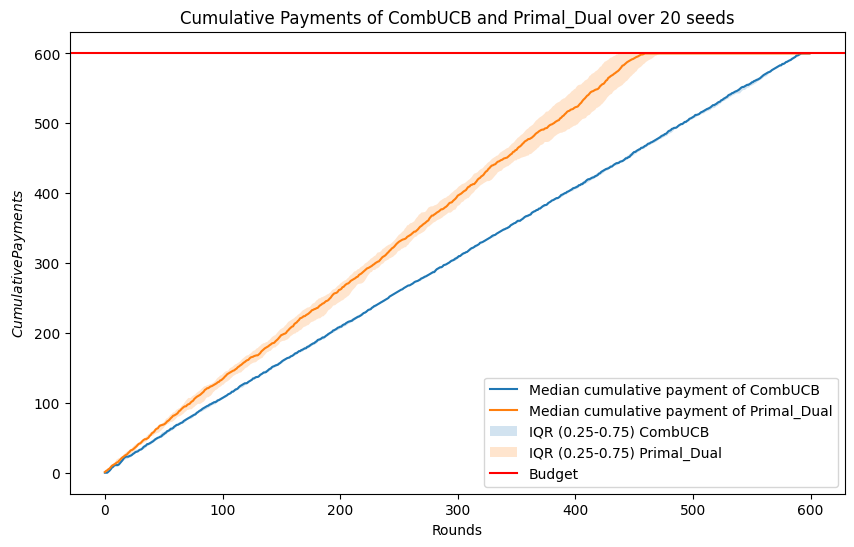

In [16]:
# Plot cumulative regret
plt.figure(figsize=(10,6))
plt.plot(median_regret_combgp, label='Median cumulative regret of CombUCB')
plt.plot(median_regret_pd, label='Median cumulative regret of Primal_Dual')
# Plot interquartile range 
plt.fill_between(range(T), lq_regret_combgp, hq_regret_combgp, alpha=0.2, label='IQR (0.25-0.75) CombUCB')
plt.fill_between(range(T), lq_regret_pd, hq_regret_pd, alpha=0.2, label='IQR (0.25-0.75) Primal_Dual')
plt.xlabel('Rounds')
plt.ylabel('Cumulative regret')
plt.title(f'Cumulative regret distribution of CombUCB and Primal_Dual over {len(seeds)} seeds')
plt.legend()
plt.show()

plt.figure(figsize=(10,6))
plt.plot(median_payments_combgp, label='Median cumulative payment of CombUCB')
plt.plot(median_payments_pd, label='Median cumulative payment of Primal_Dual')
# Plot interquartile range 
plt.fill_between(range(T), lq_payments_combgp, hq_payments_combgp, alpha=0.2, label='IQR (0.25-0.75) CombUCB')
plt.fill_between(range(T), lq_payments_pd, hq_payments_pd, alpha=0.2, label='IQR (0.25-0.75) Primal_Dual')
plt.xlabel('Rounds')
plt.ylabel('$Cumulative Payments$')
plt.axhline(budget, color='red', label='Budget')
plt.legend()
plt.title(f'Cumulative Payments of CombUCB and Primal_Dual over {len(seeds)} seeds')
plt.show()

With B = T and lots of intervals, the performances are very comparable, but the Primal-Dual at the end produces **sublinear** regret, while CombUCB-GP-SW has a **linear** regret.

##### Intermediate intervals

In [ ]:
run_one = 0
products = ['A','B','C']
budget = 600
T = 600
change_rounds = 30
U_T = int(T/change_rounds)
window = int(2*np.sqrt(T*np.log(T)/U_T))
#window = int(2*np.sqrt(np.log(T)))
seeds = [10123, 47281, 39502, 86734, 19285, 55012, 73190, 28461, 61027, 90834,
         45712, 67209, 31845, 82650, 14029, 59384, 71203, 40917, 28495, 63721]

fixed_prices = 0
if fixed_prices:
  K=10
  prices_per_product = np.linspace(0.01, 1, K)    
else:
  epsilon = T ** (-0.33)
  K = int(1 / epsilon)
  prices_per_product = np.linspace(0.01, 1, K)    

print(f'Discretizing prices with {K} values')
print(prices_per_product)
prices = {p: prices_per_product for p in products}
print(prices)

means = np.array([0.2, 0.5, 0.7])
covs = 0.01*np.array([[1., 0.3, 0.1],
                       [0.3, 1., 0.5],
                       [0.1, 0.5, 1]])

eta = T**(-0.6)
if run_one:
    utilities, _, _, clairv_util, fixed_hind_clair, _ = run_single_trial_combgp(0, products, prices, prices_per_product, budget, T, change_rounds, window, means, covs, seed=89)

    cum_utilities = np.cumsum(utilities)
    cum_clairv = np.cumsum(clairv_util)
    cum_clairv_fixed_hind = np.cumsum(fixed_hind_clair)

    avg_regret = cum_clairv - cum_utilities
    # avg_regret_fixed_hind = cum_clairv_fixed_hind - cum_utilities

    plt.figure(figsize=(10,6))
    plt.plot(avg_regret, label='Average Cumulative Regret')
    #plt.plot(avg_regret_fixed_hind, label='Average Cumulative Regret (Fixed, Hindsight)')
    plt.xlabel('Rounds')
    plt.ylabel('Cumulative Regret')
    plt.title('Average Regret vs Oracle over Multiple Trials')
    plt.legend()
    plt.show()

else:
    all_regrets_combgp, all_payments_combgp = run_all_trials_parallel_combgp(
    seeds, products, prices, prices_per_product, budget, T, change_rounds, window, means, covs, n_jobs=-1
    )
    all_regrets_combgp = np.array([np.pad(r, (0, T-len(r)), 'edge') for r in all_regrets_combgp])
    # Computes quantiles across trials for regret analysis
    lq_regret_combgp, median_regret_combgp, hq_regret_combgp = np.quantile(all_regrets_combgp, q=[0.25, 0.5, 0.75], axis=0)
    all_payments_combgp = np.array([np.pad(r, (0, T-len(r)), 'edge') for r in all_payments_combgp])
    lq_payments_combgp, median_payments_combgp, hq_payments_combgp = np.quantile(all_payments_combgp, q=[0.25, 0.5, 0.75], axis=0)

    all_regrets_pd, all_payments_pd = run_all_trials_parallel(
    seeds, products, prices, prices_per_product, budget, T, eta, K, means, covs, change_rounds, n_jobs=-1
    )
    all_regrets_pd = np.array([np.pad(r, (0, T-len(r)), 'edge') for r in all_regrets_pd])
    # Computes quantiles across trials for regret analysis
    lq_regret_pd, median_regret_pd, hq_regret_pd = np.quantile(all_regrets_pd, q=[0.25, 0.5, 0.75], axis=0)
    all_payments_pd = np.array([np.pad(r, (0, T-len(r)), 'edge') for r in all_payments_pd])
    lq_payments_pd, median_payments_pd, hq_payments_pd = np.quantile(all_payments_pd, q=[0.25, 0.5, 0.75], axis=0)

Discretizing prices with 8 values
[0.01       0.15142857 0.29285714 0.43428571 0.57571429 0.71714286
 0.85857143 1.        ]
{'A': array([0.01      , 0.15142857, 0.29285714, 0.43428571, 0.57571429,
       0.71714286, 0.85857143, 1.        ]), 'B': array([0.01      , 0.15142857, 0.29285714, 0.43428571, 0.57571429,
       0.71714286, 0.85857143, 1.        ]), 'C': array([0.01      , 0.15142857, 0.29285714, 0.43428571, 0.57571429,
       0.71714286, 0.85857143, 1.        ])}


Trial 1:   0%|          | 0/600 [00:00<?, ?it/s]














Trial 1:   2%|▏         | 14/600 [00:00<00:04, 135.78it/s]




















Trial 1:   5%|▍         | 28/600 [00:00<00:06, 89.18it/s] 

























Trial 1:   6%|▋         | 38/600 [00:00<00:08, 68.52it/s]















































Trial 1:   8%|▊         | 46/600 [00:00<00:10, 53.07it/s]

















Trial 1:   9%|▉         | 53/600 [00:00<00:09, 56.49it/s]














Trial 1:  10%|█         | 61/600 [00:00<00:09, 59.19it/s]


























Trial 1:  11%|█▏        | 68/600 [00:01<00:09, 55.19it/s]


















Trial 1:  12%|█▎        | 75/600 [00:01<00:08, 58.62it/s]






















Trial 1:  14%|█▎        | 82/600 [00:01<00:08, 57.90it/s]




















Trial 1:  15%|█▍        | 89/600 [00:01<00:08, 58.72it/s]



























Trial 1:  16%|█▌        | 96/600 [00:01<00:09, 52.53it/s]


























Trial 1:  17%|█▋        | 102/600 [

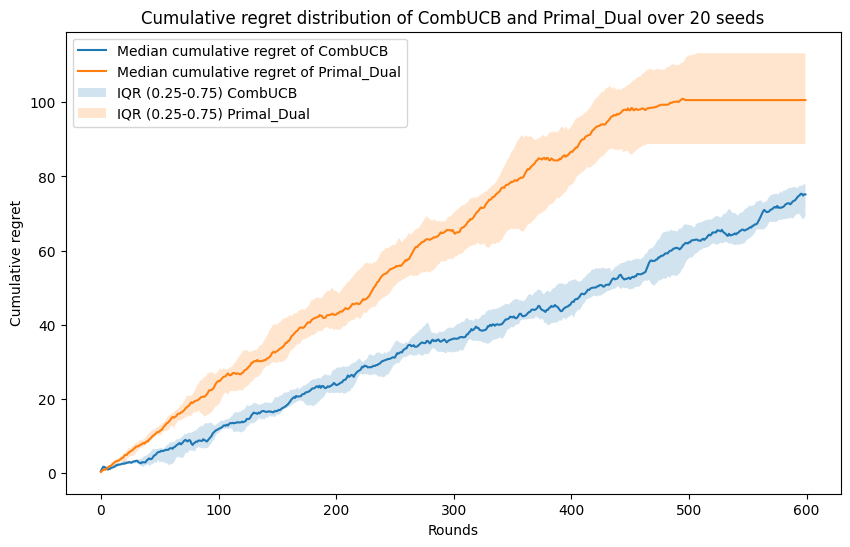

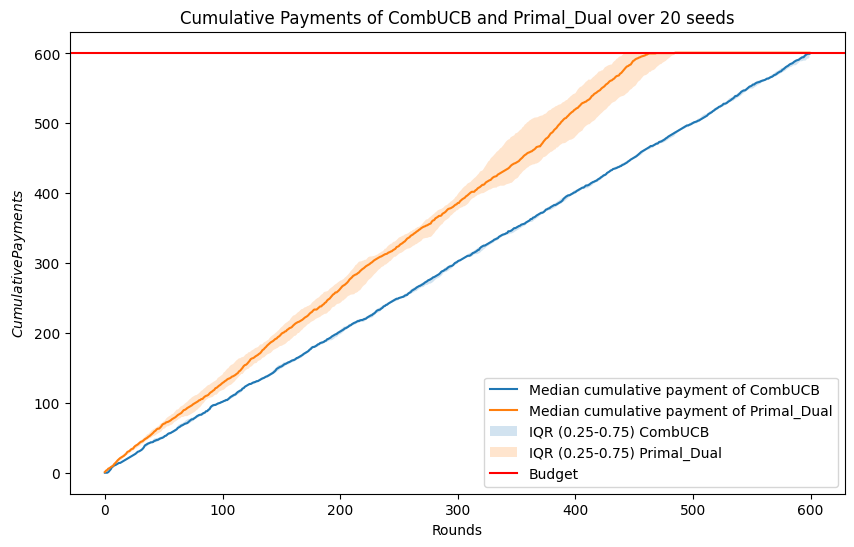

In [18]:
# Plot cumulative regret
plt.figure(figsize=(10,6))
plt.plot(median_regret_combgp, label='Median cumulative regret of CombUCB')
plt.plot(median_regret_pd, label='Median cumulative regret of Primal_Dual')
# Plot interquartile range 
plt.fill_between(range(T), lq_regret_combgp, hq_regret_combgp, alpha=0.2, label='IQR (0.25-0.75) CombUCB')
plt.fill_between(range(T), lq_regret_pd, hq_regret_pd, alpha=0.2, label='IQR (0.25-0.75) Primal_Dual')
plt.xlabel('Rounds')
plt.ylabel('Cumulative regret')
plt.title(f'Cumulative regret distribution of CombUCB and Primal_Dual over {len(seeds)} seeds')
plt.legend()
plt.show()

plt.figure(figsize=(10,6))
plt.plot(median_payments_combgp, label='Median cumulative payment of CombUCB')
plt.plot(median_payments_pd, label='Median cumulative payment of Primal_Dual')
# Plot interquartile range 
plt.fill_between(range(T), lq_payments_combgp, hq_payments_combgp, alpha=0.2, label='IQR (0.25-0.75) CombUCB')
plt.fill_between(range(T), lq_payments_pd, hq_payments_pd, alpha=0.2, label='IQR (0.25-0.75) Primal_Dual')
plt.xlabel('Rounds')
plt.ylabel('$Cumulative Payments$')
plt.axhline(budget, color='red', label='Budget')
plt.legend()
plt.title(f'Cumulative Payments of CombUCB and Primal_Dual over {len(seeds)} seeds')
plt.show()

Reducing the number of intervals, CombUCB-GP-SW produces the lowest regret, but with a curve that seems linear, while Primal-Dual has larger regret but **sublinear**

##### Large intervals (almost stationary)

In [ ]:
run_one = 0
products = ['A','B','C']
budget = 600
T = 600
change_rounds = 200
U_T = int(T/change_rounds)
window = int(2*np.sqrt(T*np.log(T)/U_T))
#window = int(2*np.sqrt(np.log(T)))
seeds = [10123, 47281, 39502, 86734, 19285, 55012, 73190, 28461, 61027, 90834,
         45712, 67209, 31845, 82650, 14029, 59384, 71203, 40917, 28495, 63721]

fixed_prices = 0
if fixed_prices:
  K=10
  prices_per_product = np.linspace(0.01, 1, K)    
else:
  epsilon = T ** (-0.33)
  K = int(1 / epsilon)
  prices_per_product = np.linspace(0.01, 1, K)    

print(f'Discretizing prices with {K} values')
print(prices_per_product)
prices = {p: prices_per_product for p in products}
print(prices)

means = np.array([0.2, 0.5, 0.7])
covs = 0.01*np.array([[1., 0.3, 0.1],
                       [0.3, 1., 0.5],
                       [0.1, 0.5, 1]])

eta = T**(-0.6)
if run_one:
    utilities, _, _, clairv_util, fixed_hind_clair, _ = run_single_trial_combgp(0, products, prices, prices_per_product, budget, T, change_rounds, window, means, covs, seed=89)

    cum_utilities = np.cumsum(utilities)
    cum_clairv = np.cumsum(clairv_util)
    cum_clairv_fixed_hind = np.cumsum(fixed_hind_clair)

    avg_regret = cum_clairv - cum_utilities
    # avg_regret_fixed_hind = cum_clairv_fixed_hind - cum_utilities

    plt.figure(figsize=(10,6))
    plt.plot(avg_regret, label='Average Cumulative Regret')
    #plt.plot(avg_regret_fixed_hind, label='Average Cumulative Regret (Fixed, Hindsight)')
    plt.xlabel('Rounds')
    plt.ylabel('Cumulative Regret')
    plt.title('Average Regret vs Oracle over Multiple Trials')
    plt.legend()
    plt.show()

else:
    all_regrets_combgp, all_payments_combgp = run_all_trials_parallel_combgp(
    seeds, products, prices, prices_per_product, budget, T, change_rounds, window, means, covs, n_jobs=-1
    )
    all_regrets_combgp = np.array([np.pad(r, (0, T-len(r)), 'edge') for r in all_regrets_combgp])
    # Computes quantiles across trials for regret analysis
    lq_regret_combgp, median_regret_combgp, hq_regret_combgp = np.quantile(all_regrets_combgp, q=[0.25, 0.5, 0.75], axis=0)
    all_payments_combgp = np.array([np.pad(r, (0, T-len(r)), 'edge') for r in all_payments_combgp])
    lq_payments_combgp, median_payments_combgp, hq_payments_combgp = np.quantile(all_payments_combgp, q=[0.25, 0.5, 0.75], axis=0)

    all_regrets_pd, all_payments_pd = run_all_trials_parallel(
    seeds, products, prices, prices_per_product, budget, T, eta, K, means, covs, change_rounds, n_jobs=-1
    )
    all_regrets_pd = np.array([np.pad(r, (0, T-len(r)), 'edge') for r in all_regrets_pd])
    # Computes quantiles across trials for regret analysis
    lq_regret_pd, median_regret_pd, hq_regret_pd = np.quantile(all_regrets_pd, q=[0.25, 0.5, 0.75], axis=0)
    all_payments_pd = np.array([np.pad(r, (0, T-len(r)), 'edge') for r in all_payments_pd])
    lq_payments_pd, median_payments_pd, hq_payments_pd = np.quantile(all_payments_pd, q=[0.25, 0.5, 0.75], axis=0)

Discretizing prices with 8 values
[0.01       0.15142857 0.29285714 0.43428571 0.57571429 0.71714286
 0.85857143 1.        ]
{'A': array([0.01      , 0.15142857, 0.29285714, 0.43428571, 0.57571429,
       0.71714286, 0.85857143, 1.        ]), 'B': array([0.01      , 0.15142857, 0.29285714, 0.43428571, 0.57571429,
       0.71714286, 0.85857143, 1.        ]), 'C': array([0.01      , 0.15142857, 0.29285714, 0.43428571, 0.57571429,
       0.71714286, 0.85857143, 1.        ])}


Trial 1:   0%|          | 0/600 [00:00<?, ?it/s]














Trial 1:   2%|▏         | 14/600 [00:00<00:04, 129.58it/s]




























Trial 1:   4%|▍         | 27/600 [00:00<00:06, 89.04it/s] 
















Trial 1:   6%|▌         | 37/600 [00:00<00:07, 78.00it/s]
























Trial 1:   8%|▊         | 46/600 [00:00<00:07, 74.47it/s]
























Trial 1:   9%|▉         | 54/600 [00:00<00:07, 69.51it/s]





















Trial 1:  10%|█         | 62/600 [00:00<00:08, 63.93it/s]




















Trial 1:  12%|█▏        | 69/600 [00:00<00:08, 62.28it/s]




















Trial 1:  13%|█▎        | 76/600 [00:01<00:08, 62.45it/s]




















Trial 1:  14%|█▍        | 83/600 [00:01<00:08, 61.97it/s]






















Trial 1:  15%|█▌        | 90/600 [00:01<00:09, 56.53it/s]


















Trial 1:  16%|█▌        | 96/600 [00:01<00:08, 57.33it/s]






















Trial 1:  17%|█▋        | 102/600 [00:01<00:09, 55.00it/s]





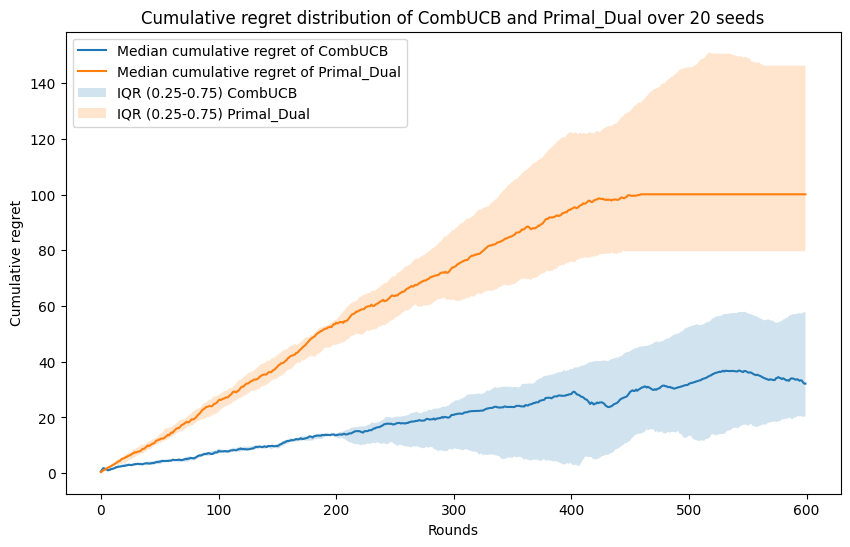

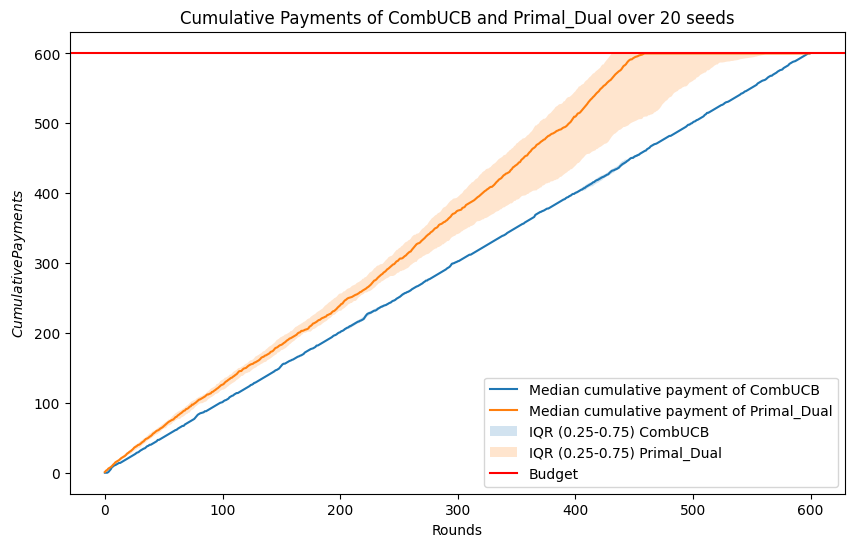

In [ ]:
# Plot cumulative regret
plt.figure(figsize=(10,6))
plt.plot(median_regret_combgp, label='Median cumulative regret of CombUCB')
plt.plot(median_regret_pd, label='Median cumulative regret of Primal_Dual')
# Plot interquartile range 
plt.fill_between(range(T), lq_regret_combgp, hq_regret_combgp, alpha=0.2, label='IQR (0.25-0.75) CombUCB')
plt.fill_between(range(T), lq_regret_pd, hq_regret_pd, alpha=0.2, label='IQR (0.25-0.75) Primal_Dual')
plt.xlabel('Rounds')
plt.ylabel('Cumulative regret')
plt.title(f'Cumulative regret distribution of CombUCB and Primal_Dual over {len(seeds)} seeds')
plt.legend()
plt.show()

plt.figure(figsize=(10,6))
plt.plot(median_payments_combgp, label='Median cumulative payment of CombUCB')
plt.plot(median_payments_pd, label='Median cumulative payment of Primal_Dual')
# Plot interquartile range 
plt.fill_between(range(T), lq_payments_combgp, hq_payments_combgp, alpha=0.2, label='IQR (0.25-0.75) CombUCB')
plt.fill_between(range(T), lq_payments_pd, hq_payments_pd, alpha=0.2, label='IQR (0.25-0.75) Primal_Dual')
plt.xlabel('Rounds')
plt.ylabel('$Cumulative Payments$')
plt.axhline(budget, color='red', label='Budget')
plt.legend()
plt.title(f'Cumulative Payments of CombUCB and Primal_Dual over {len(seeds)} seeds')
plt.show()

Both have **sublinear** regret, but hte regret of CombUCB-GP-SW is lower than the one of Primal-Dual.

#### Multiple Trials B > T

##### Small intervals (highly non stationary)

In [ ]:
run_one = 0
products = ['A','B','C']
budget = 800
T = 600
change_rounds = 3
U_T = int(T/change_rounds)
window = int(2*np.sqrt(T*np.log(T)/U_T))
#window = int(2*np.sqrt(np.log(T)))
seeds = [10123, 47281, 39502, 86734, 19285, 55012, 73190, 28461, 61027, 90834,
         45712, 67209, 31845, 82650, 14029, 59384, 71203, 40917, 28495, 63721]

fixed_prices = 0
if fixed_prices:
  K=10
  prices_per_product = np.linspace(0.01, 1, K)    
  # prices_per_product = np.array([0, 0.05, 0.1, 0.15, 0.20, 0.25, 0.30, 0.35, 0.4, 0.45, 0.5, 0.55, 0.6, 0.65, 0.7, 0.75, 0.8, 0.85, 0.9, 0.95, 1.0])
else:
  epsilon = T ** (-0.33)
  K = int(1 / epsilon)
  prices_per_product = np.linspace(0.01, 1, K)    

print(f'Discretizing prices with {K} values')
print(prices_per_product)
prices = {p: prices_per_product for p in products}
print(prices)

means = np.array([0.2, 0.5, 0.7])
covs = 0.01*np.array([[1., 0.3, 0.1],
                       [0.3, 1., 0.5],
                       [0.1, 0.5, 1]])

eta = T**(-0.6)
if run_one:
    utilities, _, _, clairv_util, fixed_hind_clair, _ = run_single_trial_combgp(0, products, prices, prices_per_product, budget, T, change_rounds, window, means, covs, seed=89)

    cum_utilities = np.cumsum(utilities)
    cum_clairv = np.cumsum(clairv_util)
    cum_clairv_fixed_hind = np.cumsum(fixed_hind_clair)

    avg_regret = cum_clairv - cum_utilities
    # avg_regret_fixed_hind = cum_clairv_fixed_hind - cum_utilities

    plt.figure(figsize=(10,6))
    plt.plot(avg_regret, label='Average Cumulative Regret')
    #plt.plot(avg_regret_fixed_hind, label='Average Cumulative Regret (Fixed, Hindsight)')
    plt.xlabel('Rounds')
    plt.ylabel('Cumulative Regret')
    plt.title('Average Regret vs Oracle over Multiple Trials')
    plt.legend()
    plt.show()

else:
    all_regrets_combgp, all_payments_combgp = run_all_trials_parallel_combgp(
    seeds, products, prices, prices_per_product, budget, T, change_rounds, window, means, covs, n_jobs=-1
    )
    all_regrets_combgp = np.array([np.pad(r, (0, T-len(r)), 'edge') for r in all_regrets_combgp])
    # Computes quantiles across trials for regret analysis
    lq_regret_combgp, median_regret_combgp, hq_regret_combgp = np.quantile(all_regrets_combgp, q=[0.25, 0.5, 0.75], axis=0)
    all_payments_combgp = np.array([np.pad(r, (0, T-len(r)), 'edge') for r in all_payments_combgp])
    lq_payments_combgp, median_payments_combgp, hq_payments_combgp = np.quantile(all_payments_combgp, q=[0.25, 0.5, 0.75], axis=0)

    all_regrets_pd, all_payments_pd = run_all_trials_parallel(
    seeds, products, prices, prices_per_product, budget, T, eta, K, means, covs, change_rounds, n_jobs=-1
    )
    all_regrets_pd = np.array([np.pad(r, (0, T-len(r)), 'edge') for r in all_regrets_pd])
    # Computes quantiles across trials for regret analysis
    lq_regret_pd, median_regret_pd, hq_regret_pd = np.quantile(all_regrets_pd, q=[0.25, 0.5, 0.75], axis=0)
    all_payments_pd = np.array([np.pad(r, (0, T-len(r)), 'edge') for r in all_payments_pd])
    lq_payments_pd, median_payments_pd, hq_payments_pd = np.quantile(all_payments_pd, q=[0.25, 0.5, 0.75], axis=0)

Discretizing prices with 8 values
[0.01       0.15142857 0.29285714 0.43428571 0.57571429 0.71714286
 0.85857143 1.        ]
{'A': array([0.01      , 0.15142857, 0.29285714, 0.43428571, 0.57571429,
       0.71714286, 0.85857143, 1.        ]), 'B': array([0.01      , 0.15142857, 0.29285714, 0.43428571, 0.57571429,
       0.71714286, 0.85857143, 1.        ]), 'C': array([0.01      , 0.15142857, 0.29285714, 0.43428571, 0.57571429,
       0.71714286, 0.85857143, 1.        ])}


Trial 1:   0%|          | 0/600 [00:00<?, ?it/s]














Trial 1:   2%|▏         | 13/600 [00:00<00:05, 114.82it/s]













































Trial 1:   4%|▍         | 25/600 [00:00<00:11, 48.84it/s] 

































Trial 1:   5%|▌         | 32/600 [00:00<00:13, 42.64it/s]





















Trial 1:   6%|▋         | 38/600 [00:00<00:13, 42.03it/s]

























Trial 1:   7%|▋         | 43/600 [00:00<00:14, 38.13it/s]










Trial 1:   8%|▊         | 48/600 [00:01<00:13, 39.65it/s]




















Trial 1:   9%|▉         | 53/600 [00:01<00:14, 38.28it/s]
























Trial 1:  10%|▉         | 57/600 [00:01<00:14, 37.38it/s]







Trial 1:  10%|█         | 61/600 [00:01<00:14, 37.63it/s]


















Trial 1:  11%|█         | 66/600 [00:01<00:13, 39.97it/s]




















Trial 1:  12%|█▏        | 71/600 [00:01<00:13, 38.54it/s]




















Trial 1:  12%|█▎        | 75/600 [00:01<00:17, 30.71it

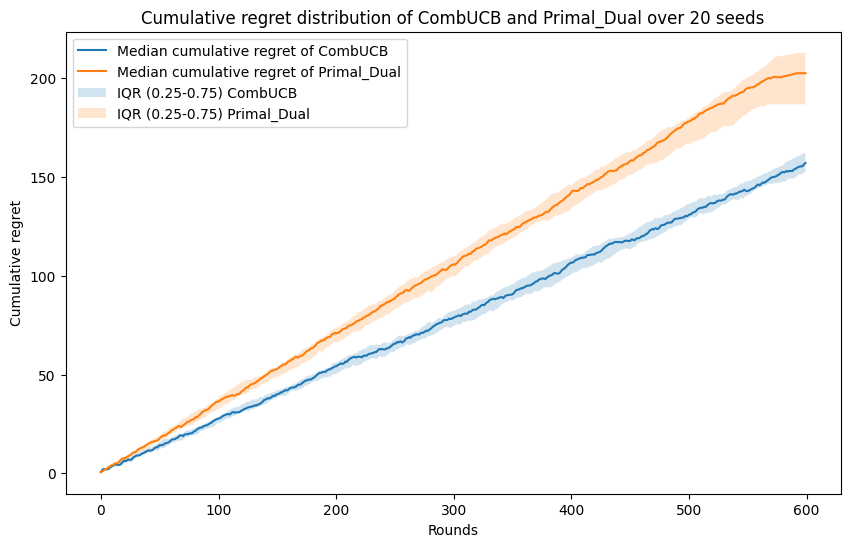

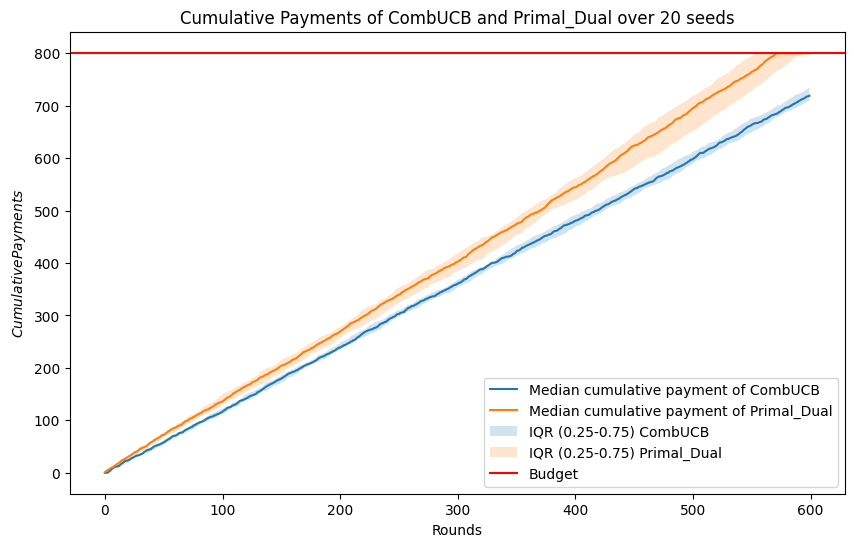

In [22]:
# Plot cumulative regret
plt.figure(figsize=(10,6))
plt.plot(median_regret_combgp, label='Median cumulative regret of CombUCB')
plt.plot(median_regret_pd, label='Median cumulative regret of Primal_Dual')
# Plot interquartile range 
plt.fill_between(range(T), lq_regret_combgp, hq_regret_combgp, alpha=0.2, label='IQR (0.25-0.75) CombUCB')
plt.fill_between(range(T), lq_regret_pd, hq_regret_pd, alpha=0.2, label='IQR (0.25-0.75) Primal_Dual')
plt.xlabel('Rounds')
plt.ylabel('Cumulative regret')
plt.title(f'Cumulative regret distribution of CombUCB and Primal_Dual over {len(seeds)} seeds')
plt.legend()
plt.show()

plt.figure(figsize=(10,6))
plt.plot(median_payments_combgp, label='Median cumulative payment of CombUCB')
plt.plot(median_payments_pd, label='Median cumulative payment of Primal_Dual')
# Plot interquartile range 
plt.fill_between(range(T), lq_payments_combgp, hq_payments_combgp, alpha=0.2, label='IQR (0.25-0.75) CombUCB')
plt.fill_between(range(T), lq_payments_pd, hq_payments_pd, alpha=0.2, label='IQR (0.25-0.75) Primal_Dual')
plt.xlabel('Rounds')
plt.ylabel('$Cumulative Payments$')
plt.axhline(budget, color='red', label='Budget')
plt.legend()
plt.title(f'Cumulative Payments of CombUCB and Primal_Dual over {len(seeds)} seeds')
plt.show()

##### Intermediate intervals

In [ ]:
run_one = 0
products = ['A','B','C']
budget = 800
T = 600
change_rounds = 30
U_T = int(T/change_rounds)
window = int(2*np.sqrt(T*np.log(T)/U_T))
#window = int(2*np.sqrt(np.log(T)))
seeds = [10123, 47281, 39502, 86734, 19285, 55012, 73190, 28461, 61027, 90834,
         45712, 67209, 31845, 82650, 14029, 59384, 71203, 40917, 28495, 63721]

fixed_prices = 0
if fixed_prices:
  K=10
  prices_per_product = np.linspace(0.01, 1, K)    
  # prices_per_product = np.array([0, 0.05, 0.1, 0.15, 0.20, 0.25, 0.30, 0.35, 0.4, 0.45, 0.5, 0.55, 0.6, 0.65, 0.7, 0.75, 0.8, 0.85, 0.9, 0.95, 1.0])
else:
  epsilon = T ** (-0.33)
  K = int(1 / epsilon)
  prices_per_product = np.linspace(0.01, 1, K)    

print(f'Discretizing prices with {K} values')
print(prices_per_product)
prices = {p: prices_per_product for p in products}
print(prices)

means = np.array([0.2, 0.5, 0.7])
covs = 0.01*np.array([[1., 0.3, 0.1],
                       [0.3, 1., 0.5],
                       [0.1, 0.5, 1]])

eta = T**(-0.6)
if run_one:
    utilities, _, _, clairv_util, fixed_hind_clair, _ = run_single_trial_combgp(0, products, prices, prices_per_product, budget, T, change_rounds, window, means, covs, seed=89)

    cum_utilities = np.cumsum(utilities)
    cum_clairv = np.cumsum(clairv_util)
    cum_clairv_fixed_hind = np.cumsum(fixed_hind_clair)

    avg_regret = cum_clairv - cum_utilities
    # avg_regret_fixed_hind = cum_clairv_fixed_hind - cum_utilities

    plt.figure(figsize=(10,6))
    plt.plot(avg_regret, label='Average Cumulative Regret')
    #plt.plot(avg_regret_fixed_hind, label='Average Cumulative Regret (Fixed, Hindsight)')
    plt.xlabel('Rounds')
    plt.ylabel('Cumulative Regret')
    plt.title('Average Regret vs Oracle over Multiple Trials')
    plt.legend()
    plt.show()

else:
    all_regrets_combgp, all_payments_combgp = run_all_trials_parallel_combgp(
    seeds, products, prices, prices_per_product, budget, T, change_rounds, window, means, covs, n_jobs=-1
    )
    all_regrets_combgp = np.array([np.pad(r, (0, T-len(r)), 'edge') for r in all_regrets_combgp])
    # Computes quantiles across trials for regret analysis
    lq_regret_combgp, median_regret_combgp, hq_regret_combgp = np.quantile(all_regrets_combgp, q=[0.25, 0.5, 0.75], axis=0)
    all_payments_combgp = np.array([np.pad(r, (0, T-len(r)), 'edge') for r in all_payments_combgp])
    lq_payments_combgp, median_payments_combgp, hq_payments_combgp = np.quantile(all_payments_combgp, q=[0.25, 0.5, 0.75], axis=0)

    all_regrets_pd, all_payments_pd = run_all_trials_parallel(
    seeds, products, prices, prices_per_product, budget, T, eta, K, means, covs, change_rounds, n_jobs=-1
    )
    all_regrets_pd = np.array([np.pad(r, (0, T-len(r)), 'edge') for r in all_regrets_pd])
    # Computes quantiles across trials for regret analysis
    lq_regret_pd, median_regret_pd, hq_regret_pd = np.quantile(all_regrets_pd, q=[0.25, 0.5, 0.75], axis=0)
    all_payments_pd = np.array([np.pad(r, (0, T-len(r)), 'edge') for r in all_payments_pd])
    lq_payments_pd, median_payments_pd, hq_payments_pd = np.quantile(all_payments_pd, q=[0.25, 0.5, 0.75], axis=0)

Discretizing prices with 8 values
[0.01       0.15142857 0.29285714 0.43428571 0.57571429 0.71714286
 0.85857143 1.        ]
{'A': array([0.01      , 0.15142857, 0.29285714, 0.43428571, 0.57571429,
       0.71714286, 0.85857143, 1.        ]), 'B': array([0.01      , 0.15142857, 0.29285714, 0.43428571, 0.57571429,
       0.71714286, 0.85857143, 1.        ]), 'C': array([0.01      , 0.15142857, 0.29285714, 0.43428571, 0.57571429,
       0.71714286, 0.85857143, 1.        ])}


Trial 1:   0%|          | 0/600 [00:00<?, ?it/s]





Trial 1:   2%|▏         | 11/600 [00:00<00:06, 89.37it/s]











Trial 1:   3%|▎         | 20/600 [00:00<00:06, 84.76it/s]












Trial 1:   5%|▍         | 29/600 [00:00<00:07, 78.74it/s]




























Trial 1:   6%|▌         | 37/600 [00:00<00:09, 62.36it/s]











Trial 1:   7%|▋         | 44/600 [00:00<00:08, 63.60it/s]
















Trial 1:   8%|▊         | 51/600 [00:00<00:09, 60.29it/s]















Trial 1:  10%|▉         | 58/600 [00:00<00:08, 61.33it/s]






































Trial 1:  11%|█         | 65/600 [00:01<00:10, 52.59it/s]




















Trial 1:  12%|█▏        | 71/600 [00:01<00:10, 51.45it/s]






















Trial 1:  13%|█▎        | 77/600 [00:01<00:10, 48.23it/s]


















Trial 1:  14%|█▍        | 83/600 [00:01<00:10, 49.46it/s]











Trial 1:  15%|█▍        | 89/600 [00:01<00:09, 51.29it/s]


















































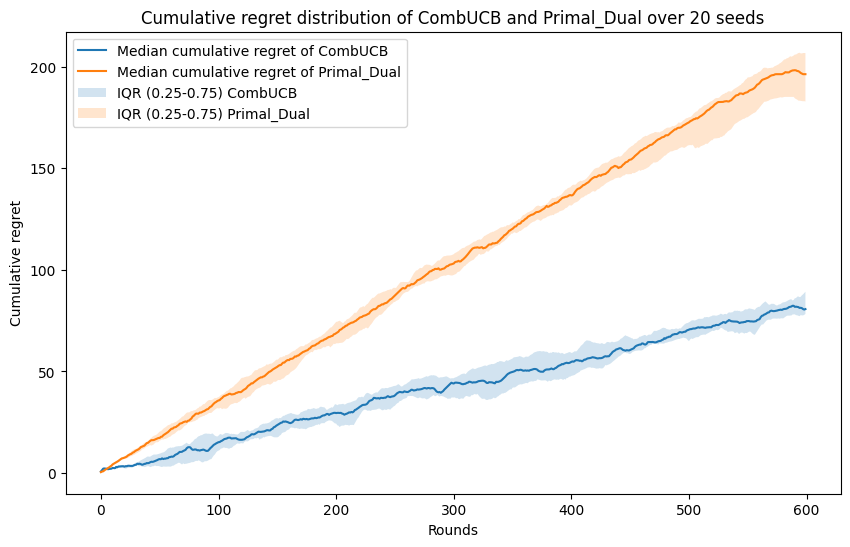

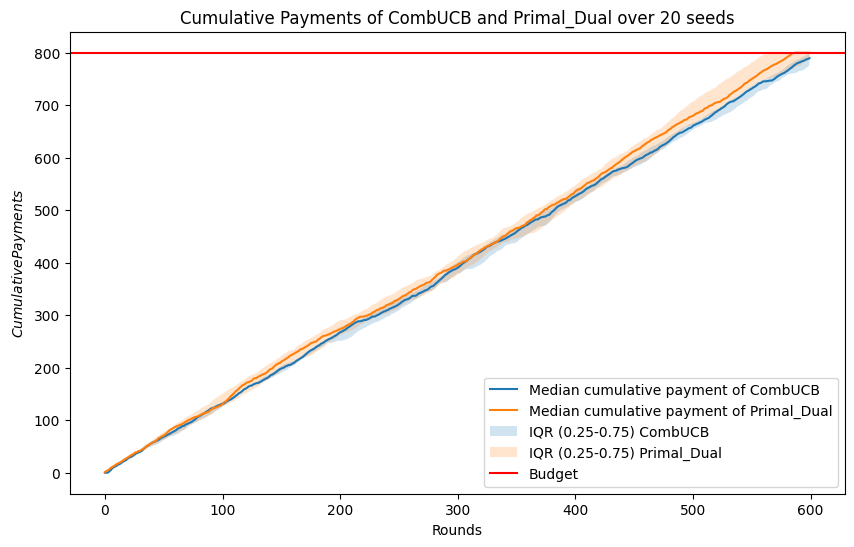

In [24]:
# Plot cumulative regret
plt.figure(figsize=(10,6))
plt.plot(median_regret_combgp, label='Median cumulative regret of CombUCB')
plt.plot(median_regret_pd, label='Median cumulative regret of Primal_Dual')
# Plot interquartile range 
plt.fill_between(range(T), lq_regret_combgp, hq_regret_combgp, alpha=0.2, label='IQR (0.25-0.75) CombUCB')
plt.fill_between(range(T), lq_regret_pd, hq_regret_pd, alpha=0.2, label='IQR (0.25-0.75) Primal_Dual')
plt.xlabel('Rounds')
plt.ylabel('Cumulative regret')
plt.title(f'Cumulative regret distribution of CombUCB and Primal_Dual over {len(seeds)} seeds')
plt.legend()
plt.show()

plt.figure(figsize=(10,6))
plt.plot(median_payments_combgp, label='Median cumulative payment of CombUCB')
plt.plot(median_payments_pd, label='Median cumulative payment of Primal_Dual')
# Plot interquartile range 
plt.fill_between(range(T), lq_payments_combgp, hq_payments_combgp, alpha=0.2, label='IQR (0.25-0.75) CombUCB')
plt.fill_between(range(T), lq_payments_pd, hq_payments_pd, alpha=0.2, label='IQR (0.25-0.75) Primal_Dual')
plt.xlabel('Rounds')
plt.ylabel('$Cumulative Payments$')
plt.axhline(budget, color='red', label='Budget')
plt.legend()
plt.title(f'Cumulative Payments of CombUCB and Primal_Dual over {len(seeds)} seeds')
plt.show()

##### Large intervals (almost stationary)

In [ ]:
run_one = 0
products = ['A','B','C']
budget = 800
T = 600
change_rounds = 200
U_T = int(T/change_rounds)
window = int(2*np.sqrt(T*np.log(T)/U_T))
#window = int(2*np.sqrt(np.log(T)))
seeds = [10123, 47281, 39502, 86734, 19285, 55012, 73190, 28461, 61027, 90834,
         45712, 67209, 31845, 82650, 14029, 59384, 71203, 40917, 28495, 63721]

fixed_prices = 0
if fixed_prices:
  K=10
  prices_per_product = np.linspace(0.01, 1, K)    
  # prices_per_product = np.array([0, 0.05, 0.1, 0.15, 0.20, 0.25, 0.30, 0.35, 0.4, 0.45, 0.5, 0.55, 0.6, 0.65, 0.7, 0.75, 0.8, 0.85, 0.9, 0.95, 1.0])
else:
  epsilon = T ** (-0.33)
  K = int(1 / epsilon)
  prices_per_product = np.linspace(0.01, 1, K)    

print(f'Discretizing prices with {K} values')
print(prices_per_product)
prices = {p: prices_per_product for p in products}
print(prices)

means = np.array([0.2, 0.5, 0.7])
covs = 0.01*np.array([[1., 0.3, 0.1],
                       [0.3, 1., 0.5],
                       [0.1, 0.5, 1]])

eta = T**(-0.6)
if run_one:
    utilities, _, _, clairv_util, fixed_hind_clair, _ = run_single_trial_combgp(0, products, prices, prices_per_product, budget, T, change_rounds, window, means, covs, seed=89)

    cum_utilities = np.cumsum(utilities)
    cum_clairv = np.cumsum(clairv_util)
    cum_clairv_fixed_hind = np.cumsum(fixed_hind_clair)

    avg_regret = cum_clairv - cum_utilities
    # avg_regret_fixed_hind = cum_clairv_fixed_hind - cum_utilities

    plt.figure(figsize=(10,6))
    plt.plot(avg_regret, label='Average Cumulative Regret')
    #plt.plot(avg_regret_fixed_hind, label='Average Cumulative Regret (Fixed, Hindsight)')
    plt.xlabel('Rounds')
    plt.ylabel('Cumulative Regret')
    plt.title('Average Regret vs Oracle over Multiple Trials')
    plt.legend()
    plt.show()

else:
    all_regrets_combgp, all_payments_combgp = run_all_trials_parallel_combgp(
    seeds, products, prices, prices_per_product, budget, T, change_rounds, window, means, covs, n_jobs=-1
    )
    all_regrets_combgp = np.array([np.pad(r, (0, T-len(r)), 'edge') for r in all_regrets_combgp])
    # Computes quantiles across trials for regret analysis
    lq_regret_combgp, median_regret_combgp, hq_regret_combgp = np.quantile(all_regrets_combgp, q=[0.25, 0.5, 0.75], axis=0)
    all_payments_combgp = np.array([np.pad(r, (0, T-len(r)), 'edge') for r in all_payments_combgp])
    lq_payments_combgp, median_payments_combgp, hq_payments_combgp = np.quantile(all_payments_combgp, q=[0.25, 0.5, 0.75], axis=0)

    all_regrets_pd, all_payments_pd = run_all_trials_parallel(
    seeds, products, prices, prices_per_product, budget, T, eta, K, means, covs, change_rounds, n_jobs=-1
    )
    all_regrets_pd = np.array([np.pad(r, (0, T-len(r)), 'edge') for r in all_regrets_pd])
    # Computes quantiles across trials for regret analysis
    lq_regret_pd, median_regret_pd, hq_regret_pd = np.quantile(all_regrets_pd, q=[0.25, 0.5, 0.75], axis=0)
    all_payments_pd = np.array([np.pad(r, (0, T-len(r)), 'edge') for r in all_payments_pd])
    lq_payments_pd, median_payments_pd, hq_payments_pd = np.quantile(all_payments_pd, q=[0.25, 0.5, 0.75], axis=0)

Discretizing prices with 8 values
[0.01       0.15142857 0.29285714 0.43428571 0.57571429 0.71714286
 0.85857143 1.        ]
{'A': array([0.01      , 0.15142857, 0.29285714, 0.43428571, 0.57571429,
       0.71714286, 0.85857143, 1.        ]), 'B': array([0.01      , 0.15142857, 0.29285714, 0.43428571, 0.57571429,
       0.71714286, 0.85857143, 1.        ]), 'C': array([0.01      , 0.15142857, 0.29285714, 0.43428571, 0.57571429,
       0.71714286, 0.85857143, 1.        ])}


Trial 1:   0%|          | 0/600 [00:00<?, ?it/s]









Trial 1:   3%|▎         | 16/600 [00:00<00:03, 159.76it/s]














































Trial 1:   5%|▌         | 32/600 [00:00<00:09, 57.27it/s] 




















Trial 1:   8%|▊         | 45/600 [00:00<00:07, 73.63it/s]
































Trial 1:   9%|▉         | 56/600 [00:00<00:08, 64.87it/s]
























Trial 1:  11%|█         | 65/600 [00:00<00:08, 64.75it/s]




















Trial 1:  12%|█▏        | 73/600 [00:01<00:08, 63.78it/s]




















Trial 1:  14%|█▎        | 81/600 [00:01<00:08, 61.69it/s]




















Trial 1:  15%|█▍        | 88/600 [00:01<00:08, 60.46it/s]






















Trial 1:  16%|█▌        | 95/600 [00:01<00:08, 58.09it/s]






























Trial 1:  17%|█▋        | 102/600 [00:01<00:09, 50.76it/s]




















Trial 1:  18%|█▊        | 109/600 [00:01<00:09, 54.21it/s]















Trial 1:  19%|█▉        | 115/6

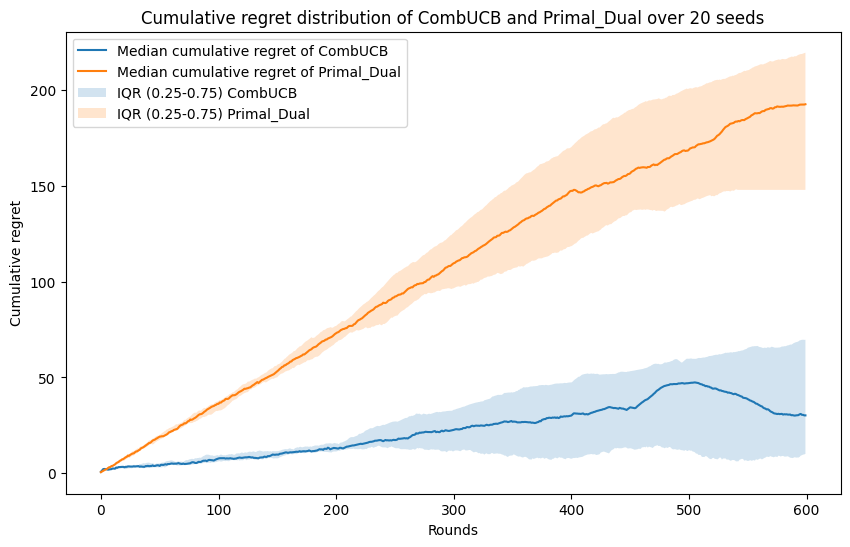

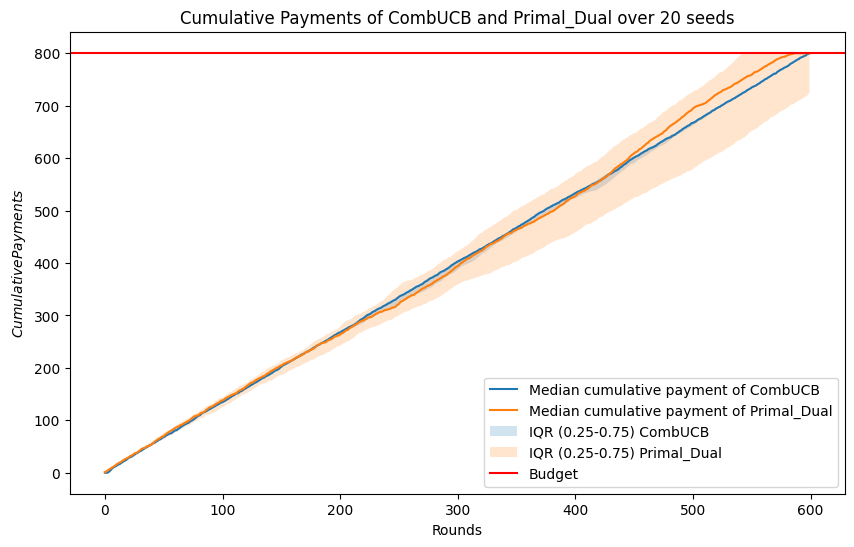

In [26]:
# Plot cumulative regret
plt.figure(figsize=(10,6))
plt.plot(median_regret_combgp, label='Median cumulative regret of CombUCB')
plt.plot(median_regret_pd, label='Median cumulative regret of Primal_Dual')
# Plot interquartile range 
plt.fill_between(range(T), lq_regret_combgp, hq_regret_combgp, alpha=0.2, label='IQR (0.25-0.75) CombUCB')
plt.fill_between(range(T), lq_regret_pd, hq_regret_pd, alpha=0.2, label='IQR (0.25-0.75) Primal_Dual')
plt.xlabel('Rounds')
plt.ylabel('Cumulative regret')
plt.title(f'Cumulative regret distribution of CombUCB and Primal_Dual over {len(seeds)} seeds')
plt.legend()
plt.show()

plt.figure(figsize=(10,6))
plt.plot(median_payments_combgp, label='Median cumulative payment of CombUCB')
plt.plot(median_payments_pd, label='Median cumulative payment of Primal_Dual')
# Plot interquartile range 
plt.fill_between(range(T), lq_payments_combgp, hq_payments_combgp, alpha=0.2, label='IQR (0.25-0.75) CombUCB')
plt.fill_between(range(T), lq_payments_pd, hq_payments_pd, alpha=0.2, label='IQR (0.25-0.75) Primal_Dual')
plt.xlabel('Rounds')
plt.ylabel('$Cumulative Payments$')
plt.axhline(budget, color='red', label='Budget')
plt.legend()
plt.title(f'Cumulative Payments of CombUCB and Primal_Dual over {len(seeds)} seeds')
plt.show()

In these three cases, with B > T, the CombUCB-GP-SW has better performances with all the specific number of intervals because as we know, Primal-Dual struggles a lot with B > T, but it is still able to produce **sublinear** regret, although outperformed by CombUCB-GP-SW, which has less problems with B > T. 